In [2]:
import pandas as pd
import numpy as np

import matplotlib.pyplot as plt
import seaborn as sns
import time

pd.set_option('display.max_columns', None)
import warnings 
warnings.filterwarnings('ignore')

In [3]:
import scipy.stats
from sklearn.preprocessing import StandardScaler,RobustScaler
from sklearn.cluster import KMeans
from sklearn.metrics import precision_score ,f1_score ,roc_auc_score, accuracy_score,recall_score, log_loss
from sklearn.decomposition import PCA
from sklearn.ensemble import RandomForestClassifier
from sklearn.feature_selection import mutual_info_classif
from sklearn.feature_extraction import DictVectorizer


In [4]:
def Convert_Time(row): 
    tokens = row.split(':')
    if len(tokens) ==2:
        return int(tokens[0]) + int(tokens[1])/60
    
def Rest_days(row):
    if isinstance(row,int) or isinstance(row,float):
        return row
    tokens = row.split(' ')
    return int(tokens[0])

def get_matches_played_in_szn(df):
    df = df.copy()
    gp_arr=[]
    for year,yr_df in df.groupby('Season'):
        for team,team_df in yr_df.groupby('Team'):
            team_df['Matches_Played'] = 1
            gd_cum = team_df['Matches_Played'].cumsum()
            gp_arr.append(gd_cum)
    cum = pd.concat(gp_arr)
    cum = cum.sort_index()
    #cum.columns = cum_cols
    df_with_cum = pd.concat([df,cum],axis=1)
    return df_with_cum

def get_cum_by_col(df,grouper,grouper_name,cols,agg_func):
    df = df.copy()
    gp_arr=[]
    for team,team_df in df.groupby('Team'):
        for g,gd in team_df.groupby([grouper])[cols]:
            #print(g)
            #display(gd)
            if agg_func == 'sum':
                gd_cum = gd.shift(1).cumsum()
            if agg_func == 'mean':
                gd_cum = gd.shift(1).expanding().mean()
            for col in cols:
                gd_cum[col].fillna(gd_cum[col].mean(), inplace=True)
            gp_arr.append(gd_cum)
    cum = pd.concat(gp_arr)
    cum = cum.sort_index()
    alias = '_this_'+grouper_name+'_'+agg_func
    cum_cols = [col+alias for col in cols]
    cum.columns = cum_cols
    df_with_cum = pd.concat([df,cum],axis=1)
    return df_with_cum 

def rolling_average_or_sum(df,cols,window,agg_func):
    df = df.copy()
    alias = '_last_'+str(window)+'gm_'+agg_func
    new_cols = [col+alias for col in cols]
    gp_arr=[]
    for year,yr_df in df.groupby('Season'):
        for team,team_df in yr_df.groupby('Team'):
            #for g,gd in team_df.groupby([grouper])[cols]:
                if agg_func == 'sum':
                    rolling = team_df[cols].shift(1).rolling(window).sum()
                if agg_func == 'mean':
                    rolling = team_df[cols].shift(1).rolling(window).mean()
                    
                rolling.columns = new_cols   
                gp_arr.append(rolling)
    #display(rolling)
    rolling_df = pd.concat(gp_arr)
    rolling_df = rolling_df.sort_index()
    #rolling.columns = new_cols
    df_rolling = pd.concat([df,rolling_df],axis=1)
    return df_rolling

def Similar_Category2d(df,column,similar_categories_2d_array,category_array):
    df=df.copy()
    for idx,similar_categories1d in enumerate(similar_categories_2d_array):
        rows_with_matches = df[column].isin(similar_categories1d)
        df.loc[rows_with_matches,column] = category_array[idx]
        return df
    
def Cat_Code(df,columns):
    df=df.copy()
    for col in columns:
        new_feature = col+'_code'
        df[new_feature] = df[col].astype("category").cat.codes
    return df

def get_Cum_Sum_Avg(df,cols,agg_func):
    df = df.copy()
    for col in cols:
        new_feature = col+'_Total_'+agg_func
        if agg_func == 'sum':
            df[new_feature] = df[col].shift(1).cumsum()
        if agg_func == 'mean':
            df[new_feature] = df[col].shift(1).expanding().mean()
    return df

def adjust_opponent(df):
    df = df.copy()
    EPL = df[df.Comp =='Premier League']
    rank_opp = ['UCL_opp','UEL_opp','EFL_opp','FA_opp']
    lg = ['Champions Lg','Europa', 'EFL Cup', 'FA Cup']
    gp_arr=[]
    for comp,comp_df in df.groupby('Comp'):
        #display(comp)
        if comp == 'Premier League':
            gp_arr.append(comp_df)
        else:
            mask = (~comp_df.Opponent.isin(EPL.Team.unique()))
            #print(mask)
            comp_df.loc[mask,'Opponent'] = comp
            gp_arr.append(comp_df)

    Opps = pd.concat(gp_arr)
    Opps = Opps.sort_index()
    return Opps

def missing_percentage(df):
    """A function for returning missing ratios."""
    total = df.isnull().sum().sort_values(
        ascending=False)[df.isnull().sum().sort_values(ascending=False) != 0]
    percent = (df.isnull().sum().sort_values(ascending=False) / len(df) *
               100)[(df.isnull().sum().sort_values(ascending=False) / len(df) *
                     100) != 0]
    return pd.concat([total, percent], axis=1, keys=['Total', 'Percent'])


In [5]:
def rest_and_prev_opp(df):
    df = df.copy()
    gp_arr=[]
    for year,yr_df in df.groupby('Season'):
        for team,team_df in yr_df.groupby('Team')['Date','Opponent','Comp']:
            team_df_shift = team_df.shift(1)
            gp_arr.append(team_df_shift)
    prevs = pd.concat(gp_arr)
    prevs = prevs.sort_index()
    prevs_cols = ['Prev_match_date','prev_opp','prev_comp']
    prevs.columns = prevs_cols
    df_with_prev = pd.concat([df,prevs],axis=1)
    return df_with_prev

def less_than_ten(df,col):
        df = df.copy()
        arr = ['zeros','ones','twos','threes','fours','fives','sixs','sevens','eights','nines']
        no = [str(x) for x  in list(range(0,10))]
        no_dict = dict(zip(no,arr))
        for key,value in df[col].value_counts().to_dict().items():
            if value <10:
                #print(key,no_dict[str(value)])
                mask = df[col]==key
                df.loc[mask,col] = no_dict[str(value)]
        return df

#### Dependent Variables
    For every matches  played ,the results can be Win , Draw or Loss and they are mutually exclusive

#### Table Like metrics
    This is similar to the data from the log containing the cummulative sum i.e league table
    
##### Average Like metrics
    This is similar to the data from the log containing the cummulative avg i.e league table
    
#### Venue like metric
    Some teams play better  at home than on the road ,vice versa
        
        * i.e Liverpool rarely lose at the Anfield and Manchester city at the Etihad stadium
        * Also United had a long streak of unbeaten on the road
     So we pick out Away win , Away Loss , Away Draw  , Home win , home draw and Home loss

#### rolling metrics
    We can input data like goal scored, possesion into our features because of data leakage.
    So we take rolling averages for the a specific window i.e sums or averages from the last two games,three games e.t.c
    
#### last games metric
    We look at result from previous match played.
    i.e the last opponent, previous competition , number of resting days
    
#### Played_Opp_X_times
    Maybe this doesnt count in football games .But in the basketball games where each team have the sets they run and plays
    they call.Number of times youve played an opponent is a factor when we consider familiarity
    
####  monthly metrics
    Football is a steaky sport and here we calculate GF,GA,Wins and other target variable for that month
    
#### Prev Month
    As mentioned earlier team confidence plays a key part in winning football games 
    
#### Trim Captain
    Some teams ,the captain is the enforcer e.g Zlatan, Sergio Ramos and some are cool headed i.e Leo Messi, Eden Hazard.
    Captains are the Coach within the four lines of the pitch and they infuence the decisions of their teammates.
    So we trim the captain feature to is it the Captain or Vice Captain or other player.
    
#### get_cum_by_col
    Here we get cummulative sum or average for columns like Win,Lose,Draw,GF,GA,Poss
    * Groupby  Venue
    * Groupby  Formation
    * Groupby  Opponent


In [6]:
def Feature_Engineering(df):
    df=df.copy()
    drops = 'Prev_match_date	Rest	Prev_comp	Prev_Opp'.split('	')
    df.drop(drops,axis=1,inplace=True)
    df['Date'] =  pd.to_datetime(df['Date'] + ' ' + df['Time'])
    df['Day_of_week'] = df.Date.dt.day_of_week
    #df['Month'] = df.Date.dt.month
    df['Day'] = df.Date.dt.day
    df['Kick_off_hr'] = df.Date.dt.hour
    df['Kick_off_min'] = df.Date.dt.minute
    
    #First_Match_In_Month
    first_occurence_idx = []
    for year,yr_df in df.groupby('Season'):
        for team,team_df in yr_df.groupby('Team'):
            for column,column_df in team_df.groupby('Month'):
                first_occurence_idx.append(column_df.index[0])
                
    df.loc[first_occurence_idx,'First_Match_In_Month'] = 1
    df['First_Match_In_Month'].replace(np.nan, 0, inplace=True)
    
    #First_Match_With_Formation
    first_occurence_idx = []
    for year,yr_df in df.groupby('Season'):
        for team,team_df in yr_df.groupby('Team'):
            for column,column_df in team_df.groupby('Formation'):
                first_occurence_idx.append(column_df.index[0])
    
    #Comp
    df = Similar_Category2d(df,column='Comp',
                   similar_categories_2d_array=[['Europa Lg','Conf Lg'],['Community Shield','Super Cup']],
                   category_array=['Europa','Post_Season_Cup'])
    
    #Opponent
    mask = df['Opponent'].str.contains('eng')
    df.loc[mask,'Opponent'] = df.loc[mask,'Opponent'].replace('eng ',"",regex=True) 
    
    df['Opponent_Count'] =  df['Opponent'].map(df.Opponent.value_counts().to_dict())
    df = adjust_opponent(df)
    
    #previous game date and opp
    df = rest_and_prev_opp(df)
    df['Rest'] = (df.Date - df.Prev_match_date).dt.days
    df['Rest_hrs'] = (df.Date - df.Prev_match_date).dt.total_seconds()
    df['Rest_hrs'] = df['Rest_hrs']/3600
    df['Rest'].replace(np.nan, 0, inplace=True)
    df['Rest_hrs'].replace(np.nan, 0, inplace=True)
    
    #Opponent less than 10
    #df = less_than_ten(df,col='Opponent')
    
    #top4 and top 7
    top7 = ['Chelsea','Manchester City','Liverpool','Tottenham','Manchester Utd','Arsenal','Leicester City']
    top4 = ['Chelsea','Manchester City','Liverpool','Manchester Utd']
    
    df['Top7_Opp'] = df.apply(lambda x : 1 if x.Opponent in top7  else 0 ,axis=1)
    df['Top7_Team'] = df.apply(lambda x : 1 if x.Team in top7  else 0 ,axis=1)
    df['Top4_Opp'] = df.apply(lambda x : 1 if x.Opponent in top4  else 0 ,axis=1)
    df['Top4_Team'] = df.apply(lambda x : 1 if x.Team in top4  else 0 ,axis=1)
    #------------------------->>>>>>>>>>>>>>>>>.
    
    #Referees
    df['Referee_Count'] =  df['Referee'].map(df.Referee.value_counts().to_dict())    

    #ref_ranking
    top_refs = ['Michael Oliver','Anthony Taylor','Darren England','Paul Tierney','Andre Marriner',
            'Andy Madley','Stuart Attwell','Mike Dean','Craig Pawson','Martin Atkinson','Jonathan Moss',
            'David Coote','Kevin Friend','Jarred Gillett','Robert Jones','Peter Bankes','Graham Scott',
            'Chris Kavanagh','Simon Hooper',
           ]
    ref_Ranking = [8,7.5,7,7,6.5,6,5.5,5.5,5,5,5,5,5,5,4.5,4.5,4,4,4,]
    lg = ['Post_Season_Cup', 'Premier League', 'Europa', 'EFL Cup', 'FA Cup',
       'Champions Lg']
    df['Ref_rank'] = df['Referee'].map(dict(zip(top_refs,ref_Ranking)))
    rank_na = [7,3,6,5,5,7]
    for comp,rank in zip(lg,rank_na):
            mask = (df.Comp==comp)
            df.loc[mask,'Ref_rank'] = df.loc[mask,'Ref_rank'].fillna(rank)

    #captain
    df['Captain_Count'] =  df['Captain'].map(df.Captain.value_counts().to_dict())
    df['Captain_Rank'] = df['Captain_Rank'].astype("category").cat.codes
    
    df = get_cum_by_col(df,grouper='Top7_Opp',grouper_name='7_Opp',cols=['Poss','GF','GA','Win','Lose','Draw'],agg_func='mean')
    df = get_cum_by_col(df,grouper='Top4_Opp',grouper_name='4_Opp',cols=['Poss','GF','GA','Win','Lose','Draw'],agg_func='mean')

    #Formation
    df['Formation_count'] =  df['Formation'].map(df.Formation.value_counts().to_dict())
    #cat_code
    #cat_cols = ['Comp','Day','Venue','Opponent','Captain','Formation','Referee','Team','Prev_comp', 'Prev_Opp']
    #df = Cat_Code(df=df,columns=cat_cols)
    
    #Month is a cyclic feature
    ##Gabriel Atkin
    #df.loc[:,'Cyclic_Month'] = (-np.cos(0.5236 * df['Month']))
    
    #advance_stats_rolling
    #fillna
    
    #Na_Count
    df['Na_count'] = df.apply(lambda x :len(x) - x.count(),axis=1)
    
    #fill_na
    fill_with_zero = 'Total_Points	Total_GF	Total_GA	Total_Win	Total_Draw	Total_Loss	Points_Avg_for_szn	GF_Avg_for_szn	GA_Avg_for_szn	Win_Avg_for_szn	Draw_Avg_for_szn	Loss_Avg_for_szn'.split('	')
    for col in fill_with_zero:
        df[col].replace(np.nan, 0, inplace=True)
    
    drops2 =['Prev_match_date','Time','Day','Unnamed: 0','Date','Round','Poss','Attendance','Notes','Attendance','xG','xGA','Match Report','Def_Tkl+Int']
    df.drop(drops2,axis=1,inplace=True)
    #drop_ = ['Prev_match_date']

    
    return df

In [37]:
def make_mi_scores_Classif(X_train, y_train):
    # All discrete features should now have integer dtypes (double-check this before using MI!)
    discrete_features = X_train.dtypes == int
    mi_scores = mutual_info_classif(X_train, y_train, discrete_features=discrete_features)
    mi_scores = pd.Series(mi_scores, name="MI Scores", index=X_train.columns)
    mi_scores = mi_scores.sort_values(ascending=False)
    return mi_scores

def plot_mi_scores(scores):
    scores = scores.sort_values(ascending=True)
    width = np.arange(len(scores))
    ticks = list(scores.index)
    plt.figure(figsize=(20,14))
    plt.barh(width, scores)
    plt.yticks(width, ticks)
    plt.title("Mutual Information Scores")
    plt.show()
    
def apply_pca(X,alias, standardize=True):
    # Standardize
    if standardize:
        X = (X - X.mean(axis=0)) / X.std(axis=0)
    # Create principal components
    pca = PCA()
    X_pca = pca.fit_transform(X)
    # Convert to dataframe
    component_names = [f"PC_{alias}{i+1}" for i in range(X_pca.shape[1])]
    X_pca = pd.DataFrame(X_pca, columns=component_names)
    # Create loadings
    loadings = pd.DataFrame(
        pca.components_.T,  # transpose the matrix of loadings
        columns=component_names,  # so the columns are the principal components
        index=X.columns,  # and the rows are the original features
    )
    #print( pca.components_)
    return pca, X_pca, loadings

def topk_feat(df,mi_scores,PC,cols,thresh,targets):
    df = df.copy()
    mi_scores = mi_scores.copy()
    topk = mi_scores[mi_scores>thresh].index.to_list()
    base_df = pd.concat([df.loc[:,cols].reset_index(drop=True),PC],axis=1)
    #display(base_df.head(2))
    base_df = base_df[topk]
    out_df = pd.concat([df.loc[:,targets+['Season']].reset_index(drop=True),base_df],axis=1)
    return  out_df

def Ratio(df_def,a,b,ratio_name):
    df_def = df_def.copy()
    new_feature = ratio_name
    df_def[new_feature] = df_def[a]/df_def[b]
    mask = (df_def[b]==0)
    df_def.loc[mask,new_feature]=0 
    return df_def

In [8]:
def Feat_Engr2(df):
    df = df.copy()
    def total_variable(new_df):
        new_df = new_df.copy()
        new_df = Ratio(df_def=new_df,a='Total_Points',b='Total_Win',ratio_name='Tot_Pts/Win')
        new_df = Ratio(df_def=new_df,a='Total_Points',b='Total_Loss',ratio_name='Tot_Pts/Loss')
        new_df = Ratio(df_def=new_df,a='Total_Points',b='Total_Draw',ratio_name='Tot_Pts/Draw')
        new_df = Ratio(df_def=new_df,a='Total_Points',b='Total_GF',ratio_name='Tot_Pts/GF')
        new_df = Ratio(df_def=new_df,a='Total_Points',b='Total_GA',ratio_name='Tot_Pts/GA')
        new_df = Ratio(df_def=new_df,a='Total_Win',b='Total_Loss',ratio_name='Tot_Win/Loss')
        new_df = Ratio(df_def=new_df,a='Total_Win',b='Total_Draw',ratio_name='Tot_Win/Draw')
        new_df = Ratio(df_def=new_df,a='Total_Draw',b='Total_Loss',ratio_name='Tot_Draw/Loss')
        new_df = Ratio(df_def=new_df,a='Total_Win',b='Total_GF',ratio_name='Tot_Win/GF')
        new_df = Ratio(df_def=new_df,a='Total_Loss',b='Total_GA',ratio_name='Tot_Loss/GA')
        new_df = Ratio(df_def=new_df,a='Total_Draw',b='Total_GF',ratio_name='Tot_Draw/GF')
        new_df = Ratio(df_def=new_df,a='Total_GF',b='Total_GA',ratio_name='Tot_GF/GA')
        new_df['Tot_GF_GA_+-'] = new_df['Total_GF'] - new_df['Total_GA']
        return new_df
    df1 = total_variable(new_df=df)
    
    def szn_avg_variable(new_df):
        new_df = new_df.copy()
        new_df = Ratio(df_def=new_df,a='Points_Avg_for_szn',b='Win_Avg_for_szn',ratio_name='Avg_Pts/Win')
        new_df = Ratio(df_def=new_df,a='Points_Avg_for_szn',b='Loss_Avg_for_szn',ratio_name='Avg_Pts/Loss')
        new_df = Ratio(df_def=new_df,a='Points_Avg_for_szn',b='GF_Avg_for_szn',ratio_name='Avg_Pts/GF')
        new_df = Ratio(df_def=new_df,a='Points_Avg_for_szn',b='GA_Avg_for_szn',ratio_name='Avg_Pts/GA')
        new_df = Ratio(df_def=new_df,a='Win_Avg_for_szn',b='GA_Avg_for_szn',ratio_name='Avg_Win/GA')
        new_df = Ratio(df_def=new_df,a='Win_Avg_for_szn',b='GF_Avg_for_szn',ratio_name='Avg_Win/GF')
        new_df = Ratio(df_def=new_df,a='Win_Avg_for_szn',b='Loss_Avg_for_szn',ratio_name='Avg_Win/Loss')
        new_df = Ratio(df_def=new_df,a='Win_Avg_for_szn',b='Draw_Avg_for_szn',ratio_name='Avg_Win/Draw')
        new_df = Ratio(df_def=new_df,a='Loss_Avg_for_szn',b='GA_Avg_for_szn',ratio_name='Avg_Loss/GA')
        new_df = Ratio(df_def=new_df,a='Loss_Avg_for_szn',b='GF_Avg_for_szn',ratio_name='Avg_Loss/GF')
        new_df = Ratio(df_def=new_df,a='Draw_Avg_for_szn',b='GF_Avg_for_szn',ratio_name='Avg_Draw/GF')
        new_df = Ratio(df_def=new_df,a='Draw_Avg_for_szn',b='GA_Avg_for_szn',ratio_name='Avg_Draw/GA')
        new_df = Ratio(df_def=new_df,a='GF_Avg_for_szn',b='GA_Avg_for_szn',ratio_name='Avg_GF/GA')
        new_df['Avg_GF_GA+-'] = new_df.GF_Avg_for_szn - new_df.GA_Avg_for_szn
        return new_df
    df2 =  szn_avg_variable(new_df=df1)
    
    def l2gm_variable(new_df):
        new_df = new_df.copy()
        new_df = Ratio(df_def=new_df,a='Win_last_2gm_sum',b='GA_last_2gm_sum',ratio_name='l2_Win/GA')
        new_df = Ratio(df_def=new_df,a='Win_last_2gm_sum',b='GF_last_2gm_sum',ratio_name='l2_Win/GF')
        new_df = Ratio(df_def=new_df,a='Win_last_2gm_sum',b='Lose_last_2gm_sum',ratio_name='l2_Win/Loss')
        new_df = Ratio(df_def=new_df,a='Win_last_2gm_sum',b='Draw_last_2gm_sum',ratio_name='l2g_Win/Draw')
        new_df = Ratio(df_def=new_df,a='Lose_last_2gm_sum',b='GA_last_2gm_sum',ratio_name='l2g_Loss/GA')
        new_df = Ratio(df_def=new_df,a='Lose_last_2gm_sum',b='GF_last_2gm_sum',ratio_name='l2g_Loss/GF')
        new_df = Ratio(df_def=new_df,a='Draw_last_2gm_sum',b='GF_last_2gm_sum',ratio_name='l2g_Draw/GF')
        new_df = Ratio(df_def=new_df,a='Draw_last_2gm_sum',b='GA_last_2gm_sum',ratio_name='l2g_Draw/GA')
        new_df = Ratio(df_def=new_df,a='GF_last_2gm_sum',b='GA_last_2gm_sum',ratio_name='l2g_GF/GA')
        new_df['l2g_GF_GA+-'] = new_df.GF_last_2gm_sum - new_df.GA_last_2gm_sum
        return new_df
    df3 = l2gm_variable(new_df=df2)
    
    def l3gm_variable(new_df):
        new_df = new_df.copy()
        new_df = Ratio(df_def=new_df,a='Win_last_3gm_mean',b='GA_last_3gm_mean',ratio_name='l3_Win/GA')
        new_df = Ratio(df_def=new_df,a='Win_last_3gm_mean',b='Lose_last_3gm_mean',ratio_name='l3_Win/Loss')
        new_df = Ratio(df_def=new_df,a='Win_last_3gm_mean',b='Draw_last_3gm_mean',ratio_name='l3g_Win/Draw')
        new_df = Ratio(df_def=new_df,a='Lose_last_3gm_mean',b='GA_last_3gm_mean',ratio_name='l3g_Loss/GA')
        new_df = Ratio(df_def=new_df,a='Lose_last_3gm_mean',b='GF_last_3gm_mean',ratio_name='l3g_Loss/GF')
        new_df = Ratio(df_def=new_df,a='Draw_last_3gm_mean',b='GF_last_3gm_mean',ratio_name='l3g_Draw/GF')
        new_df = Ratio(df_def=new_df,a='Draw_last_3gm_mean',b='GA_last_3gm_mean',ratio_name='l3g_Draw/GA')
        new_df = Ratio(df_def=new_df,a='GF_last_3gm_mean',b='GA_last_3gm_mean',ratio_name='l3g_GF/GA')
        new_df['l3g_GF_GA+-'] = new_df.GF_last_3gm_mean - new_df.GA_last_3gm_mean
        return new_df
    df4 = l3gm_variable(new_df=df3)
    
    def this_month_variable(new_df):
        new_df = new_df.copy()
        new_df = Ratio(df_def=new_df,a='Home_Win_this_month_sum',b='GA_this_month_sum',ratio_name='this_month_sum_Win/GA')
        new_df = Ratio(df_def=new_df,a='GF_this_month_sum',b='GA_this_month_sum',ratio_name='this_month_sum_GF/GA')
        new_df['this_month_sum_GF_GA+-'] = new_df.GF_this_month_sum - new_df.GA_this_month_sum
        return new_df
    df5 = this_month_variable(new_df=df4)
    
    
    drop_0 = 'Away_Win	Away_Draw	Away_Loss	Home_Win	Home_Draw	Home_Loss'.split('\t')

    drop_1 = 'Win_last_1gm_sum	Draw_last_1gm_sum	Lose_last_1gm_sum	GF_last_1gm_sum	GA_last_1gm_sum	Away_Win_last_1gm_sum	Away_Draw_last_1gm_sum	Away_Loss_last_1gm_sum	Home_Win_last_1gm_sum	Home_Draw_last_1gm_sum	Home_Loss_last_1gm_sum	Points_last_2gm_sum	Win_last_2gm_sum	Draw_last_2gm_sum	Lose_last_2gm_sum	GF_last_2gm_sum	GA_last_2gm_sum	Away_Win_last_2gm_sum	Away_Draw_last_2gm_sum	Away_Loss_last_2gm_sum	Home_Win_last_2gm_sum	Home_Draw_last_2gm_sum	Home_Loss_last_2gm_sum'.split('\t')

    drop_2 = 'Away_Win_last_3gm_mean	Away_Draw_last_3gm_mean	Away_Loss_last_3gm_mean	Home_Win_last_3gm_mean	Home_Draw_last_3gm_mean	Home_Loss_last_3gm_mean'.split('	')

    drop_3 = 'Away_Win_this_month_sum	Away_Draw_this_month_sum	Away_Loss_this_month_sum	Home_Win_this_month_sum	Home_Draw_this_month_sum	Home_Loss_this_month_sum	GF_sum_prev_month_	GA_sum_prev_month_	Away_Win_sum_prev_month_	Away_Draw_sum_prev_month_	Away_Loss_sum_prev_month_	Home_Win_sum_prev_month_	Home_Draw_sum_prev_month_	Home_Loss_sum_prev_month_'.split('	')

    drop_4 = 'Poss_this_Formation_mean	GF_this_Formation_mean	GA_this_Formation_mean	Win_this_Formation_sum	Lose_this_Formation_sum	Draw_this_Formation_sum	GF_this_Formation_sum	GA_this_Formation_sum'.split('	')
    
    all_drops =   drop_0 + drop_1 + drop_2 + drop_3 + drop_4
    
    df6 = df5.drop(all_drops,axis=1)
    
    return df6

In [9]:
def advanced_ish(df):
    df = df.copy()
    advance_stats_cols = 'Standard_Gls	Standard_Sh	Standard_SoT	Standard_SoT%	Standard_G/Sh	Standard_G/SoT	Standard_Dist	Standard_FK	Standard_PK	Standard_PKatt	Expected_xG	Expected_npxG	Expected_npxG/Sh	Expected_G-xG	Expected_np:G-xG	SCA_Types_SCA	SCA_Types_PassLive	SCA_Types_PassDead	SCA_Types_Drib	SCA_Types_Sh	SCA_Types_Fld	SCA_Types_Def	GCA_Types_GCA	GCA_Types_PassLive	GCA_Types_PassDead	GCA_Types_Drib	GCA_Types_Sh	GCA_Types_Fld	GCA_Types_Def	Tackles_Tkl	Tackles_TklW	Tackles_Def_3rd	Tackles_Mid_3rd	Tackles_Att_3rd	Vs_Dribbles_Tkl	Vs_Dribbles_Att	Vs_Dribbles_Tkl%	Vs_Dribbles_Past	Pressures_Press	Pressures_Succ	Pressures_%	Pressures_Def_3rd	Pressures_Mid_3rd	Pressures_Att_3rd	Blocks_Blocks	Blocks_Sh	Blocks_ShSv	Blocks_Pass	Def_Int	Def_Tkl+Int	Def_Clr	Def_Err	GK_Perf_SoTA	GK_Perf_GA	GK_Perf_Saves	GK_Perf_Save%	GK_Perf_CS	GK_Perf_PSxG	GK_Perf_PSxG+/-	GK_Penalty_PKatt	GK_Penalty_PKA	GK_Penalty_PKsv	GK_Penalty_PKm	GK_Launch_Cmp	GK_Launch_Att	GK_Launch_Cmp%	GK_Passes_Att	GK_Passes_Thr	GK_Passes_Launch%	GK_Passes_AvgLen	Gk_Goal_Kk_Att	Gk_Goal_Kk_Launch%	Gk_Goal_Kk_AvgLen	GK_Crosses_Opp	GK_Crosses_Stp	GK_Crosses_Stp%	Gk_Sweeper_#OPA	Gk_Sweeper_AvgDist	Passing_Total_Cmp	Passing_Total_Att	Passing_Total_Cmp%	Passing_Total_TotDist	Passing_Total_PrgDist	Passing_Short_Cmp	Passing_Short_Att	Passing_Short_Cmp%	Passing_Medium_Cmp	Passing_Medium_Att	Passing_Medium_Cmp%	Passing_Long_Cmp	Passing_Long_Att	Passing_Long_Cmp%	Passing_Ast	Passing_xA	Passing_KP	Passing_1/3	Passing_PPA	Passing_CrsPA	Passing_Prog	Misc_Stats_CrdY	Misc_Stats_CrdR	Misc_Stats_2CrdY	Misc_Stats_Fls	Misc_Stats_Fld	Misc_Stats_Off	Misc_Stats_Crs	Misc_Stats_Int	Misc_Stats_TklW	Misc_Stats_PKwon	Misc_Stats_PKcon	Misc_Stats_OG	Misc_Stats_Recov	Misc_Stats_Aerial_DuelsWon	Misc_Stats_Aerial_DuelsLost	Misc_Stats_Aerial_DuelsWon%'.split('	')
    advance_stats_cols.remove('Def_Tkl+Int')
    
    offense = ['Standard_SoT%', 'Standard_G/Sh', 'Standard_Sh', 'Standard_SoT',
       'Standard_Gls', 'Standard_PK', 'Standard_PKatt'] +  ['Passing_Ast']

    defense = ['Tackles_TklW'] +  ['Def_Int'] + ['GK_Perf_SoTA', 'GK_Perf_Saves', 'GK_Perf_GA', 'GK_Perf_CS']

    misc = ['Misc_Stats_Off', 'Misc_Stats_Fls', 'Misc_Stats_Fld', 'Misc_Stats_Crs',
       'Misc_Stats_Int', 'Misc_Stats_TklW', 'Misc_Stats_CrdY',
       'Misc_Stats_CrdR', 'Misc_Stats_2CrdY', 'Misc_Stats_OG']
    
    adv_to_use = offense + defense + misc
    
    df = rolling_average_or_sum(df=df,cols=adv_to_use,window=3,agg_func='mean') #lats3gm
    
    df = get_Cum_Sum_Avg(df=df,cols=adv_to_use,agg_func='sum') # cum sum
    df = get_Cum_Sum_Avg(df=df,cols=adv_to_use,agg_func='mean') #cum avg"""
    df = df.drop(advance_stats_cols,axis=1)
    return df

In [46]:
def get_PCA_cols(df,target,features_list,name_list,targets):
    df = df.copy()
    new_df_dict = {}
    for columns,col_name in zip(features_list,name_list):
        X_present = 'X_'+col_name
        print(X_present)
        X_present = df.loc[:,columns]
        pca_, X_pca_, loadings_ = apply_pca(X=X_present,alias=col_name)
        display(loadings_)
        #win
        print()
        mi_scores_ = make_mi_scores_Classif(X_train=X_pca_, y_train=df[target])
        #pd.concat([X_present.reset_index(drop=True),X_pca_]
        plot_mi_scores(scores=mi_scores_)
        new = topk_feat(df=df,mi_scores=mi_scores_,PC=X_pca_,cols=columns,thresh=0,targets=targets)
        new_df_dict[col_name] = new
        print()
    return new_df_dict

def topk_feat(df,mi_scores,PC,cols,thresh,targets):
    df = df.copy()
    mi_scores = mi_scores.copy()
    topk = mi_scores[mi_scores>thresh].index.to_list()
    base_df = pd.concat([df.loc[:,cols].reset_index(drop=True),PC],axis=1)
    #display(base_df.head(2))
    base_df = base_df[cols+topk]
    out_df = pd.concat([df.loc[:,targets+['Season']].reset_index(drop=True),base_df],axis=1)
    return  out_df


#my metrics
from my_metrics import tpr,fpr

def best_thresh_curve(y_true,y_proba_score):
    tpr_list = []
    fpr_list = []

    # actual targets
    #param : y_true = [0, 0, 0, 0, 1, 0, 1, 0, 0, 1, 0, 1, 0, 0, 1]
    # predicted probabilities of a sample being 1
    # param : y_pred = [0.1, 0.3, 0.2, 0.6, 0.8, 0.05, 0.9, 0.5, 0.3, 0.66, 0.3, 0.2, 0.85, 0.15, 0.99]

    # handmade thresholds
    thresholds = [0, 0.1, 0.2, 0.3, 0.4, 0.5,0.6, 0.7, 0.8, 0.85, 0.9, 0.99, 1.0]

    # loop over all thresholds
    for thresh in thresholds: 
        # calculate predictions for a given threshold
        temp_pred = [1 if x >= thresh else 0 for x in y_proba_score]
        
        # calculate tpr
        temp_tpr = tpr(y_true, temp_pred) #TPR or recall is also known as sensitivity
        
        # calculate fpr
        temp_fpr = fpr(y_true, temp_pred) #sklearn.metrcs.precision_score
        # append tpr and fpr to lists
        tpr_list.append(temp_tpr)
        fpr_list.append(temp_fpr)
        
    plt.figure(figsize=(7, 7))
    plt.fill_between(fpr_list, tpr_list, alpha=0.4)
    plt.plot(fpr_list, tpr_list, lw=3)
    plt.plot([0,1],[0,1],label = 'Random ',linestyle = '--')
    plt.xlim(0, 1.0)
    plt.ylim(0, 1.0)
    plt.xlabel('FPR', fontsize=15)
    plt.ylabel('TPR', fontsize=15)
    plt.show()
    

In [11]:
def predictions(data,predictors,targets,model):
    data = data.copy()
    train = data[data["Season"] < 2022]
    test = data[data["Season"] == 2022]
    combination = []
    for target in targets:
        model.fit(train[predictors], train[target])
        preds = model.predict_proba(test[predictors])[:,1]
        preds = pd.Series(preds, index=test.index)
        preds[preds > .6] = 1
        preds[preds<=.6] = 0
        error = accuracy_score(test[target], preds)
        print(f"{target} Accuracy Score : ",error)
        print()
        col ="predicted_"+target
        combined = pd.DataFrame(dict(actual=test[target], predicted=preds))
        combined.columns = ['actual',col]
        combination.append(combined) 
        display(pd.crosstab(index=combined["actual"], columns=combined[col]))
        if target == 'Points':
            print(f"{target} Precision _Macro_Micro : ",precision_score(test[target], preds, average = 'macro'),precision_score(test[target], preds, average = 'micro'))# print("Precision : ",precision_score(test[target], preds))
            print(f"{target} F1_score _Macro_Micro : ",f1_score(test[target], preds, average = 'macro'),f1_score(test[target], preds, average = 'micro'))
            #print(f"{target} ROC _Macro_Micro : ",roc_auc_score(test[target], preds, average = 'macro'),roc_auc_score(test[target], preds, average = 'micro'))
        else:
            print(f"{target} Precision : ",precision_score(test[target], preds))
            print(f"{target} F1_score : ",f1_score(test[target], preds))
            print(f"{target} ROC : ",roc_auc_score(test[target], preds))
            print(f"{target} Recall : ",recall_score(test[target], preds))
        print()
        print()
    combinations = pd.concat(combination,axis=1)
    combinations = combinations.merge(test[["Team", "Opponent", "Result"]], left_index=True, right_index=True)
    return combinations ,f1_score(test[target], preds)

In [48]:
def front_test(df,target,the_dict):
    df =df.copy()
    dfs_arr = []
    leaks = 'Win	Draw	Lose	Points	Season'.split('	')
    base_df = df.loc[:,leaks]
    add_with = [target,'Season',"Team", "Opponent", "Result"]
    prev_f = 0
    use_col = []
    for col_gp , PC_gp in the_dict.items():
        print(col_gp)
        a = PC_gp.drop(leaks,axis=1)
        dfs_arr.append(a)
        print('df_arrs lenghth',len(dfs_arr))
        All= pd.concat(dfs_arr,axis=1)
        all_df = pd.concat([All,df.loc[:,add_with].reset_index(drop=True)],axis=1)
        print('Shape : ',all_df.shape)
        predictors = all_df.drop(add_with,axis=1).columns
        c, f = predictions(data=all_df,predictors=predictors,targets=[target],model=rf)
        print("difference in f1_score ",f-prev_f)
        if (f - prev_f)>0.05:
            use_col.append(col_gp)
            print("keeping ",col_gp)
        else:
            print("discarding ",col_gp)
        prev_f = f
        print("============================================================>>>>>>>>>>>>>>>>>>")
    display(use_col)    
    return predictors,all_df

In [13]:
def backtest(data, model,target, predictors, start=1000, step=750,thresh=.6):
    data = data.loc[:,~data.columns.duplicated()]
    predictions = []
    # Loop over the dataset in increments
    for i in range(start, data.shape[0], step):
        # Split into train and test sets
        train = data.iloc[0:i].copy()
        test = data.iloc[i:(i+step)].copy()
        
        # Fit the random forest model
        model.fit(train[predictors], train[target])
        
        # Make predictions
        preds_probs = model.predict_proba(test[predictors])[:,1]
        preds_probs = pd.Series(preds_probs, index=test.index)
        preds = preds_probs.copy()
        preds[preds > thresh] = 1
        preds[preds<= thresh] = 0
        
        # Combine predictions and test values
        combined = pd.concat({'Team':test['Team'],'Opponent':test['Opponent'],'Result':test['Result'],"Target": test[target],"Predictions": preds,"Probs":preds_probs,'Season':test['Season']}, axis=1)
        
        predictions.append(combined)
    out_df = pd.concat(predictions)
    print(f'Precision_score :{target} ',precision_score(out_df.Target,out_df.Predictions))
    best_thresh_curve(y_true=out_df.Target,y_proba_score=out_df.Probs)
    print(f"{target} ROC : ",roc_auc_score(out_df.Target,out_df.Probs))
    return out_df

In [14]:
df  = pd.read_csv("C:\\Users\\user\\Solo Dolo\\EPL Analysis\\All_team_data2.csv")
df.shape

(4783, 249)

In [9]:
df.head()

,Unnamed: 0,Date,Time,Comp,Round,Day,Venue,Result,GF,GA,Opponent,xG,xGA,Poss,Attendance,Captain,Formation,Referee,Match Report,Notes,Team,Standard_Gls,Standard_Sh,Standard_SoT,Standard_SoT%,Standard_G/Sh,Standard_G/SoT,Standard_Dist,Standard_FK,Standard_PK,Standard_PKatt,Expected_xG,Expected_npxG,Expected_npxG/Sh,Expected_G-xG,Expected_np:G-xG,SCA_Types_SCA,SCA_Types_PassLive,SCA_Types_PassDead,SCA_Types_Drib,SCA_Types_Sh,SCA_Types_Fld,SCA_Types_Def,GCA_Types_GCA,GCA_Types_PassLive,GCA_Types_PassDead,GCA_Types_Drib,GCA_Types_Sh,GCA_Types_Fld,GCA_Types_Def,Tackles_Tkl,Tackles_TklW,Tackles_Def_3rd,Tackles_Mid_3rd,Tackles_Att_3rd,Vs_Dribbles_Tkl,Vs_Dribbles_Att,Vs_Dribbles_Tkl%,Vs_Dribbles_Past,Pressures_Press,Pressures_Succ,Pressures_%,Pressures_Def_3rd,Pressures_Mid_3rd,Pressures_Att_3rd,Blocks_Blocks,Blocks_Sh,Blocks_ShSv,Blocks_Pass,Def_Int,Def_Tkl+Int,Def_Clr,Def_Err,GK_Perf_SoTA,GK_Perf_GA,GK_Perf_Saves,GK_Perf_Save%,GK_Perf_CS,GK_Perf_PSxG,GK_Perf_PSxG+/-,GK_Penalty_PKatt,GK_Penalty_PKA,GK_Penalty_PKsv,GK_Penalty_PKm,GK_Launch_Cmp,GK_Launch_Att,GK_Launch_Cmp%,GK_Passes_Att,GK_Passes_Thr,GK_Passes_Launch%,GK_Passes_AvgLen,Gk_Goal_Kk_Att,Gk_Goal_Kk_Launch%,Gk_Goal_Kk_AvgLen,GK_Crosses_Opp,GK_Crosses_Stp,GK_Crosses_Stp%,Gk_Sweeper_#OPA,Gk_Sweeper_AvgDist,Passing_Total_Cmp,Passing_Total_Att,Passing_Total_Cmp%,Passing_Total_TotDist,Passing_Total_PrgDist,Passing_Short_Cmp,Passing_Short_Att,Passing_Short_Cmp%,Passing_Medium_Cmp,Passing_Medium_Att,Passing_Medium_Cmp%,Passing_Long_Cmp,Passing_Long_Att,Passing_Long_Cmp%,Passing_Ast,Passing_xA,Passing_KP,Passing_1/3,Passing_PPA,Passing_CrsPA,Passing_Prog,Misc_Stats_CrdY,Misc_Stats_CrdR,Misc_Stats_2CrdY,Misc_Stats_Fls,Misc_Stats_Fld,Misc_Stats_Off,Misc_Stats_Crs,Misc_Stats_Int,Misc_Stats_TklW,Misc_Stats_PKwon,Misc_Stats_PKcon,Misc_Stats_OG,Misc_Stats_Recov,Misc_Stats_Aerial_DuelsWon,Misc_Stats_Aerial_DuelsLost,Misc_Stats_Aerial_DuelsWon%,Season,Month,Win,Draw,Lose,Points,Total_Points,Total_GF,Total_GA,Total_Win,Total_Draw,Total_Loss,Points_Avg_for_szn,GF_Avg_for_szn,GA_Avg_for_szn,Win_Avg_for_szn,Draw_Avg_for_szn,Loss_Avg_for_szn,Away_Win,Away_Draw,Away_Loss,Home_Win,Home_Draw,Home_Loss,Points_last_1gm_sum,Win_last_1gm_sum,Draw_last_1gm_sum,Lose_last_1gm_sum,GF_last_1gm_sum,GA_last_1gm_sum,Away_Win_last_1gm_sum,Away_Draw_last_1gm_sum,Away_Loss_last_1gm_sum,Home_Win_last_1gm_sum,Home_Draw_last_1gm_sum,Home_Loss_last_1gm_sum,Points_last_2gm_sum,Win_last_2gm_sum,Draw_last_2gm_sum,Lose_last_2gm_sum,GF_last_2gm_sum,GA_last_2gm_sum,Away_Win_last_2gm_sum,Away_Draw_last_2gm_sum,Away_Loss_last_2gm_sum,Home_Win_last_2gm_sum,Home_Draw_last_2gm_sum,Home_Loss_last_2gm_sum,Points_last_3gm_mean,Win_last_3gm_mean,Draw_last_3gm_mean,Lose_last_3gm_mean,GF_last_3gm_mean,GA_last_3gm_mean,Away_Win_last_3gm_mean,Away_Draw_last_3gm_mean,Away_Loss_last_3gm_mean,Home_Win_last_3gm_mean,Home_Draw_last_3gm_mean,Home_Loss_last_3gm_mean,Poss_last_3gm_mean,Prev_match_date,Rest,Prev_comp,Prev_Opp,Played_Opp_X_times,GF_this_month_sum,GA_this_month_sum,Away_Win_this_month_sum,Away_Draw_this_month_sum,Away_Loss_this_month_sum,Home_Win_this_month_sum,Home_Draw_this_month_sum,Home_Loss_this_month_sum,GF_sum_prev_month_,GA_sum_prev_month_,Away_Win_sum_prev_month_,Away_Draw_sum_prev_month_,Away_Loss_sum_prev_month_,Home_Win_sum_prev_month_,Home_Draw_sum_prev_month_,Home_Loss_sum_prev_month_,GF_this_month_mean,GA_this_month_mean,GF_mean_prev_month_,GA_mean_prev_month_,Poss_this_month_mean,Poss_mean_prev_month_,Captain_Rank,Poss_this_Venue_mean,GF_this_Venue_mean,GA_this_Venue_mean,Win_this_Venue_sum,Lose_this_Venue_sum,Draw_this_Venue_sum,GF_this_Venue_sum,GA_this_Venue_sum,Poss_this_Formation_mean,GF_this_Formation_mean,GA_this_Formation_mean,Win_this_Formation_sum,Lose_this_Formation_sum,Draw_this_Formation_sum,GF_this_Formation_sum,GA_this_Formation_sum,Poss_this_Opp_mean,GA_this_Opp_mean,GF_this_Opp_mean,Win_this_Opp_sum,Lose_this_Opp_sum,Draw_this_Opp_sum,GA_this_Opp_sum,GF_this_Opp_sum
0,0,2017-08-06,14:00,Community S

In [84]:
def v_count(df,col):
    print(df[col].nunique())
    return df[col].value_counts()

### ['this_Opp','total', 'this_month_avg','counts','pca_idea']

In [10]:
this_opp = 'Poss_this_Opp_mean	GA_this_Opp_mean	GF_this_Opp_mean	Win_this_Opp_sum	Lose_this_Opp_sum	Draw_this_Opp_sum	GA_this_Opp_sum	GF_this_Opp_sum'.split('	')
this_opp

['Poss_this_Opp_mean',
 'GA_this_Opp_mean',
 'GF_this_Opp_mean',
 'Win_this_Opp_sum',
 'Lose_this_Opp_sum',
 'Draw_this_Opp_sum',
 'GA_this_Opp_sum',
 'GF_this_Opp_sum']

In [70]:
this_month_avg = 'GF_this_month_mean	GA_this_month_mean	GF_mean_prev_month_	GA_mean_prev_month_	Poss_this_month_mean	Poss_mean_prev_month_'.split('	')
this_month_avg

['GF_this_month_mean',
 'GA_this_month_mean',
 'GF_mean_prev_month_',
 'GA_mean_prev_month_',
 'Poss_this_month_mean',
 'Poss_mean_prev_month_']

In [74]:
df[this_opp]

,Poss_this_Opp_mean,GA_this_Opp_mean,GF_this_Opp_mean,Win_this_Opp_sum,Lose_this_Opp_sum,Draw_this_Opp_sum,GA_this_Opp_sum,GF_this_Opp_sum
0,50.833333,0.8125,0.8125,0.0,0.0,2.5,2.0,2.0
1,69.000000,3.0000,4.0000,1.0,0.0,0.0,3.0,4.0
2,76.000000,1.0000,0.0000,0.0,1.0,0.0,1.0,0.0
3,51.000000,4.0000,0.0000,0.0,1.0,0.0,4.0,0.0
4,58.000000,0.0000,3.0000,1.0,0.0,0.0,0.0,3.0
...,...,...,...,...,...,...,...,...
4778,41.000000,0.0000,1.0000,1.0,0.0,0.0,0.0,1.0
4779,37.000000,0.0000,0.0000,0.0,0.0,1.0,0.0,0.0
4780,29.000000,1.0000,0.0000,0.0,1.0,0.0,1.0,0.0
4781,60.500000,0.5000,0.0000,0.0,1.0,1.0,1.0,0.0


In [158]:
counts = [col for col in df4.columns if 'Count' in col]
counts

['Opponent_Count', 'Referee_Count', 'Captain_Count']

In [14]:
pca_idea = 'Tot_Pts/Win	Tot_Pts/Loss	Tot_Pts/Draw	Tot_Pts/GF	Tot_Pts/GA	Tot_Win/Loss	Tot_Win/Draw	Tot_Draw/Loss	Tot_Win/GF	Tot_Loss/GA	Tot_Draw/GF	Tot_GF/GA	Tot_GF_GA_+-	Avg_Pts/Win	Avg_Pts/Loss	Avg_Pts/GF	Avg_Pts/GA	Avg_Win/GA	Avg_Win/GF	Avg_Win/Loss	Avg_Win/Draw	Avg_Loss/GA	Avg_Loss/GF	Avg_Draw/GF	Avg_Draw/GA	Avg_GF/GA	Avg_GF_GA+-	l2_Win/GA	l2_Win/GF	l2_Win/Loss	l2g_Win/Draw	l2g_Loss/GA	l2g_Loss/GF	l2g_Draw/GF	l2g_Draw/GA	l2g_GF/GA	l2g_GF_GA+-	l3_Win/GA	l3_Win/Loss	l3g_Win/Draw	l3g_Loss/GA	l3g_Loss/GF	l3g_Draw/GF	l3g_Draw/GA	l3g_GF/GA	l3g_GF_GA+-	this_month_sum_Win/GA	this_month_sum_GF/GA	this_month_sum_GF_GA+-'.split('	')
pca_idea

['Tot_Pts/Win',
 'Tot_Pts/Loss',
 'Tot_Pts/Draw',
 'Tot_Pts/GF',
 'Tot_Pts/GA',
 'Tot_Win/Loss',
 'Tot_Win/Draw',
 'Tot_Draw/Loss',
 'Tot_Win/GF',
 'Tot_Loss/GA',
 'Tot_Draw/GF',
 'Tot_GF/GA',
 'Tot_GF_GA_+-',
 'Avg_Pts/Win',
 'Avg_Pts/Loss',
 'Avg_Pts/GF',
 'Avg_Pts/GA',
 'Avg_Win/GA',
 'Avg_Win/GF',
 'Avg_Win/Loss',
 'Avg_Win/Draw',
 'Avg_Loss/GA',
 'Avg_Loss/GF',
 'Avg_Draw/GF',
 'Avg_Draw/GA',
 'Avg_GF/GA',
 'Avg_GF_GA+-',
 'l2_Win/GA',
 'l2_Win/GF',
 'l2_Win/Loss',
 'l2g_Win/Draw',
 'l2g_Loss/GA',
 'l2g_Loss/GF',
 'l2g_Draw/GF',
 'l2g_Draw/GA',
 'l2g_GF/GA',
 'l2g_GF_GA+-',
 'l3_Win/GA',
 'l3_Win/Loss',
 'l3g_Win/Draw',
 'l3g_Loss/GA',
 'l3g_Loss/GF',
 'l3g_Draw/GF',
 'l3g_Draw/GA',
 'l3g_GF/GA',
 'l3g_GF_GA+-',
 'this_month_sum_Win/GA',
 'this_month_sum_GF/GA',
 'this_month_sum_GF_GA+-']

In [153]:
offense = ['Standard_SoT%', 'Standard_G/Sh', 'Standard_Sh', 'Standard_SoT',
       'Standard_Gls', 'Standard_PK', 'Standard_PKatt'] +  ['Passing_Ast']

defense = ['Tackles_TklW'] +  ['Def_Int'] + ['GK_Perf_SoTA', 'GK_Perf_Saves', 'GK_Perf_GA', 'GK_Perf_CS']

misc = ['Misc_Stats_Off', 'Misc_Stats_Fls', 'Misc_Stats_Fld', 'Misc_Stats_Crs',
       'Misc_Stats_Int', 'Misc_Stats_TklW', 'Misc_Stats_CrdY',
       'Misc_Stats_CrdR', 'Misc_Stats_2CrdY', 'Misc_Stats_OG']

In [147]:
adv_to_use = offense + defense + misc
adv_to_use

['Standard_SoT%',
 'Standard_G/Sh',
 'Standard_Sh',
 'Standard_SoT',
 'Standard_Gls',
 'Standard_PK',
 'Standard_PKatt',
 'Passing_Ast ',
 'Tackles_TklW ',
 'Def_Int',
 'GK_Perf_SoTA',
 'GK_Perf_Saves',
 'GK_Perf_GA',
 'GK_Perf_CS',
 'Misc_Stats_Off',
 'Misc_Stats_Fls',
 'Misc_Stats_Fld',
 'Misc_Stats_Crs',
 'Misc_Stats_Int',
 'Misc_Stats_TklW',
 'Misc_Stats_CrdY',
 'Misc_Stats_CrdR',
 'Misc_Stats_2CrdY',
 'Misc_Stats_OG']

In [146]:
print(len(offense),len(defense),len(misc))
offense,defense,misc

8 6 10


(['Standard_SoT%',
  'Standard_G/Sh',
  'Standard_Sh',
  'Standard_SoT',
  'Standard_Gls',
  'Standard_PK',
  'Standard_PKatt',
  'Passing_Ast '],
 ['Tackles_TklW ',
  'Def_Int',
  'GK_Perf_SoTA',
  'GK_Perf_Saves',
  'GK_Perf_GA',
  'GK_Perf_CS'],
 ['Misc_Stats_Off',
  'Misc_Stats_Fls',
  'Misc_Stats_Fld',
  'Misc_Stats_Crs',
  'Misc_Stats_Int',
  'Misc_Stats_TklW',
  'Misc_Stats_CrdY',
  'Misc_Stats_CrdR',
  'Misc_Stats_2CrdY',
  'Misc_Stats_OG'])

In [15]:
df1 = Feature_Engineering(df)
df2 = Feat_Engr2(df1)
df3 = advanced_ish(df2)
df4 = df3.dropna()
df.shape , df1.shape, df2.shape,df3.shape,df4.shape

((4783, 249), (4783, 263), (4783, 255), (4783, 213), (4064, 213))

In [265]:
df4.head()

,Comp,Venue,Result,GF,GA,Opponent,Captain,Formation,Referee,Team,Season,Month,Win,Draw,Lose,Points,Total_Points,Total_GF,Total_GA,Total_Win,Total_Draw,Total_Loss,Points_Avg_for_szn,GF_Avg_for_szn,GA_Avg_for_szn,Win_Avg_for_szn,Draw_Avg_for_szn,Loss_Avg_for_szn,Points_last_1gm_sum,Points_last_3gm_mean,Win_last_3gm_mean,Draw_last_3gm_mean,Lose_last_3gm_mean,GF_last_3gm_mean,GA_last_3gm_mean,Poss_last_3gm_mean,Played_Opp_X_times,GF_this_month_sum,GA_this_month_sum,GF_this_month_mean,GA_this_month_mean,GF_mean_prev_month_,GA_mean_prev_month_,Poss_this_month_mean,Poss_mean_prev_month_,Captain_Rank,Poss_this_Venue_mean,GF_this_Venue_mean,GA_this_Venue_mean,Win_this_Venue_sum,Lose_this_Venue_sum,Draw_this_Venue_sum,GF_this_Venue_sum,GA_this_Venue_sum,Poss_this_Opp_mean,GA_this_Opp_mean,GF_this_Opp_mean,Win_this_Opp_sum,Lose_this_Opp_sum,Draw_this_Opp_sum,GA_this_Opp_sum,GF_this_Opp_sum,Day_of_week,Kick_off_hr,Kick_off_min,First_Match_In_Month,Opponent_Count,prev_opp,prev_comp,Rest,Rest_hrs,Top7_Opp,Top7_Team,Top4_Opp,Top4_Team,Referee_Count,Ref_rank,Captain_Count,Poss_this_7_Opp_mean,GF_this_7_Opp_mean,GA_this_7_Opp_mean,Win_this_7_Opp_mean,Lose_this_7_Opp_mean,Draw_this_7_Opp_mean,Poss_this_4_Opp_mean,GF_this_4_Opp_mean,GA_this_4_Opp_mean,Win_this_4_Opp_mean,Lose_this_4_Opp_mean,Draw_this_4_Opp_mean,Formation_count,Na_count,Tot_Pts/Win,Tot_Pts/Loss,Tot_Pts/Draw,Tot_Pts/GF,Tot_Pts/GA,Tot_Win/Loss,Tot_Win/Draw,Tot_Draw/Loss,Tot_Win/GF,Tot_Loss/GA,Tot_Draw/GF,Tot_GF/GA,Tot_GF_GA_+-,Avg_Pts/Win,Avg_Pts/Loss,Avg_Pts/GF,Avg_Pts/GA,Avg_Win/GA,Avg_Win/GF,Avg_Win/Loss,Avg_Win/Draw,Avg_Loss/GA,Avg_Loss/GF,Avg_Draw/GF,Avg_Draw/GA,Avg_GF/GA,Avg_GF_GA+-,l2_Win/GA,l2_Win/GF,l2_Win/Loss,l2g_Win/Draw,l2g_Loss/GA,l2g_Loss/GF,l2g_Draw/GF,l2g_Draw/GA,l2g_GF/GA,l2g_GF_GA+-,l3_Win/GA,l3_Win/Loss,l3g_Win/Draw,l3g_Loss/GA,l3g_Loss/GF,l3g_Draw/GF,l3g_Draw/GA,l3g_GF/GA,l3g_GF_GA+-,this_month_sum_Win/GA,this_month_sum_GF/GA,this_month_sum_GF_GA+-,Standard_SoT%_last_3gm_mean,Standard_G/Sh_last_3gm_mean,Standard_Sh_last_3gm_mean,Standard_SoT_last_3gm_mean,Standard_Gls_last_3gm_mean,Standard_PK_last_3gm_mean,Standard_PKatt_last_3gm_mean,Passing_Ast_last_3gm_mean,Tackles_TklW_last_3gm_mean,Def_Int_last_3gm_mean,GK_Perf_SoTA_last_3gm_mean,GK_Perf_Saves_last_3gm_mean,GK_Perf_GA_last_3gm_mean,GK_Perf_CS_last_3gm_mean,Misc_Stats_Off_last_3gm_mean,Misc_Stats_Fls_last_3gm_mean,Misc_Stats_Fld_last_3gm_mean,Misc_Stats_Crs_last_3gm_mean,Misc_Stats_Int_last_3gm_mean,Misc_Stats_TklW_last_3gm_mean,Misc_Stats_CrdY_last_3gm_mean,Misc_Stats_CrdR_last_3gm_mean,Misc_Stats_2CrdY_last_3gm_mean,Misc_Stats_OG_last_3gm_mean,Standard_SoT%_Total_sum,Standard_G/Sh_Total_sum,Standard_Sh_Total_sum,Standard_SoT_Total_sum,Standard_Gls_Total_sum,Standard_PK_Total_sum,Standard_PKatt_Total_sum,Passing_Ast_Total_sum,Tackles_TklW_Total_sum,Def_Int_Total_sum,GK_Perf_SoTA_Total_sum,GK_Perf_Saves_Total_sum,GK_Perf_GA_Total_sum,GK_Perf_CS_Total_sum,Misc_Stats_Off_Total_sum,Misc_Stats_Fls_Total_sum,Misc_Stats_Fld_Total_sum,Misc_Stats_Crs_Total_sum,Misc_Stats_Int_Total_sum,Misc_Stats_TklW_Total_sum,Misc_Stats_CrdY_Total_sum,Misc_Stats_CrdR_Total_sum,Misc_Stats_2CrdY_Total_sum,Misc_Stats_OG_Total_sum,Standard_SoT%_Total_mean,Standard_G/Sh_Total_mean,Standard_Sh_Total_mean,Standard_SoT_Total_mean,Standard_Gls_Total_mean,Standard_PK_Total_mean,Standard_PKatt_Total_mean,Passing_Ast_Total_mean,Tackles_TklW_Total_mean,Def_Int_Total_mean,GK_Perf_SoTA_Total_mean,GK_Perf_Saves_Total_mean,GK_Perf_GA_Total_mean,GK_Perf_CS_Total_mean,Misc_Stats_Off_Total_mean,Misc_Stats_Fls_Total_mean,Misc_Stats_Fld_Total_mean,Misc_Stats_Crs_Total_mean,Misc_Stats_Int_Total_mean,Misc_Stats_TklW_Total_mean,Misc_Stats_CrdY_Total_mean,Misc_Stats_CrdR_Total_mean,Misc_Stats_2CrdY_Total_mean,Misc_Stats_OG_Total_mean
4,Premier League,Home,W,3,0,Bournemouth,Laurent Koscielny,3-4-3,Anthony Taylor,Arsenal,2018,9,1,0,0,3,4.0,5.0,9.0,1.0,1.0,2.0,1.000000,1.250000,2.250000,0.250000,0.250000,0.500000,0.0,1.000000,0.333333,0.000000,0.666667,1.33

In [268]:
df4.Team.nunique()

28

In [266]:
df4.Opponent.value_counts().to_dict()

{'Chelsea': 201,
 'Manchester City': 201,
 'Champions Lg': 196,
 'Liverpool': 194,
 'Arsenal': 189,
 'Leicester City': 187,
 'Southampton': 187,
 'Everton': 182,
 'Burnley': 177,
 'Crystal Palace': 176,
 'West Ham': 173,
 'Brighton': 173,
 'Tottenham': 172,
 'Newcastle Utd': 170,
 'Manchester Utd': 168,
 'Watford': 144,
 'Wolves': 136,
 'Europa': 134,
 'Aston Villa': 112,
 'Bournemouth': 107,
 'FA Cup': 89,
 'Norwich City': 75,
 'Fulham': 70,
 'Leeds United': 69,
 'Huddersfield': 68,
 'West Brom': 68,
 'Sheffield Utd': 68,
 'Swansea City': 37,
 'EFL Cup': 36,
 'Cardiff City': 35,
 'Stoke City': 35,
 'Brentford': 35}

,Poss_mean_prev_month_,GA_mean_prev_month_,GF_mean_prev_month_,Misc_Stats_Off_last_3gm_mean,Standard_G/Sh_last_3gm_mean,Standard_SoT%_last_3gm_mean,Tackles_TklW_last_3gm_mean,Standard_SoT_last_3gm_mean,Standard_Sh_last_3gm_mean,GK_Perf_SoTA_last_3gm_mean,GK_Perf_Saves_last_3gm_mean,Poss_last_3gm_mean,Def_Int_last_3gm_mean,Misc_Stats_Fls_last_3gm_mean,Misc_Stats_Fld_last_3gm_mean,Misc_Stats_Crs_last_3gm_mean,Misc_Stats_Int_last_3gm_mean,Misc_Stats_TklW_last_3gm_mean,GK_Perf_GA_last_3gm_mean,GK_Perf_CS_last_3gm_mean,Passing_Ast_last_3gm_mean,Misc_Stats_CrdY_last_3gm_mean,Misc_Stats_CrdR_last_3gm_mean,Misc_Stats_2CrdY_last_3gm_mean,Standard_Gls_last_3gm_mean,Standard_PK_last_3gm_mean,Standard_PKatt_last_3gm_mean,Misc_Stats_OG_last_3gm_mean,GA_last_3gm_mean,l3g_Draw/GF,Lose_last_3gm_mean,GF_last_3gm_mean,Draw_last_3gm_mean,l3g_Draw/GA,l3g_Win/Draw,l3_Win/GA,Win_last_3gm_mean,l3g_Loss/GA,l3g_Loss/GF,l3_Win/Loss,l3g_GF/GA,l3g_GF_GA+-,Points_last_3gm_mean,Poss_this_Opp_mean,Lose_this_Opp_sum,Draw_this_Opp_sum,GF_this_Opp_mean,GA_this_Opp_mean,GA_this_Opp_sum,Win_this_Opp_sum,GF_this_Opp_sum,l2g_GF/GA,l2g_Draw/GA,l2g_Draw/GF,l2g_Loss/GF,l2g_Loss/GA,l2g_Win/Draw,l2_Win/Loss,l2_Win/GF,l2_Win/GA,l2g_GF_GA+-,prev_comp,prev_opp,Points_last_1gm_sum,Misc_Stats_Off_Total_sum,Standard_SoT%_Total_sum,Standard_G/Sh_Total_sum,GK_Perf_SoTA_Total_sum,Misc_Stats_Int_Total_sum,Misc_Stats_Crs_Total_sum,Misc_Stats_TklW_Total_sum,Tackles_TklW_Total_sum,Misc_Stats_Fld_Total_sum,Misc_Stats_Fls_Total_sum,Def_Int_Total_sum,GK_Perf_Saves_Total_sum,Standard_Sh_Total_sum,Standard_SoT_Total_sum,GK_Perf_GA_Total_sum,GF_this_month_sum,GA_this_month_sum,GF_this_month_mean,GA_this_month_mean,Poss_this_month_mean,this_month_sum_GF_GA+-,this_month_sum_GF/GA,GK_Perf_CS_Total_sum,this_month_sum_Win/GA,GF_this_Venue_sum,GA_this_Venue_sum,Draw_this_Venue_sum,Lose_this_Venue_sum,Win_this_Venue_sum,GA_this_Venue_mean,GF_this_Venue_mean,Poss_this_Venue_mean,Ref_rank,Passing_Ast_Total_sum,Misc_Stats_OG_Total_sum,Misc_Stats_CrdY_Total_sum,Misc_Stats_2CrdY_Total_sum,Standard_Gls_Total_sum,Standard_PK_Total_sum,Standard_PKatt_Total_sum,Misc_Stats_CrdR_Total_sum,Captain,Formation_count,Captain_Count,GK_Perf_CS_Total_mean,Formation,Misc_Stats_TklW_Total_mean,Referee,Misc_Stats_Int_Total_mean,Misc_Stats_Crs_Total_mean,Misc_Stats_CrdY_Total_mean,Misc_Stats_Fld_Total_mean,Misc_Stats_CrdR_Total_mean,Misc_Stats_2CrdY_Total_mean,Misc_Stats_Fls_Total_mean,Misc_Stats_Off_Total_mean,Def_Int_Total_mean,GK_Perf_GA_Total_mean,GK_Perf_Saves_Total_mean,GK_Perf_SoTA_Total_mean,Referee_Count,Tackles_TklW_Total_mean,Passing_Ast_Total_mean,Standard_PKatt_Total_mean,Standard_PK_Total_mean,Standard_Gls_Total_mean,Standard_SoT_Total_mean,Standard_Sh_Total_mean,Standard_G/Sh_Total_mean,Standard_SoT%_Total_mean,Misc_Stats_OG_Total_mean
Total,432.000000,421.000000,421.000000,371.000000,370.000000,370.000000,361.000000,361.000000,361.000000,361.000000,361.000000,361.000000,361.000000,361.000000,361.000000,361.000000,361.000000,361.000000,336.000000,318.000000,308.000000,306.000000,306.000000,306.000000,306.000000,306.000000,306.000000,306.000000,300.000000,300.000000,300.000000,300.000000,300.000000,300.000000,300.000000,300.000000,300.000000,300.000000,300.000000,300.000000,300.000000,300.000000,300.000000,291.000000,265.000000,265.000000,265.000000,265.000000,265.000000,265.000000,265.000000,200.000000,200.000000,200.000000,200.000000,200.000000,200.000000,200.000000,200.000000,200.000000,200.000000,100.000000,100.000000,100.000000,34.000000,33.000000,33.000000,30.000000,30.000000,30.000000,30.000000,30.000000,30.000000,30.000000,30.000000,30.000000,30.000000,30.000000,16.000000,13.000000,13.000000,13.000000,13.000000,13.000000,13.000000,13.000000,13.000000,13.000000,12.000000,12.000000,12.000000,12.000000,12.000000,12.000000,12.000000,12.000000,6.000000,5.000000,3.000000,3.000000,3.000000,3.000000,3.000000,3.000000,3.000000,2.000000,2.000000,2.000000,2.000000,2.000000,1.000000,1.000000,1.000000,1.0000

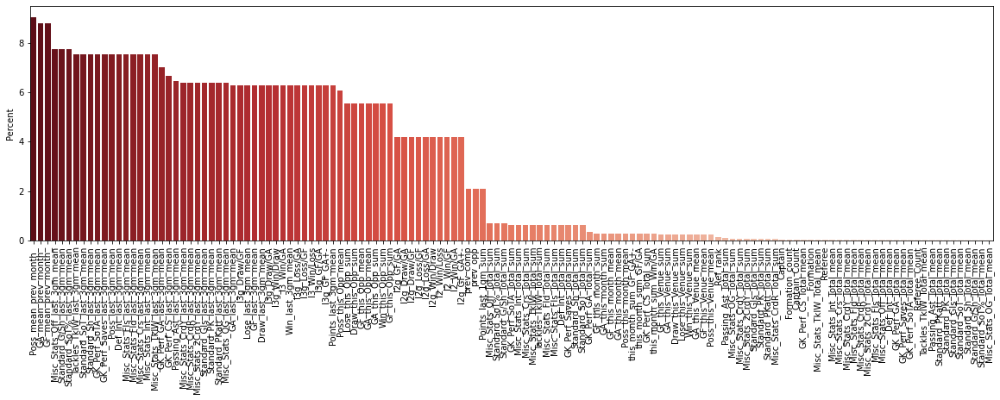

In [187]:
    missing = missing_percentage(df3)

    fig, ax = plt.subplots(figsize=(20, 5))
    sns.barplot(x=missing.index, y='Percent', data=missing, palette='Reds_r')
    #plt.show()
    plt.xticks(rotation=90)

    display(missing.T.style.background_gradient(cmap='Reds', axis=1))

In [269]:
for cat in df4.select_dtypes('O').columns:
    print(cat)
    print(df4[cat].nunique())
    print('++++++++++++++++++++++')

Comp
5
++++++++++++++++++++++
Venue
3
++++++++++++++++++++++
Result
3
++++++++++++++++++++++
Opponent
32
++++++++++++++++++++++
Captain
219
++++++++++++++++++++++
Formation
29
++++++++++++++++++++++
Referee
122
++++++++++++++++++++++
Team
28
++++++++++++++++++++++
prev_opp
32
++++++++++++++++++++++
prev_comp
5
++++++++++++++++++++++


In [270]:
df4.Venue.value_counts()

Home       2025
Away       2024
Neutral      15
Name: Venue, dtype: int64

In [16]:
total_cols = 'Total_Points	Total_GF	Total_GA	Total_Win	Total_Draw	Total_Loss'.split('	')
total_cols

szn_avg = 'Points_Avg_for_szn	GF_Avg_for_szn	GA_Avg_for_szn	Win_Avg_for_szn	Draw_Avg_for_szn	Loss_Avg_for_szn'.split('	')
szn_avg

l3_l1 = 'Points_last_1gm_sum	Points_last_3gm_mean	Win_last_3gm_mean	Draw_last_3gm_mean	Lose_last_3gm_mean	GF_last_3gm_mean	GA_last_3gm_mean	Poss_last_3gm_mean\tPlayed_Opp_X_times'.split('	')
l3_l1

month_cols = 'GF_this_month_sum	GA_this_month_sum	GF_this_month_mean	GA_this_month_mean	GF_mean_prev_month_	GA_mean_prev_month_	Poss_this_month_mean'.split('\t')
month_cols

venue_col = 'Poss_this_Venue_mean	GF_this_Venue_mean	GA_this_Venue_mean	Win_this_Venue_sum	Lose_this_Venue_sum	Draw_this_Venue_sum	GF_this_Venue_sum	GA_this_Venue_sum'.split('\t')
venue_col

this_opp = 'Poss_this_Opp_mean	GA_this_Opp_mean	GF_this_Opp_mean	Win_this_Opp_sum	Lose_this_Opp_sum	Draw_this_Opp_sum	GA_this_Opp_sum	GF_this_Opp_sum'.split('	')
this_opp

match_day = 'Day_of_week	Kick_off_hr	Kick_off_min	First_Match_In_Month	Rest	Rest_hrs'.split('	')
match_day

top_team_opp = 'Top7_Opp	Top7_Team	Top4_Opp	Top4_Team'.split('	')
top_team_opp

top_4_7_cols = 'Poss_this_7_Opp_mean	GF_this_7_Opp_mean	GA_this_7_Opp_mean	Win_this_7_Opp_mean	Lose_this_7_Opp_mean	Draw_this_7_Opp_mean	Poss_this_4_Opp_mean	GF_this_4_Opp_mean	GA_this_4_Opp_mean	Win_this_4_Opp_mean	Lose_this_4_Opp_mean	Draw_this_4_Opp_mean'.split('	')
top_4_7_cols

offense_mean = 'Standard_SoT%_last_3gm_mean	Standard_G/Sh_last_3gm_mean	Standard_Sh_last_3gm_mean	Standard_SoT_last_3gm_mean	Standard_Gls_last_3gm_mean	Standard_PK_last_3gm_mean	Standard_PKatt_last_3gm_mean	Passing_Ast_last_3gm_mean'.split('\t')
offense_mean

defense_mean = 'Tackles_TklW_last_3gm_mean	Def_Int_last_3gm_mean	GK_Perf_SoTA_last_3gm_mean	GK_Perf_Saves_last_3gm_mean	GK_Perf_GA_last_3gm_mean	GK_Perf_CS_last_3gm_mean'.split('\t')
defense_mean

misc_mean = 'Misc_Stats_Off_last_3gm_mean	Misc_Stats_Fls_last_3gm_mean	Misc_Stats_Fld_last_3gm_mean	Misc_Stats_Crs_last_3gm_mean	Misc_Stats_Int_last_3gm_mean	Misc_Stats_TklW_last_3gm_mean	Misc_Stats_CrdY_last_3gm_mean	Misc_Stats_CrdR_last_3gm_mean	Misc_Stats_2CrdY_last_3gm_mean	Misc_Stats_OG_last_3gm_mean'.split('\t')
misc_mean

total_adv = 'Standard_SoT%_Total_sum	Standard_G/Sh_Total_sum	Standard_Sh_Total_sum	Standard_SoT_Total_sum	Standard_Gls_Total_sum	Standard_PK_Total_sum	Standard_PKatt_Total_sum	Passing_Ast_Total_sum	Tackles_TklW_Total_sum	Def_Int_Total_sum	GK_Perf_SoTA_Total_sum	GK_Perf_Saves_Total_sum	GK_Perf_GA_Total_sum	GK_Perf_CS_Total_sum	Misc_Stats_Off_Total_sum	Misc_Stats_Fls_Total_sum	Misc_Stats_Fld_Total_sum	Misc_Stats_Crs_Total_sum	Misc_Stats_Int_Total_sum	Misc_Stats_TklW_Total_sum	Misc_Stats_CrdY_Total_sum	Misc_Stats_CrdR_Total_sum	Misc_Stats_2CrdY_Total_sum	Misc_Stats_OG_Total_sum	Standard_SoT%_Total_mean	Standard_G/Sh_Total_mean	Standard_Sh_Total_mean	Standard_SoT_Total_mean	Standard_Gls_Total_mean	Standard_PK_Total_mean	Standard_PKatt_Total_mean	Passing_Ast_Total_mean	Tackles_TklW_Total_mean	Def_Int_Total_mean	GK_Perf_SoTA_Total_mean	GK_Perf_Saves_Total_mean	GK_Perf_GA_Total_mean	GK_Perf_CS_Total_mean	Misc_Stats_Off_Total_mean	Misc_Stats_Fls_Total_mean	Misc_Stats_Fld_Total_mean	Misc_Stats_Crs_Total_mean	Misc_Stats_Int_Total_mean	Misc_Stats_TklW_Total_mean	Misc_Stats_CrdY_Total_mean	Misc_Stats_CrdR_Total_mean	Misc_Stats_2CrdY_Total_mean	Misc_Stats_OG_Total_mean'.split('\t')
total_adv

['Standard_SoT%_Total_sum',
 'Standard_G/Sh_Total_sum',
 'Standard_Sh_Total_sum',
 'Standard_SoT_Total_sum',
 'Standard_Gls_Total_sum',
 'Standard_PK_Total_sum',
 'Standard_PKatt_Total_sum',
 'Passing_Ast_Total_sum',
 'Tackles_TklW_Total_sum',
 'Def_Int_Total_sum',
 'GK_Perf_SoTA_Total_sum',
 'GK_Perf_Saves_Total_sum',
 'GK_Perf_GA_Total_sum',
 'GK_Perf_CS_Total_sum',
 'Misc_Stats_Off_Total_sum',
 'Misc_Stats_Fls_Total_sum',
 'Misc_Stats_Fld_Total_sum',
 'Misc_Stats_Crs_Total_sum',
 'Misc_Stats_Int_Total_sum',
 'Misc_Stats_TklW_Total_sum',
 'Misc_Stats_CrdY_Total_sum',
 'Misc_Stats_CrdR_Total_sum',
 'Misc_Stats_2CrdY_Total_sum',
 'Misc_Stats_OG_Total_sum',
 'Standard_SoT%_Total_mean',
 'Standard_G/Sh_Total_mean',
 'Standard_Sh_Total_mean',
 'Standard_SoT_Total_mean',
 'Standard_Gls_Total_mean',
 'Standard_PK_Total_mean',
 'Standard_PKatt_Total_mean',
 'Passing_Ast_Total_mean',
 'Tackles_TklW_Total_mean',
 'Def_Int_Total_mean',
 'GK_Perf_SoTA_Total_mean',
 'GK_Perf_Saves_Total_mean',
 '

In [271]:
df4.head()

,Comp,Venue,Result,GF,GA,Opponent,Captain,Formation,Referee,Team,Season,Month,Win,Draw,Lose,Points,Total_Points,Total_GF,Total_GA,Total_Win,Total_Draw,Total_Loss,Points_Avg_for_szn,GF_Avg_for_szn,GA_Avg_for_szn,Win_Avg_for_szn,Draw_Avg_for_szn,Loss_Avg_for_szn,Points_last_1gm_sum,Points_last_3gm_mean,Win_last_3gm_mean,Draw_last_3gm_mean,Lose_last_3gm_mean,GF_last_3gm_mean,GA_last_3gm_mean,Poss_last_3gm_mean,Played_Opp_X_times,GF_this_month_sum,GA_this_month_sum,GF_this_month_mean,GA_this_month_mean,GF_mean_prev_month_,GA_mean_prev_month_,Poss_this_month_mean,Poss_mean_prev_month_,Captain_Rank,Poss_this_Venue_mean,GF_this_Venue_mean,GA_this_Venue_mean,Win_this_Venue_sum,Lose_this_Venue_sum,Draw_this_Venue_sum,GF_this_Venue_sum,GA_this_Venue_sum,Poss_this_Opp_mean,GA_this_Opp_mean,GF_this_Opp_mean,Win_this_Opp_sum,Lose_this_Opp_sum,Draw_this_Opp_sum,GA_this_Opp_sum,GF_this_Opp_sum,Day_of_week,Kick_off_hr,Kick_off_min,First_Match_In_Month,Opponent_Count,prev_opp,prev_comp,Rest,Rest_hrs,Top7_Opp,Top7_Team,Top4_Opp,Top4_Team,Referee_Count,Ref_rank,Captain_Count,Poss_this_7_Opp_mean,GF_this_7_Opp_mean,GA_this_7_Opp_mean,Win_this_7_Opp_mean,Lose_this_7_Opp_mean,Draw_this_7_Opp_mean,Poss_this_4_Opp_mean,GF_this_4_Opp_mean,GA_this_4_Opp_mean,Win_this_4_Opp_mean,Lose_this_4_Opp_mean,Draw_this_4_Opp_mean,Formation_count,Na_count,Tot_Pts/Win,Tot_Pts/Loss,Tot_Pts/Draw,Tot_Pts/GF,Tot_Pts/GA,Tot_Win/Loss,Tot_Win/Draw,Tot_Draw/Loss,Tot_Win/GF,Tot_Loss/GA,Tot_Draw/GF,Tot_GF/GA,Tot_GF_GA_+-,Avg_Pts/Win,Avg_Pts/Loss,Avg_Pts/GF,Avg_Pts/GA,Avg_Win/GA,Avg_Win/GF,Avg_Win/Loss,Avg_Win/Draw,Avg_Loss/GA,Avg_Loss/GF,Avg_Draw/GF,Avg_Draw/GA,Avg_GF/GA,Avg_GF_GA+-,l2_Win/GA,l2_Win/GF,l2_Win/Loss,l2g_Win/Draw,l2g_Loss/GA,l2g_Loss/GF,l2g_Draw/GF,l2g_Draw/GA,l2g_GF/GA,l2g_GF_GA+-,l3_Win/GA,l3_Win/Loss,l3g_Win/Draw,l3g_Loss/GA,l3g_Loss/GF,l3g_Draw/GF,l3g_Draw/GA,l3g_GF/GA,l3g_GF_GA+-,this_month_sum_Win/GA,this_month_sum_GF/GA,this_month_sum_GF_GA+-,Standard_SoT%_last_3gm_mean,Standard_G/Sh_last_3gm_mean,Standard_Sh_last_3gm_mean,Standard_SoT_last_3gm_mean,Standard_Gls_last_3gm_mean,Standard_PK_last_3gm_mean,Standard_PKatt_last_3gm_mean,Passing_Ast_last_3gm_mean,Tackles_TklW_last_3gm_mean,Def_Int_last_3gm_mean,GK_Perf_SoTA_last_3gm_mean,GK_Perf_Saves_last_3gm_mean,GK_Perf_GA_last_3gm_mean,GK_Perf_CS_last_3gm_mean,Misc_Stats_Off_last_3gm_mean,Misc_Stats_Fls_last_3gm_mean,Misc_Stats_Fld_last_3gm_mean,Misc_Stats_Crs_last_3gm_mean,Misc_Stats_Int_last_3gm_mean,Misc_Stats_TklW_last_3gm_mean,Misc_Stats_CrdY_last_3gm_mean,Misc_Stats_CrdR_last_3gm_mean,Misc_Stats_2CrdY_last_3gm_mean,Misc_Stats_OG_last_3gm_mean,Standard_SoT%_Total_sum,Standard_G/Sh_Total_sum,Standard_Sh_Total_sum,Standard_SoT_Total_sum,Standard_Gls_Total_sum,Standard_PK_Total_sum,Standard_PKatt_Total_sum,Passing_Ast_Total_sum,Tackles_TklW_Total_sum,Def_Int_Total_sum,GK_Perf_SoTA_Total_sum,GK_Perf_Saves_Total_sum,GK_Perf_GA_Total_sum,GK_Perf_CS_Total_sum,Misc_Stats_Off_Total_sum,Misc_Stats_Fls_Total_sum,Misc_Stats_Fld_Total_sum,Misc_Stats_Crs_Total_sum,Misc_Stats_Int_Total_sum,Misc_Stats_TklW_Total_sum,Misc_Stats_CrdY_Total_sum,Misc_Stats_CrdR_Total_sum,Misc_Stats_2CrdY_Total_sum,Misc_Stats_OG_Total_sum,Standard_SoT%_Total_mean,Standard_G/Sh_Total_mean,Standard_Sh_Total_mean,Standard_SoT_Total_mean,Standard_Gls_Total_mean,Standard_PK_Total_mean,Standard_PKatt_Total_mean,Passing_Ast_Total_mean,Tackles_TklW_Total_mean,Def_Int_Total_mean,GK_Perf_SoTA_Total_mean,GK_Perf_Saves_Total_mean,GK_Perf_GA_Total_mean,GK_Perf_CS_Total_mean,Misc_Stats_Off_Total_mean,Misc_Stats_Fls_Total_mean,Misc_Stats_Fld_Total_mean,Misc_Stats_Crs_Total_mean,Misc_Stats_Int_Total_mean,Misc_Stats_TklW_Total_mean,Misc_Stats_CrdY_Total_mean,Misc_Stats_CrdR_Total_mean,Misc_Stats_2CrdY_Total_mean,Misc_Stats_OG_Total_mean
4,Premier League,Home,W,3,0,Bournemouth,Laurent Koscielny,3-4-3,Anthony Taylor,Arsenal,2018,9,1,0,0,3,4.0,5.0,9.0,1.0,1.0,2.0,1.000000,1.250000,2.250000,0.250000,0.250000,0.500000,0.0,1.000000,0.333333,0.000000,0.666667,1.33

#### THE main

In [21]:
def backtest(data, model,target, predictors, start=1000, step=750,thresh=.6):
    data = data.loc[:,~data.columns.duplicated()]
    predictions = []
    # Loop over the dataset in increments
    for i in range(start, data.shape[0], step):
        # Split into train and test sets
        train = data.iloc[0:i].copy()
        test = data.iloc[i:(i+step)].copy()
        
        #dict_vectorizer
        dv = DictVectorizer(sparse=False)
        train_dicts = train[predictors].to_dict(orient='records')
        test_dicts = test[predictors].to_dict(orient='records')
        dv.fit(train_dicts)
        train_matrix= dv.transform(train_dicts)
        test_matrix= dv.transform(test_dicts)
        print('train_matrix.shape : ',train_matrix.shape)
        #dv.get_feature_names_out().shape
        
        # Fit the random forest model
        model.fit(train_matrix, train[target])
        
        # Make predictions
        preds_probs = model.predict_proba(test_matrix)[:,1]
        preds_probs = pd.Series(preds_probs, index=test.index)
        preds = preds_probs.copy()
        preds[preds > thresh] = 1
        preds[preds<= thresh] = 0
        
        # Combine predictions and test values
        combined = pd.concat({'Team':test['Team'],'Opponent':test['Opponent'],'Result':test['Result'],"Target": test[target],"Predictions": preds,"Probs":preds_probs,'Season':test['Season']}, axis=1)
        
        predictions.append(combined)
    out_df = pd.concat(predictions)
    print(f'Precision_score :{target} ',precision_score(out_df.Target,out_df.Predictions))
    best_thresh_curve(y_true=out_df.Target,y_proba_score=out_df.Probs)
    print(f"{target} ROC : ",roc_auc_score(out_df.Target,out_df.Probs))
    return out_df

In [ ]:
def split_test(df,the_dict,relevant_cols,target,model):
    df =df.copy()
    dfs_arr = []
    leaks = 'Win	Draw	Lose	Points	Season'.split('	')
    base_df = df.loc[:,leaks]
    add_with = [target,'Season',"Team", "Opponent", "Result"]
    prev_f = 0
    use_col = []
    for col_gp , PC_gp in the_dict.items():
        if col_gp in relevant_cols:
            print(col_gp)
            a = PC_gp.drop(leaks,axis=1)
            dfs_arr.append(a)
            print('df_arrs lenghth',len(dfs_arr))
            All= pd.concat(dfs_arr,axis=1)
            all_df = pd.concat([All,df.loc[:,add_with].reset_index(drop=True)],axis=1)
            print('Shape : ',all_df.shape)
            predictors = all_df.drop(add_with,axis=1).columns
            c, f = predictions(data=all_df,predictors=predictors,targets=[target],model=model) 
    return predictors,all_df

In [89]:
def front_test(df,target,the_dict,model):
    df =df.copy()
    dfs_arr = []
    leaks = 'Win	Draw	Lose	Points	Season'.split('	')
    base_df = df.loc[:,leaks]
    add_with = [target,'Season',"Team", "Opponent", "Result"]
    prev_f = 0
    use_col = []
    for col_gp , PC_gp in the_dict.items():
        print(col_gp)
        a = PC_gp.drop(leaks,axis=1)
        dfs_arr.append(a)
        print('df_arrs lenghth',len(dfs_arr))
        All= pd.concat(dfs_arr,axis=1)
        all_df = pd.concat([All,df.loc[:,add_with].reset_index(drop=True)],axis=1)
        print('Shape : ',all_df.shape)
        predictors = all_df.drop(add_with,axis=1).columns
        c, f = predictions(data=all_df,predictors=predictors,targets=[target],model=model)
        print("difference in f1_score ",f-prev_f)
        if (f - prev_f)>0:
            use_col.append(col_gp)
            print("keeping ",col_gp)
            print('++++++++++++++++++++++Starting split+++++++++++++++++++++++++++++++++++++++++')
            split_predictors,split_all_df =split_test(df,the_dict,relevant_cols=use_col,target=target,model = model)
            print('++++++++++++++++++++++Endinging split+++++++++++++++++++++++++++++++++++++++++')
            print("Back to front test")
            print()
        else:
            print("discarding ",col_gp)
        prev_f = f
        print("============================================================>>>>>>>>>>>>>>>>>>")
    display(use_col)    
    return split_predictors,split_all_df

In [64]:
def PCA_ish(df=df4,target='Win'):
    features_list=[total_cols,szn_avg,l3_l1,month_cols,venue_col,this_opp,match_day,top_team_opp,
                   offense_mean,defense_mean]
    name_list = ['_total','_szn_avg','_rol1-3','_month_cols','_venue_cols','_this_opp','_matchday','_top4&7','_offense','_defense']
    
    targets = ['Win','Draw','Lose','Points']
    print("get PCA cols")
    packed_dict = get_PCA_cols(df,target,features_list,name_list,targets=targets)
    
    print('Run front test')
    rf = RandomForestClassifier(n_estimators=200, min_samples_split=10, random_state=1)
    rf2 = RandomForestClassifier( **{'n_estimators': 200,
      'max_depth': 15.0,
      'min_samples_split': 15,
      'min_samples_leaf': 15,
      'max_features': 'sqrt'})
    
    p , a = front_test(df,target,the_dict=packed_dict,model =rf)

    print("B1 >>>>>>>>>>>>>>>>>a ,rf and all predictors")
    b1 = backtest(data=a, model=rf, predictors=p, start=1000, step=750,target=target)
    print("================================================....................")
    print()
    
    print("B2 >>>>>>>>>>>>>>>>>a,rf2 and all predictors")
    b2 = backtest(data=a, model=rf2, predictors=p, start=1000, step=750,target=target)
    print("================================================....................")
    print()
    
    mi_scores_1 = make_mi_scores_Classif(X_train=a.drop([target]+['Season',"Team", "Opponent", "Result"],axis=1).reset_index(drop=True), y_train=a[target])
    topk = mi_scores_1[mi_scores_1>0].index
    
    print("B3 >>>>>>>>>>>>>>>>>a ,rf and topKall predictors")
    b3 = backtest(data=a, model=rf, predictors=topk, start=1000, step=750,target=target)
    print("================================================....................")
    print()
    
    print("B4 >>>>>>>>>>>>>>>>>a ,rf2 and topKall predictors")
    b4 = backtest(data=a, model=rf2, predictors=topk, start=1000, step=750,target=target)
    print("================================================....................")
    print()
    
    cats = 'Comp	Venue	prev_opp	prev_comp'.split('	')
    df = df.reset_index(drop=True)
    a_df = pd.concat([a,df.loc[:,'Comp	Venue	prev_opp	prev_comp'.split('	')]],axis=1)
    
    print("B5 >>>>>>>>>>>>>>>>>a_df ,rf and all predictors + cats")
    b5= backtest(data=a_df, model=rf, predictors=p.to_list()+cats, start=1000, step=750,target=target)
    print("================================================....................")
    print()
    
    print("B6 >>>>>>>>>>>>>>>>>a_df ,rf2 and all predictors + cats")
    b6 = backtest(data=a_df, model=rf2, predictors=p.to_list()+cats, start=1000, step=750,target=target)
    print("================================================....................")
    print()
    
    
    print("B7 >>>>>>>>>>>>>>>>>a_df ,rf and topkall predictors + cats")
    b7 = backtest(data=a_df, model=rf, predictors=topk.to_list()+cats, start=1000, step=750,target=target)
    print("================================================....................")
    print()
    
    print("B8 >>>>>>>>>>>>>>>>>a_df ,rf2 and topkall predictors + cats")   
    b8 = backtest(data=a_df, model=rf2, predictors=topk.to_list()+cats, start=1000, step=750,target=target)
    print("================================================....................")
    print()
    
    return [b1,b2,b3,b4,b5,b6,b7,b8] ,a_df

get PCA cols
X__total


,PC__total1,PC__total2,PC__total3,PC__total4,PC__total5,PC__total6
Total_Points,0.469766,-0.302114,0.068232,0.259357,0.297685,7.262981e-01
Total_GF,0.467809,-0.291923,0.105089,-0.359373,-0.745482,-3.330669e-16
Total_GA,0.391082,0.478648,0.176401,-0.654365,0.398296,-1.110223e-16
Total_Win,0.449306,-0.354543,0.193090,0.258178,0.323546,-6.810302e-01
Total_Draw,0.377617,0.236333,-0.879083,0.134565,-0.044373,-9.321476e-02
Total_Loss,0.251117,0.642534,0.378303,0.539099,-0.300581,2.428613e-17


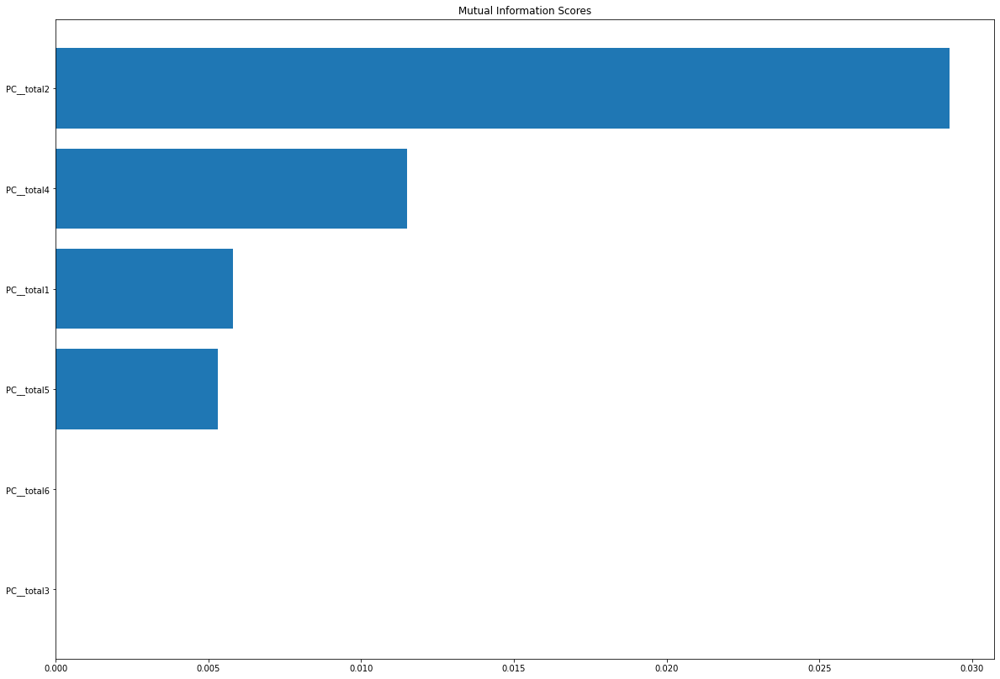


X__szn_avg


,PC__szn_avg1,PC__szn_avg2,PC__szn_avg3,PC__szn_avg4,PC__szn_avg5,PC__szn_avg6
Points_Avg_for_szn,-0.477798,-0.018255,0.038529,-0.341363,7.918347e-01,-1.623591e-01
GF_Avg_for_szn,-0.428843,-0.071757,0.599725,0.671770,-1.110223e-16,-1.249001e-16
GA_Avg_for_szn,0.396016,-0.205354,0.769858,-0.456421,2.775558e-17,-4.510281e-17
Win_Avg_for_szn,-0.469206,-0.180787,0.002685,-0.321239,-5.464115e-01,-5.877022e-01
Draw_Avg_for_szn,0.120597,0.896302,0.182734,0.009591,9.655751e-03,-3.853847e-01
Loss_Avg_for_szn,0.443030,-0.341036,-0.112986,0.347261,2.726519e-01,-6.926213e-01


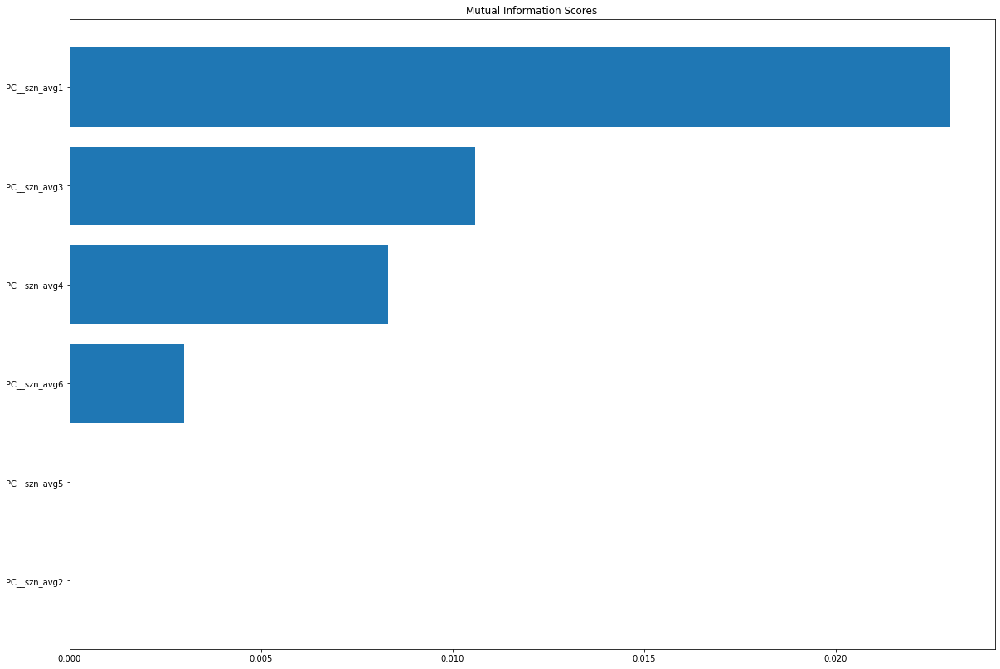


X__rol1-3


,PC__rol1-31,PC__rol1-32,PC__rol1-33,PC__rol1-34,PC__rol1-35,PC__rol1-36,PC__rol1-37,PC__rol1-38,PC__rol1-39
Points_last_1gm_sum,0.335712,-0.043182,0.071965,0.311060,-0.063373,0.877955,0.093136,-2.816382e-15,2.264188e-15
Points_last_3gm_mean,0.461567,-0.036809,0.041178,0.116397,0.042821,-0.185421,-0.324345,7.912080e-01,5.415888e-02
Win_last_3gm_mean,0.441036,-0.242749,0.033143,0.131400,-0.029597,-0.200921,-0.292890,-4.959805e-01,5.959608e-01
Draw_last_3gm_mean,-0.065759,0.809264,0.018162,-0.094751,0.267024,0.118400,-0.019748,6.052587e-02,4.920230e-01
Lose_last_3gm_mean,-0.404050,-0.397772,-0.048897,-0.060088,-0.183554,0.113122,0.319202,3.526044e-01,6.323061e-01
GF_last_3gm_mean,0.361364,-0.181274,-0.031409,-0.196288,0.655606,-0.091204,0.599085,5.551115e-17,2.792905e-16
GA_last_3gm_mean,-0.342529,-0.297185,-0.060285,-0.101480,0.626261,0.262410,-0.565120,-1.665335e-16,-1.491862e-16
Poss_last_3gm_mean,0.248617,-0.031169,-0.149567,-0.882302,-0.257211,0.224615,-0.140647,2.775558e-17,-2.029626e-16
Played_Opp_X_times,-0.049399,-0.050715,0.980977,-0.180429,0.010019,0.001063,-0.004038,7.632783e-17,8.370041e-17


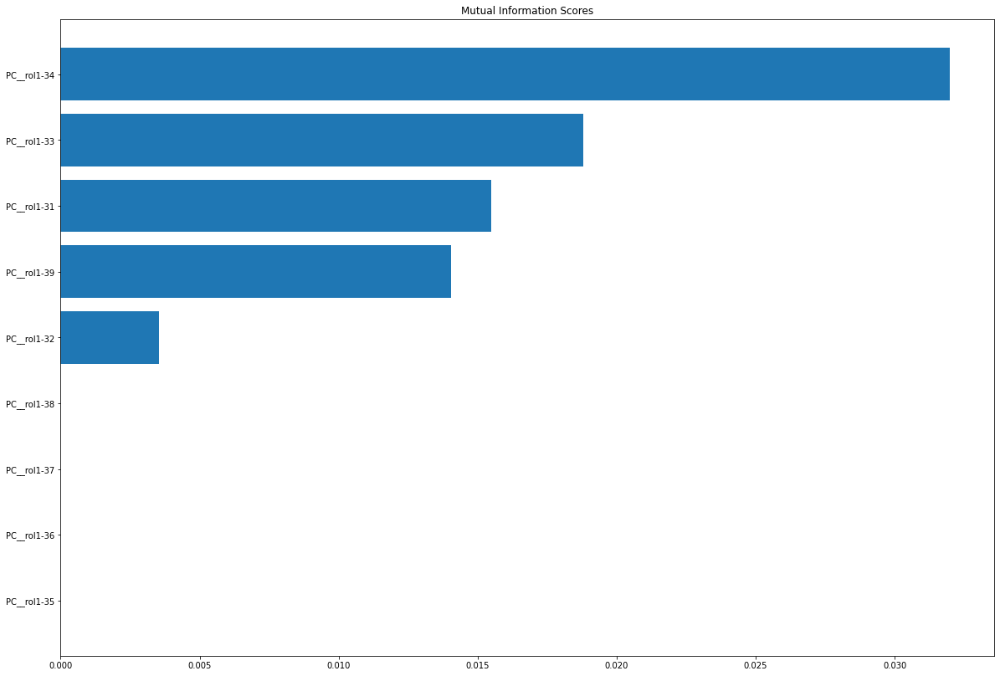


X__month_cols


,PC__month_cols1,PC__month_cols2,PC__month_cols3,PC__month_cols4,PC__month_cols5,PC__month_cols6,PC__month_cols7
GF_this_month_sum,0.432234,0.428614,0.341914,-0.099954,-0.032125,-0.378552,0.598526
GA_this_month_sum,-0.168492,0.706922,-0.107632,0.066222,0.090634,-0.382433,-0.549028
GF_this_month_mean,0.455851,0.216689,0.419690,-0.198194,-0.183832,0.579120,-0.400813
GA_this_month_mean,-0.345977,0.518172,-0.267174,0.109607,-0.032813,0.591104,0.421808
GF_mean_prev_month_,0.402165,0.001895,-0.416297,0.523750,-0.621066,-0.059353,-0.037381
GA_mean_prev_month_,-0.312703,-0.032056,0.646776,0.692857,-0.052421,0.007990,-0.002752
Poss_this_month_mean,0.444707,0.008007,-0.179907,0.424222,0.753268,0.148571,-0.018869


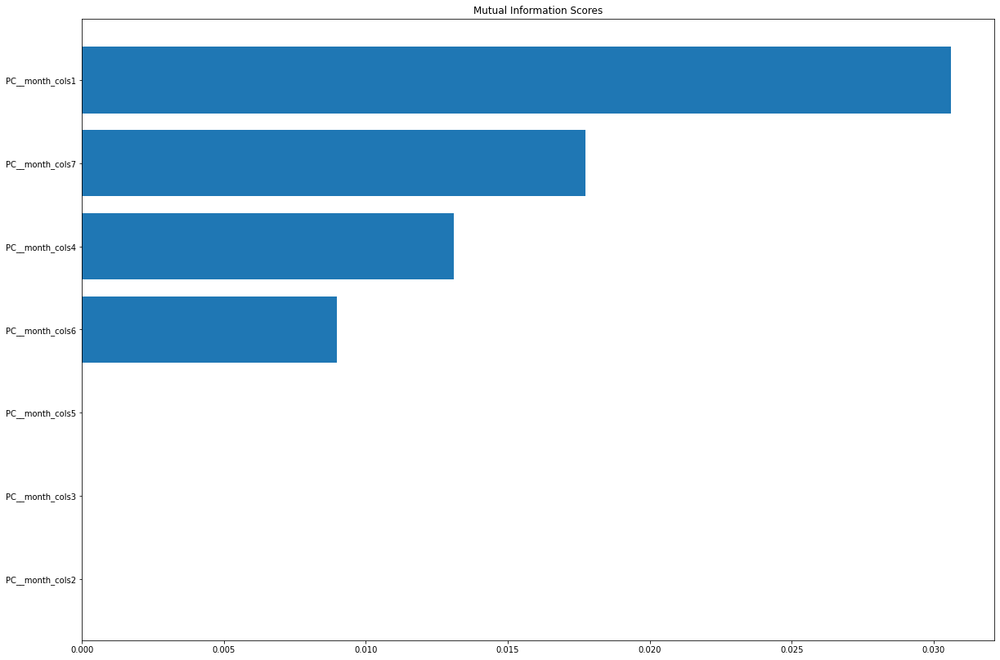


X__venue_cols


,PC__venue_cols1,PC__venue_cols2,PC__venue_cols3,PC__venue_cols4,PC__venue_cols5,PC__venue_cols6,PC__venue_cols7,PC__venue_cols8
Poss_this_Venue_mean,0.439366,-0.067735,0.213358,0.326229,-0.805879,0.030854,-0.004226,-0.003436
GF_this_Venue_mean,0.450881,-0.092845,0.357758,0.238217,0.421191,-0.624336,0.079300,-0.172808
GA_this_Venue_mean,-0.393192,0.132939,0.571463,0.526573,0.153215,0.386053,0.190972,-0.122053
Win_this_Venue_sum,0.437049,0.312359,0.047572,-0.299210,0.123194,0.438903,-0.030689,-0.640996
Lose_this_Venue_sum,-0.268059,0.466426,0.175143,-0.355535,-0.300335,-0.396225,0.537661,-0.131287
Draw_this_Venue_sum,0.042236,0.425938,-0.647001,0.581183,0.047520,-0.088303,0.173282,-0.142575
GF_this_Venue_sum,0.416222,0.373416,0.104690,-0.072946,0.198905,0.250572,0.269022,0.704498
GA_this_Venue_sum,-0.105699,0.577178,0.193417,0.022863,-0.049830,-0.200006,-0.751534,0.102331


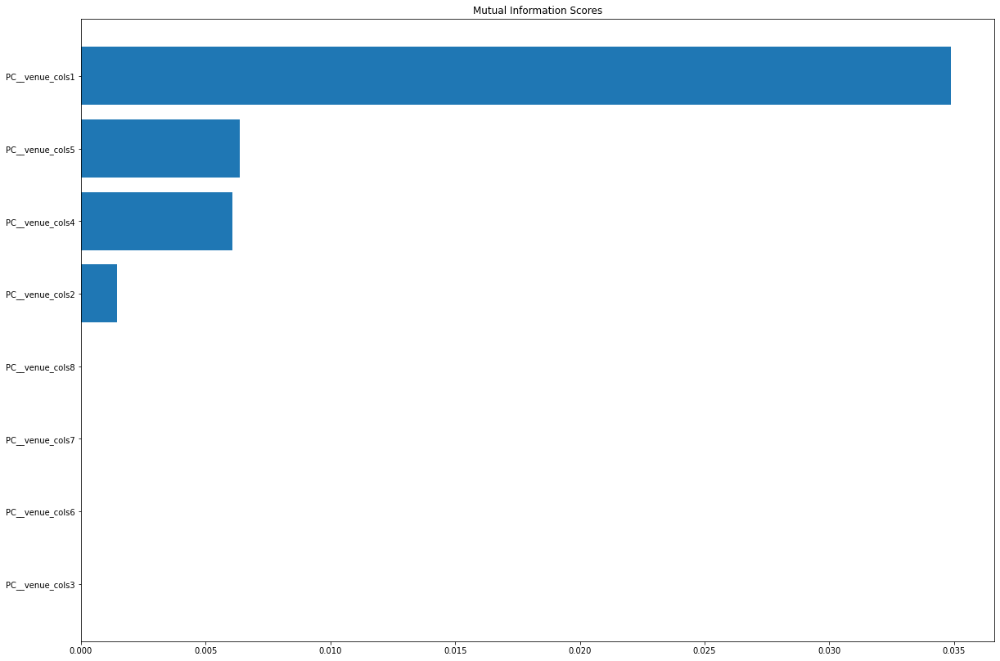


X__this_opp


,PC__this_opp1,PC__this_opp2,PC__this_opp3,PC__this_opp4,PC__this_opp5,PC__this_opp6,PC__this_opp7,PC__this_opp8
Poss_this_Opp_mean,-0.211848,0.002103,0.033949,0.972991,0.084345,0.007862,0.008698,-0.000303
GA_this_Opp_mean,0.380827,0.420215,0.253978,0.048564,0.365223,-0.366864,-0.472147,-0.347313
GF_this_Opp_mean,-0.388905,0.406090,0.254558,-0.064649,-0.359086,-0.357402,0.459786,-0.383123
Win_this_Opp_sum,-0.435350,0.215728,-0.277751,-0.136145,0.535981,0.468125,0.023712,-0.401587
Lose_this_Opp_sum,0.428000,0.232288,-0.290374,0.146794,-0.543575,0.448167,-0.067165,-0.395164
Draw_this_Opp_sum,0.021792,-0.430729,0.745384,-0.022344,-0.011267,0.376018,-0.017375,-0.340709
GA_this_Opp_sum,0.375149,0.437624,0.273613,0.040996,0.265450,0.306996,0.538680,0.369212
GF_this_Opp_sum,-0.380681,0.425404,0.278601,-0.066980,-0.277876,0.286325,-0.519661,0.403440


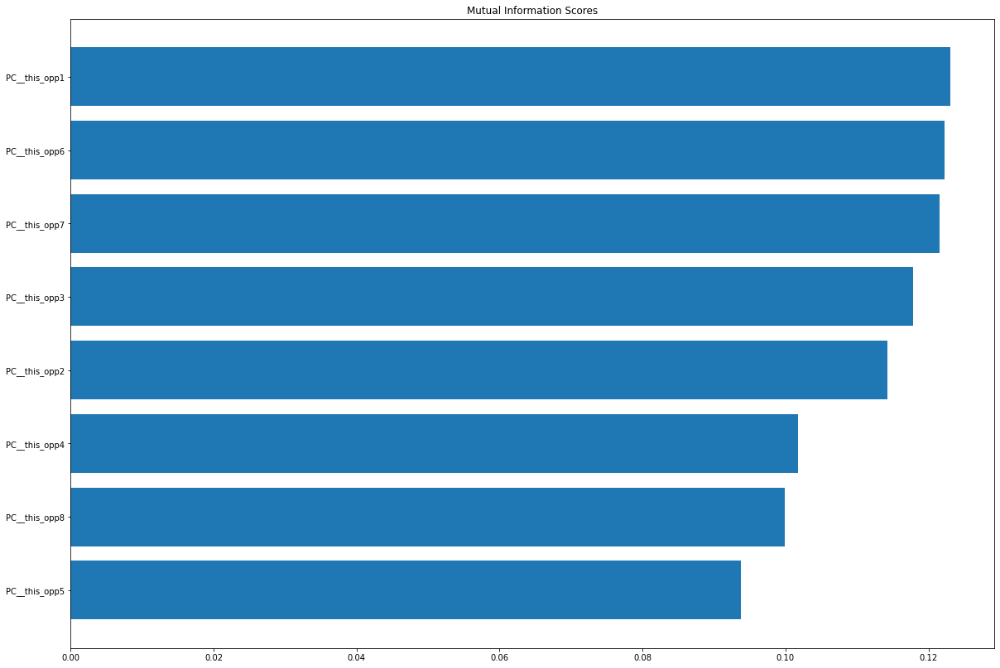


X__matchday


,PC__matchday1,PC__matchday2,PC__matchday3,PC__matchday4,PC__matchday5,PC__matchday6
Day_of_week,-0.053651,0.688747,-0.102966,0.093475,-0.709505,-0.003525
Kick_off_hr,0.042516,-0.682889,0.072770,-0.186420,-0.701271,0.005228
Kick_off_min,0.055106,-0.221902,-0.274578,0.932250,-0.056900,-0.001576
First_Match_In_Month,-0.049897,0.058070,0.951715,0.294694,-0.039150,0.000394
Rest,-0.703257,-0.061628,-0.037283,0.014984,0.004252,-0.707106
Rest_hrs,-0.703716,-0.053674,-0.039478,0.018743,0.005795,0.707078


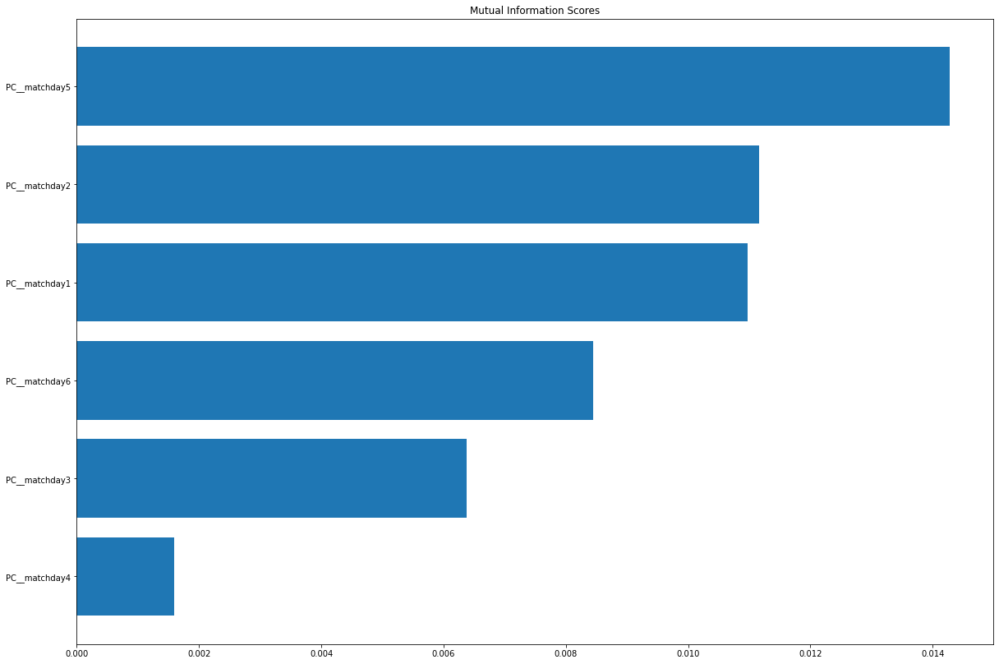


X__top4&7


,PC__top4&71,PC__top4&72,PC__top4&73,PC__top4&74
Top7_Opp,-0.462160,0.534307,0.680311,0.195195
Top7_Team,0.539830,0.456708,-0.187581,0.681773
Top4_Opp,-0.451792,0.544901,-0.679170,-0.194154
Top4_Team,0.539329,0.457184,0.201789,-0.677782


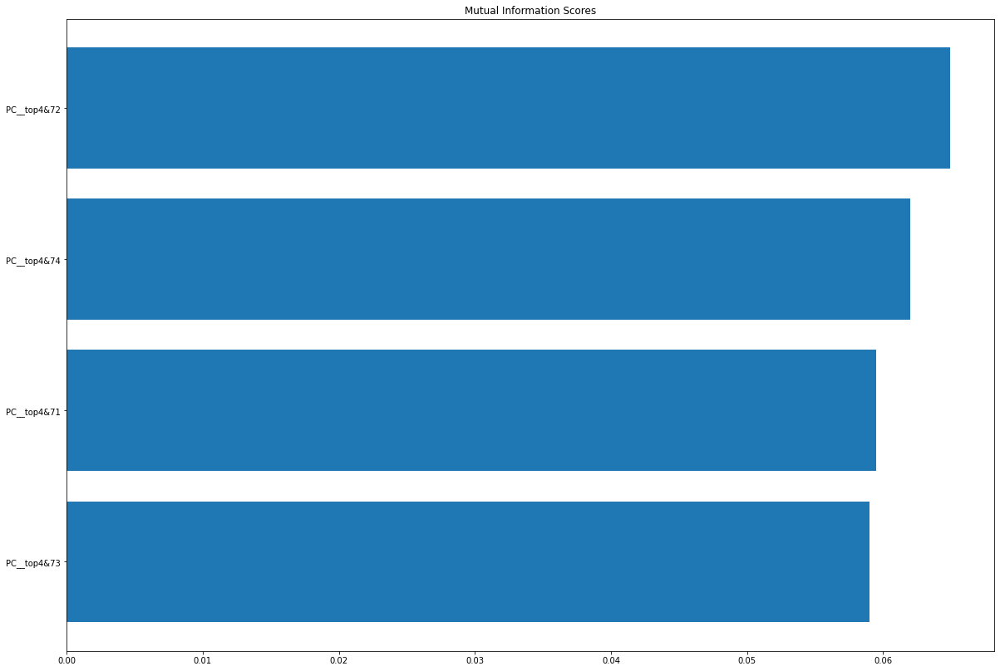


X__offense


,PC__offense1,PC__offense2,PC__offense3,PC__offense4,PC__offense5,PC__offense6,PC__offense7,PC__offense8
Standard_SoT%_last_3gm_mean,0.319010,-0.142528,0.378257,0.730557,-0.093497,0.046853,0.191560,0.391784
Standard_G/Sh_last_3gm_mean,0.363212,-0.207541,0.480791,-0.258134,0.638420,-0.000607,0.185105,-0.292175
Standard_Sh_last_3gm_mean,0.290664,0.007770,-0.698839,0.006018,0.405176,0.030926,0.389180,0.332349
Standard_SoT_last_3gm_mean,0.433567,-0.068139,-0.338900,0.401455,-0.058690,-0.061654,-0.314262,-0.652189
Standard_Gls_last_3gm_mean,0.489246,0.006030,0.034406,-0.296132,-0.023926,-0.195798,-0.650147,0.458393
Standard_PK_last_3gm_mean,0.159098,0.673329,0.115072,0.007941,-0.071158,-0.650854,0.269624,-0.081478
Standard_PKatt_last_3gm_mean,0.159638,0.674332,0.089247,0.021550,0.092432,0.700626,-0.107384,-0.020244
Passing_Ast_last_3gm_mean,0.451315,-0.154197,0.011918,-0.387595,-0.633945,0.200552,0.414608,-0.090331


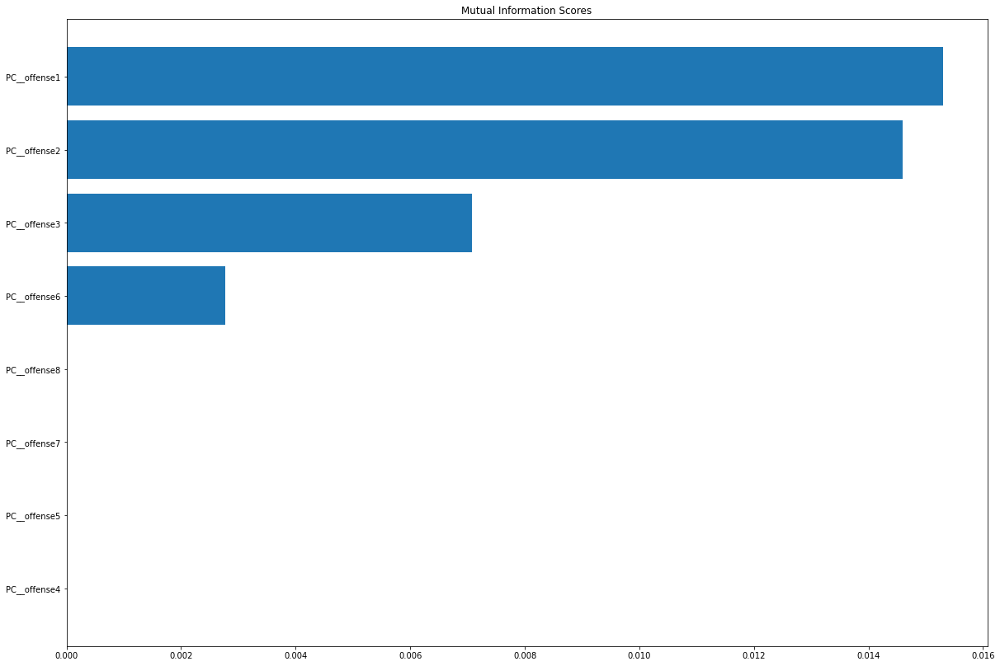


X__defense


,PC__defense1,PC__defense2,PC__defense3,PC__defense4,PC__defense5,PC__defense6
Tackles_TklW_last_3gm_mean,0.067317,0.113854,0.749387,-0.648774,0.003224,-0.002546
Def_Int_last_3gm_mean,0.144590,0.345634,0.567668,0.731093,-0.053742,0.000288
GK_Perf_SoTA_last_3gm_mean,0.576306,0.252351,-0.170435,-0.089112,0.156993,-0.736583
GK_Perf_Saves_last_3gm_mean,0.444565,0.568814,-0.266729,-0.165465,-0.210926,0.579483
GK_Perf_GA_last_3gm_mean,0.497046,-0.433574,0.091775,0.083377,0.654324,0.348488
GK_Perf_CS_last_3gm_mean,-0.444681,0.540701,-0.086936,-0.048211,0.706983,0.013954


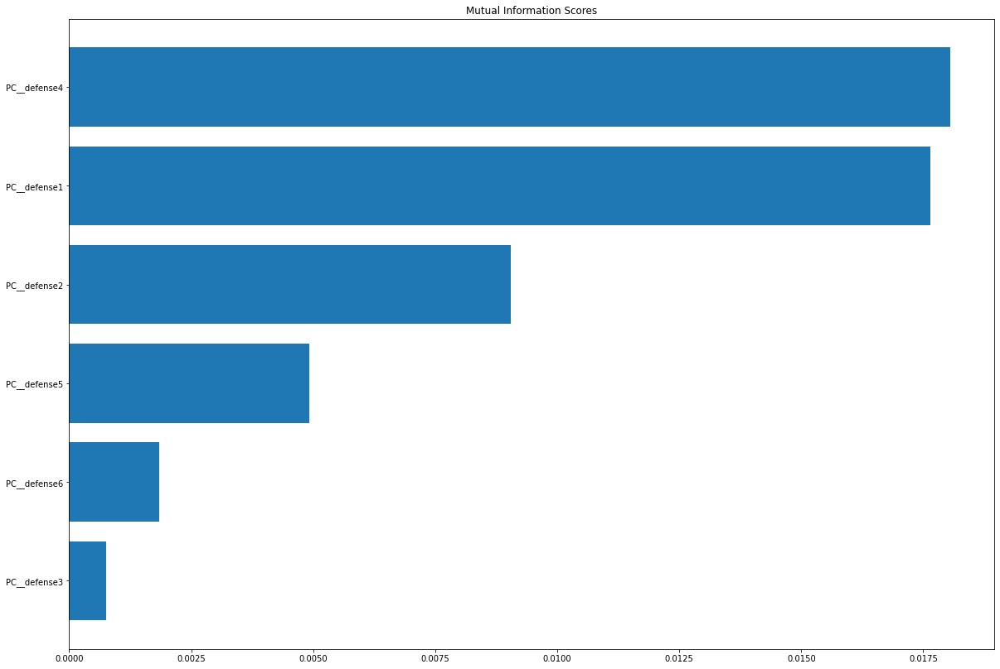


Run front test
_total
df_arrs lenghth 1
Shape :  (4064, 15)
Win Accuracy Score :  0.620253164556962



predicted_Win,0.0,1.0
actual,,
0,416,62
1,238,74


Win Precision :  0.5441176470588235
Win F1_score :  0.33035714285714285
Win ROC :  0.553736187104388
Win Recall :  0.23717948717948717


difference in f1_score  0.33035714285714285
keeping  _total
++++++++++++++++++++++Starting split+++++++++++++++++++++++++++++++++++++++++
_total
df_arrs lenghth 1
Shape :  (4064, 15)
Win Accuracy Score :  0.620253164556962



predicted_Win,0.0,1.0
actual,,
0,416,62
1,238,74


Win Precision :  0.5441176470588235
Win F1_score :  0.33035714285714285
Win ROC :  0.553736187104388
Win Recall :  0.23717948717948717


++++++++++++++++++++++Endinging split+++++++++++++++++++++++++++++++++++++++++
Back to front test

============================================================>>>>>>>>>>>>>>>>>>
_szn_avg
df_arrs lenghth 2
Shape :  (4064, 25)
Win Accuracy Score :  0.6215189873417721



predicted_Win,0.0,1.0
actual,,
0,432,46
1,253,59


Win Precision :  0.5619047619047619
Win F1_score :  0.2829736211031175
Win ROC :  0.5464341272395665
Win Recall :  0.1891025641025641


difference in f1_score  -0.047383521754025326
discarding  _szn_avg
============================================================>>>>>>>>>>>>>>>>>>
_rol1-3
df_arrs lenghth 3
Shape :  (4064, 39)
Win Accuracy Score :  0.6354430379746835



predicted_Win,0.0,1.0
actual,,
0,446,32
1,256,56


Win Precision :  0.6363636363636364
Win F1_score :  0.28
Win ROC :  0.5562707863963094
Win Recall :  0.1794871794871795


difference in f1_score  -0.0029736211031174964
discarding  _rol1-3
============================================================>>>>>>>>>>>>>>>>>>
_month_cols
df_arrs lenghth 4
Shape :  (4064, 50)
Win Accuracy Score :  0.6556962025316456



predicted_Win,0.0,1.0
actual,,
0,436,42
1,230,82


Win Precision :  0.6612903225806451
Win F1_score :  0.37614678899082565
Win ROC :  0.587477202016951
Win Recall :  0.26282051282051283


difference in f1_score  0.09614678899082563
keeping  _month_cols
++++++++++++++++++++++Starting split+++++++++++++++++++++++++++++++++++++++++
_total
df_arrs lenghth 1
Shape :  (4064, 15)
Win Accuracy Score :  0.620253164556962



predicted_Win,0.0,1.0
actual,,
0,416,62
1,238,74


Win Precision :  0.5441176470588235
Win F1_score :  0.33035714285714285
Win ROC :  0.553736187104388
Win Recall :  0.23717948717948717


_month_cols
df_arrs lenghth 2
Shape :  (4064, 26)
Win Accuracy Score :  0.6620253164556962



predicted_Win,0.0,1.0
actual,,
0,438,40
1,227,85


Win Precision :  0.68
Win F1_score :  0.3890160183066361
Win ROC :  0.5943769445338483
Win Recall :  0.2724358974358974


++++++++++++++++++++++Endinging split+++++++++++++++++++++++++++++++++++++++++
Back to front test

============================================================>>>>>>>>>>>>>>>>>>
_venue_cols
df_arrs lenghth 5
Shape :  (4064, 62)
Win Accuracy Score :  0.6632911392405063



predicted_Win,0.0,1.0
actual,,
0,439,39
1,227,85


Win Precision :  0.6854838709677419
Win F1_score :  0.3899082568807339
Win ROC :  0.5954229696384508
Win Recall :  0.2724358974358974


difference in f1_score  0.01376146788990823
keeping  _venue_cols
++++++++++++++++++++++Starting split+++++++++++++++++++++++++++++++++++++++++
_total
df_arrs lenghth 1
Shape :  (4064, 15)
Win Accuracy Score :  0.620253164556962



predicted_Win,0.0,1.0
actual,,
0,416,62
1,238,74


Win Precision :  0.5441176470588235
Win F1_score :  0.33035714285714285
Win ROC :  0.553736187104388
Win Recall :  0.23717948717948717


_month_cols
df_arrs lenghth 2
Shape :  (4064, 26)
Win Accuracy Score :  0.6620253164556962



predicted_Win,0.0,1.0
actual,,
0,438,40
1,227,85


Win Precision :  0.68
Win F1_score :  0.3890160183066361
Win ROC :  0.5943769445338483
Win Recall :  0.2724358974358974


_venue_cols
df_arrs lenghth 3
Shape :  (4064, 38)
Win Accuracy Score :  0.6594936708860759



predicted_Win,0.0,1.0
actual,,
0,435,43
1,226,86


Win Precision :  0.6666666666666666
Win F1_score :  0.3900226757369615
Win ROC :  0.5928414333226047
Win Recall :  0.27564102564102566


++++++++++++++++++++++Endinging split+++++++++++++++++++++++++++++++++++++++++
Back to front test

============================================================>>>>>>>>>>>>>>>>>>
_this_opp
df_arrs lenghth 6
Shape :  (4064, 78)
Win Accuracy Score :  0.7860759493670886



predicted_Win,0.0,1.0
actual,,
0,445,33
1,136,176


Win Precision :  0.8421052631578947
Win F1_score :  0.6756238003838771
Win ROC :  0.7475324535993991
Win Recall :  0.5641025641025641


difference in f1_score  0.28571554350314327
keeping  _this_opp
++++++++++++++++++++++Starting split+++++++++++++++++++++++++++++++++++++++++
_total
df_arrs lenghth 1
Shape :  (4064, 15)
Win Accuracy Score :  0.620253164556962



predicted_Win,0.0,1.0
actual,,
0,416,62
1,238,74


Win Precision :  0.5441176470588235
Win F1_score :  0.33035714285714285
Win ROC :  0.553736187104388
Win Recall :  0.23717948717948717


_month_cols
df_arrs lenghth 2
Shape :  (4064, 26)
Win Accuracy Score :  0.6620253164556962



predicted_Win,0.0,1.0
actual,,
0,438,40
1,227,85


Win Precision :  0.68
Win F1_score :  0.3890160183066361
Win ROC :  0.5943769445338483
Win Recall :  0.2724358974358974


_venue_cols
df_arrs lenghth 3
Shape :  (4064, 38)
Win Accuracy Score :  0.6594936708860759



predicted_Win,0.0,1.0
actual,,
0,435,43
1,226,86


Win Precision :  0.6666666666666666
Win F1_score :  0.3900226757369615
Win ROC :  0.5928414333226047
Win Recall :  0.27564102564102566


_this_opp
df_arrs lenghth 4
Shape :  (4064, 54)
Win Accuracy Score :  0.7822784810126582



predicted_Win,0.0,1.0
actual,,
0,446,32
1,140,172


Win Precision :  0.8431372549019608
Win F1_score :  0.6666666666666667
Win ROC :  0.7421682222937453
Win Recall :  0.5512820512820513


++++++++++++++++++++++Endinging split+++++++++++++++++++++++++++++++++++++++++
Back to front test

============================================================>>>>>>>>>>>>>>>>>>
_matchday
df_arrs lenghth 7
Shape :  (4064, 90)
Win Accuracy Score :  0.7860759493670886



predicted_Win,0.0,1.0
actual,,
0,448,30
1,139,173


Win Precision :  0.8522167487684729
Win F1_score :  0.6718446601941748
Win ROC :  0.7458628366055144
Win Recall :  0.5544871794871795


difference in f1_score  -0.003779140189702379
discarding  _matchday
============================================================>>>>>>>>>>>>>>>>>>
_top4&7
df_arrs lenghth 8
Shape :  (4064, 98)
Win Accuracy Score :  0.7848101265822784



predicted_Win,0.0,1.0
actual,,
0,445,33
1,137,175


Win Precision :  0.8413461538461539
Win F1_score :  0.673076923076923
Win ROC :  0.7459298894968351
Win Recall :  0.5608974358974359


difference in f1_score  0.0012322628827482474
keeping  _top4&7
++++++++++++++++++++++Starting split+++++++++++++++++++++++++++++++++++++++++
_total
df_arrs lenghth 1
Shape :  (4064, 15)
Win Accuracy Score :  0.620253164556962



predicted_Win,0.0,1.0
actual,,
0,416,62
1,238,74


Win Precision :  0.5441176470588235
Win F1_score :  0.33035714285714285
Win ROC :  0.553736187104388
Win Recall :  0.23717948717948717


_month_cols
df_arrs lenghth 2
Shape :  (4064, 26)
Win Accuracy Score :  0.6620253164556962



predicted_Win,0.0,1.0
actual,,
0,438,40
1,227,85


Win Precision :  0.68
Win F1_score :  0.3890160183066361
Win ROC :  0.5943769445338483
Win Recall :  0.2724358974358974


_venue_cols
df_arrs lenghth 3
Shape :  (4064, 38)
Win Accuracy Score :  0.6594936708860759



predicted_Win,0.0,1.0
actual,,
0,435,43
1,226,86


Win Precision :  0.6666666666666666
Win F1_score :  0.3900226757369615
Win ROC :  0.5928414333226047
Win Recall :  0.27564102564102566


_this_opp
df_arrs lenghth 4
Shape :  (4064, 54)
Win Accuracy Score :  0.7822784810126582



predicted_Win,0.0,1.0
actual,,
0,446,32
1,140,172


Win Precision :  0.8431372549019608
Win F1_score :  0.6666666666666667
Win ROC :  0.7421682222937453
Win Recall :  0.5512820512820513


_top4&7
df_arrs lenghth 5
Shape :  (4064, 62)
Win Accuracy Score :  0.7848101265822784



predicted_Win,0.0,1.0
actual,,
0,444,34
1,136,176


Win Precision :  0.8380952380952381
Win F1_score :  0.6743295019157088
Win ROC :  0.7464864284947967
Win Recall :  0.5641025641025641


++++++++++++++++++++++Endinging split+++++++++++++++++++++++++++++++++++++++++
Back to front test

============================================================>>>>>>>>>>>>>>>>>>
_offense
df_arrs lenghth 9
Shape :  (4064, 110)
Win Accuracy Score :  0.7860759493670886



predicted_Win,0.0,1.0
actual,,
0,448,30
1,139,173


Win Precision :  0.8522167487684729
Win F1_score :  0.6718446601941748
Win ROC :  0.7458628366055144
Win Recall :  0.5544871794871795


difference in f1_score  -0.0012322628827482474
discarding  _offense
============================================================>>>>>>>>>>>>>>>>>>
_defense
df_arrs lenghth 10
Shape :  (4064, 122)
Win Accuracy Score :  0.7911392405063291



predicted_Win,0.0,1.0
actual,,
0,449,29
1,136,176


Win Precision :  0.8585365853658536
Win F1_score :  0.6808510638297871
Win ROC :  0.7517165540178092
Win Recall :  0.5641025641025641


difference in f1_score  0.009006403635612337
keeping  _defense
++++++++++++++++++++++Starting split+++++++++++++++++++++++++++++++++++++++++
_total
df_arrs lenghth 1
Shape :  (4064, 15)
Win Accuracy Score :  0.620253164556962



predicted_Win,0.0,1.0
actual,,
0,416,62
1,238,74


Win Precision :  0.5441176470588235
Win F1_score :  0.33035714285714285
Win ROC :  0.553736187104388
Win Recall :  0.23717948717948717


_month_cols
df_arrs lenghth 2
Shape :  (4064, 26)
Win Accuracy Score :  0.6620253164556962



predicted_Win,0.0,1.0
actual,,
0,438,40
1,227,85


Win Precision :  0.68
Win F1_score :  0.3890160183066361
Win ROC :  0.5943769445338483
Win Recall :  0.2724358974358974


_venue_cols
df_arrs lenghth 3
Shape :  (4064, 38)
Win Accuracy Score :  0.6594936708860759



predicted_Win,0.0,1.0
actual,,
0,435,43
1,226,86


Win Precision :  0.6666666666666666
Win F1_score :  0.3900226757369615
Win ROC :  0.5928414333226047
Win Recall :  0.27564102564102566


_this_opp
df_arrs lenghth 4
Shape :  (4064, 54)
Win Accuracy Score :  0.7822784810126582



predicted_Win,0.0,1.0
actual,,
0,446,32
1,140,172


Win Precision :  0.8431372549019608
Win F1_score :  0.6666666666666667
Win ROC :  0.7421682222937453
Win Recall :  0.5512820512820513


_top4&7
df_arrs lenghth 5
Shape :  (4064, 62)
Win Accuracy Score :  0.7848101265822784



predicted_Win,0.0,1.0
actual,,
0,444,34
1,136,176


Win Precision :  0.8380952380952381
Win F1_score :  0.6743295019157088
Win ROC :  0.7464864284947967
Win Recall :  0.5641025641025641


_defense
df_arrs lenghth 6
Shape :  (4064, 74)
Win Accuracy Score :  0.7848101265822784



predicted_Win,0.0,1.0
actual,,
0,444,34
1,136,176


Win Precision :  0.8380952380952381
Win F1_score :  0.6743295019157088
Win ROC :  0.7464864284947967
Win Recall :  0.5641025641025641


++++++++++++++++++++++Endinging split+++++++++++++++++++++++++++++++++++++++++
Back to front test

============================================================>>>>>>>>>>>>>>>>>>


['_total', '_month_cols', '_venue_cols', '_this_opp', '_top4&7', '_defense']

B1 >>>>>>>>>>>>>>>>>a ,rf and all predictors
train_matrix.shape :  (1000, 69)
train_matrix.shape :  (1750, 69)
train_matrix.shape :  (2500, 69)
train_matrix.shape :  (3250, 69)
train_matrix.shape :  (4000, 69)
Precision_score :Win  0.8327183271832719


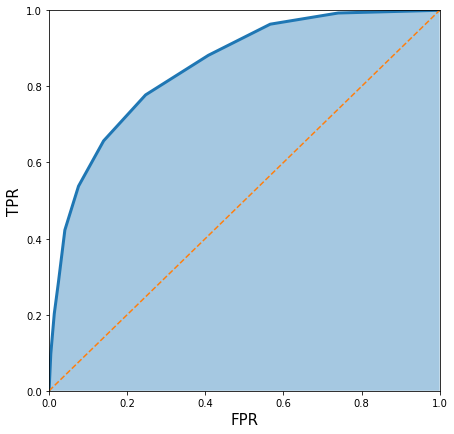

Win ROC :  0.854029161780334
================================================....................

B2 >>>>>>>>>>>>>>>>>a,rf2 and all predictors
train_matrix.shape :  (1000, 69)
train_matrix.shape :  (1750, 69)
train_matrix.shape :  (2500, 69)
train_matrix.shape :  (3250, 69)
train_matrix.shape :  (4000, 69)
Precision_score :Win  0.8393524283935243


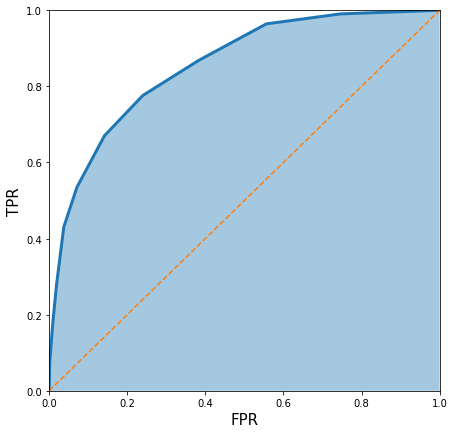

Win ROC :  0.8573550216832161
================================================....................

B3 >>>>>>>>>>>>>>>>>a ,rf and topKall predictors
train_matrix.shape :  (1000, 68)
train_matrix.shape :  (1750, 68)
train_matrix.shape :  (2500, 68)
train_matrix.shape :  (3250, 68)
train_matrix.shape :  (4000, 68)
Precision_score :Win  0.8385093167701864


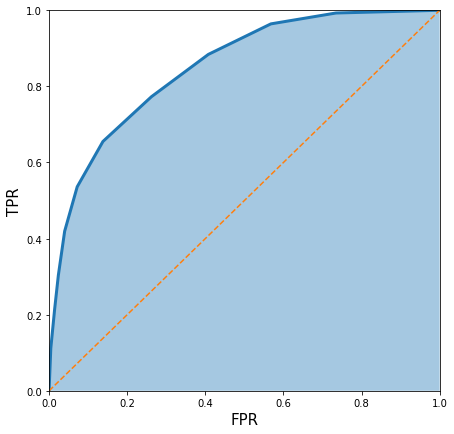

Win ROC :  0.8530236590179516
================================================....................

B4 >>>>>>>>>>>>>>>>>a ,rf2 and topKall predictors
train_matrix.shape :  (1000, 68)
train_matrix.shape :  (1750, 68)
train_matrix.shape :  (2500, 68)
train_matrix.shape :  (3250, 68)
train_matrix.shape :  (4000, 68)
Precision_score :Win  0.8362068965517241


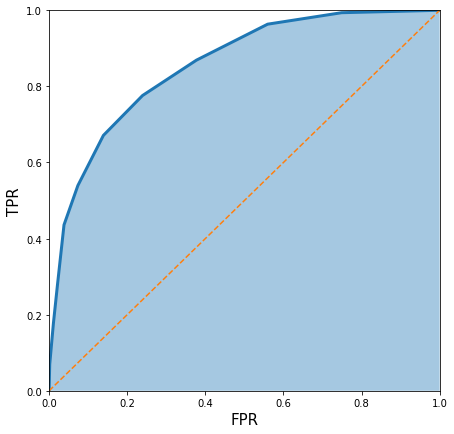

Win ROC :  0.8576929762221698
================================================....................

B5 >>>>>>>>>>>>>>>>>a_df ,rf and all predictors + cats
train_matrix.shape :  (1000, 112)
train_matrix.shape :  (1750, 114)
train_matrix.shape :  (2500, 114)
train_matrix.shape :  (3250, 114)
train_matrix.shape :  (4000, 114)
Precision_score :Win  0.8358024691358025


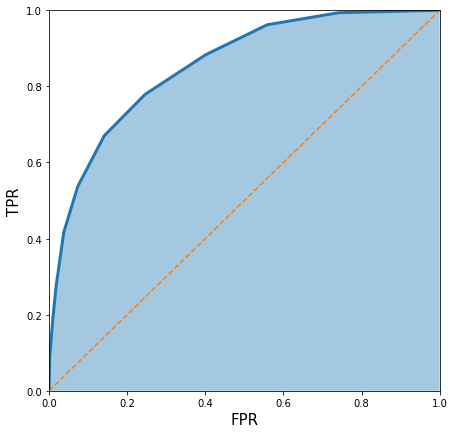

Win ROC :  0.8579072781238242
================================================....................

B6 >>>>>>>>>>>>>>>>>a_df ,rf2 and all predictors + cats
train_matrix.shape :  (1000, 112)
train_matrix.shape :  (1750, 114)
train_matrix.shape :  (2500, 114)
train_matrix.shape :  (3250, 114)
train_matrix.shape :  (4000, 114)
Precision_score :Win  0.8449131513647643


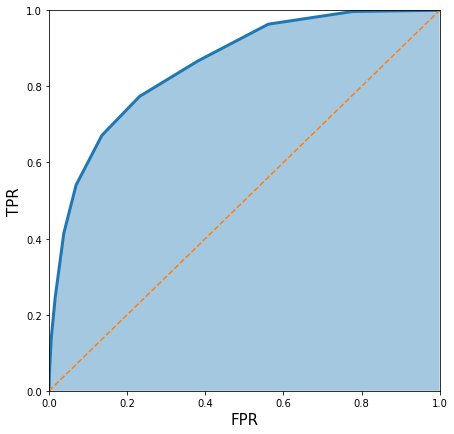

Win ROC :  0.8592458949304619
================================================....................

B7 >>>>>>>>>>>>>>>>>a_df ,rf and topkall predictors + cats
train_matrix.shape :  (1000, 111)
train_matrix.shape :  (1750, 113)
train_matrix.shape :  (2500, 113)
train_matrix.shape :  (3250, 113)
train_matrix.shape :  (4000, 113)
Precision_score :Win  0.8454882571075402


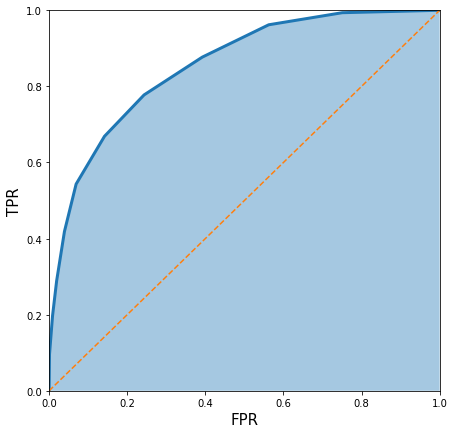

Win ROC :  0.8587059597490864
================================================....................

B8 >>>>>>>>>>>>>>>>>a_df ,rf2 and topkall predictors + cats
train_matrix.shape :  (1000, 111)
train_matrix.shape :  (1750, 113)
train_matrix.shape :  (2500, 113)
train_matrix.shape :  (3250, 113)
train_matrix.shape :  (4000, 113)
Precision_score :Win  0.844059405940594


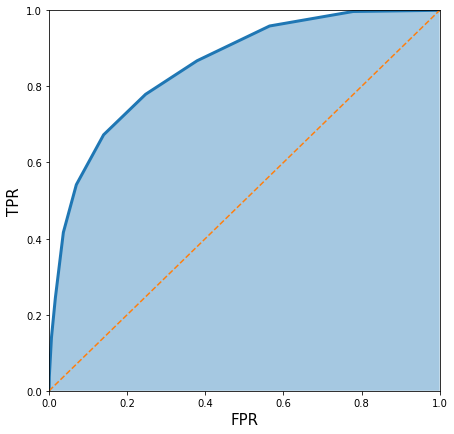

Win ROC :  0.858121139980506
================================================....................



In [71]:
preds_df , a__df = PCA_ish(df=df4,target='Win')

In [105]:
a__df.to_csv("C:\\Users\\user\\Solo Dolo\\EPL Analysis\\predictions data\\Win_data.csv",header=True,index=False)

In [90]:
preds_df[0].head()

,Team,Opponent,Result,Target,Predictions,Probs,Season
1000,Cardiff City,Brighton,W,1,1.0,0.799095,2019
1001,Cardiff City,Everton,L,0,0.0,0.025695,2019
1002,Cardiff City,Wolves,W,1,1.0,0.799912,2019
1003,Cardiff City,West Ham,L,0,0.0,0.074541,2019
1004,Cardiff City,Southampton,W,1,1.0,0.686976,2019


In [91]:
a__df.head()

,Total_Points,Total_GF,Total_GA,Total_Win,Total_Draw,Total_Loss,PC__total2,PC__total4,PC__total1,PC__total5,GF_this_month_sum,GA_this_month_sum,GF_this_month_mean,GA_this_month_mean,GF_mean_prev_month_,GA_mean_prev_month_,Poss_this_month_mean,PC__month_cols1,PC__month_cols7,PC__month_cols4,PC__month_cols6,Poss_this_Venue_mean,GF_this_Venue_mean,GA_this_Venue_mean,Win_this_Venue_sum,Lose_this_Venue_sum,Draw_this_Venue_sum,GF_this_Venue_sum,GA_this_Venue_sum,PC__venue_cols1,PC__venue_cols5,PC__venue_cols4,PC__venue_cols2,Poss_this_Opp_mean,GA_this_Opp_mean,GF_this_Opp_mean,Win_this_Opp_sum,Lose_this_Opp_sum,Draw_this_Opp_sum,GA_this_Opp_sum,GF_this_Opp_sum,PC__this_opp1,PC__this_opp6,PC__this_opp7,PC__this_opp3,PC__this_opp2,PC__this_opp4,PC__this_opp8,PC__this_opp5,Top7_Opp,Top7_Team,Top4_Opp,Top4_Team,PC__top4&72,PC__top4&74,PC__top4&71,PC__top4&73,Tackles_TklW_last_3gm_mean,Def_Int_last_3gm_mean,GK_Perf_SoTA_last_3gm_mean,GK_Perf_Saves_last_3gm_mean,GK_Perf_GA_last_3gm_mean,GK_Perf_CS_last_3gm_mean,PC__defense4,PC__defense1,PC__defense2,PC__defense5,PC__defense6,PC__defense3,Win,Season,Team,Opponent,Result,Comp,Venue,prev_opp,prev_comp
0,4.0,5.0,9.0,1.0,1.0,2.0,-0.506981,-0.121968,-3.048307,0.039219,6.2,0.8,2.31,0.256667,1.714286,1.857143,60.376667,1.470244,-0.014021,0.738894,0.109255,69.000000,4.00,3.000000,1.0,0.0,0.0,4.0,3.0,0.788195,0.296577,3.366554,-2.734734,58.000000,0.0,3.0,1.0,0.0,0.0,0.0,3.0,-2.567994,-0.130758,0.067911,-0.459467,0.293938,0.088019,-0.003806,-0.343009,0,1,0,0,-0.141398,1.339242,1.115676,-0.530088,10.666667,16.333333,5.666667,3.000000,2.666667,0.000000,0.754539,2.273157,-0.608256,0.485590,-0.096063,0.656455,1,2018,Arsenal,Bournemouth,W,Premier League,Home,Liverpool,Premier League
1,7.0,8.0,9.0,2.0,1.0,2.0,-0.608959,-0.103243,-2.899726,0.029019,3.0,0.0,3.00,0.000000,1.714286,1.857143,58.000000,1.472811,-0.771911,0.534035,0.764798,63.500000,3.50,1.500000,2.0,0.0,0.0,7.0,3.0,1.487276,0.172104,1.348940,-2.867568,72.000000,1.0,3.0,1.0,0.0,0.0,1.0,3.0,-2.226141,-0.198342,0.082939,-0.017619,0.953340,1.250688,-0.019796,0.239940,0,1,0,0,-0.141398,1.339242,1.115676,-0.530088,11.333333,15.666667,5.000000,3.333333,1.666667,0.333333,0.293384,0.958344,0.637336,0.345125,-0.053437,0.555037,1,2018,Arsenal,Europa,W,Europa,Home,Bournemouth,Premier League
2,10.0,11.0,10.0,3.0,1.0,2.0,-0.684015,-0.121324,-2.729148,0.041221,6.0,1.0,3.00,0.500000,1.714286,1.857143,65.000000,1.870514,-0.272064,0.824337,0.744119,63.500000,0.00,2.500000,0.0,2.0,0.0,0.0,5.0,-2.126093,-1.997914,1.116768,-2.028476,50.833333,1.0,1.0,0.0,0.0,1.0,1.0,1.0,0.129591,-0.131707,0.002351,1.280358,-1.603723,-0.001676,0.029730,-0.000601,1,1,1,0,2.395702,1.259797,-1.028859,-0.813344,10.000000,15.000000,5.000000,3.333333,1.666667,0.333333,0.544129,0.899976,0.523783,0.351232,-0.052074,0.058177,0,2018,Arsenal,Chelsea,D,Premier League,Away,Europa,Europa
3,14.0,12.0,10.0,4.0,2.0,2.0,-0.711739,-0.031766,-2.493522,0.081189,7.0,1.0,1.75,0.250000,1.714286,1.857143,58.750000,1.216043,0.309503,0.771137,-0.367449,64.000000,2.75,1.000000,4.0,0.0,0.0,11.0,4.0,1.701054,-0.381073,0.453445,-2.605714,69.000000,0.0,2.0,1.0,0.0,0.0,0.0,2.0,-2.191463,-0.048395,0.083828,-0.818875,-0.312142,1.043580,0.009639,0.200677,0,1,0,0,-0.141398,1.339242,1.115676,-0.530088,5.000000,9.000000,3.333333,3.000000,0.333333,0.666667,0.861502,-1.590398,0.800694,-0.005685,0.001047,-2.245260,1,2018,Arsenal,West Brom,W,Premier League,Home,EFL Cup,EFL Cup
4,17.0,14.0,10.0,5.0,2.0,2.0,-0.803564,-0.000544,-2.361210,0.096915,9.0,1.0,1.80,0.200000,1.714286,1.857143,60.800000,1.579025,0.583160,0.785005,-0.543411,58.333333,0.00,1.666667,0.0,2.0,1.0,0.0,5.0,-1.753692,-1.698501,0.322961,-1.998744,62.000000,2.0,4.0,1.0,0.0,0.0,2.0,4.0,-2.039709,-0.356495,0.072972,0.748204,2.216627,0.442266,-0.048915,0.191170,0,1,0,0,-0.141398,1.339242,1.115676,-0.530088,5.666667,11.000000,2.333333,2.000000,0.000000,1.000000,1.108743,-3.010713,1.171878,0.600640,-0.141280,-1.594907,1,2018,Arsenal,Europa,W,Europa,Away,West Brom,Pre

get PCA cols
X__total


,PC__total1,PC__total2,PC__total3,PC__total4,PC__total5,PC__total6
Total_Points,0.469766,-0.302114,0.068232,0.259357,0.297685,7.262981e-01
Total_GF,0.467809,-0.291923,0.105089,-0.359373,-0.745482,-3.330669e-16
Total_GA,0.391082,0.478648,0.176401,-0.654365,0.398296,-1.110223e-16
Total_Win,0.449306,-0.354543,0.193090,0.258178,0.323546,-6.810302e-01
Total_Draw,0.377617,0.236333,-0.879083,0.134565,-0.044373,-9.321476e-02
Total_Loss,0.251117,0.642534,0.378303,0.539099,-0.300581,2.428613e-17


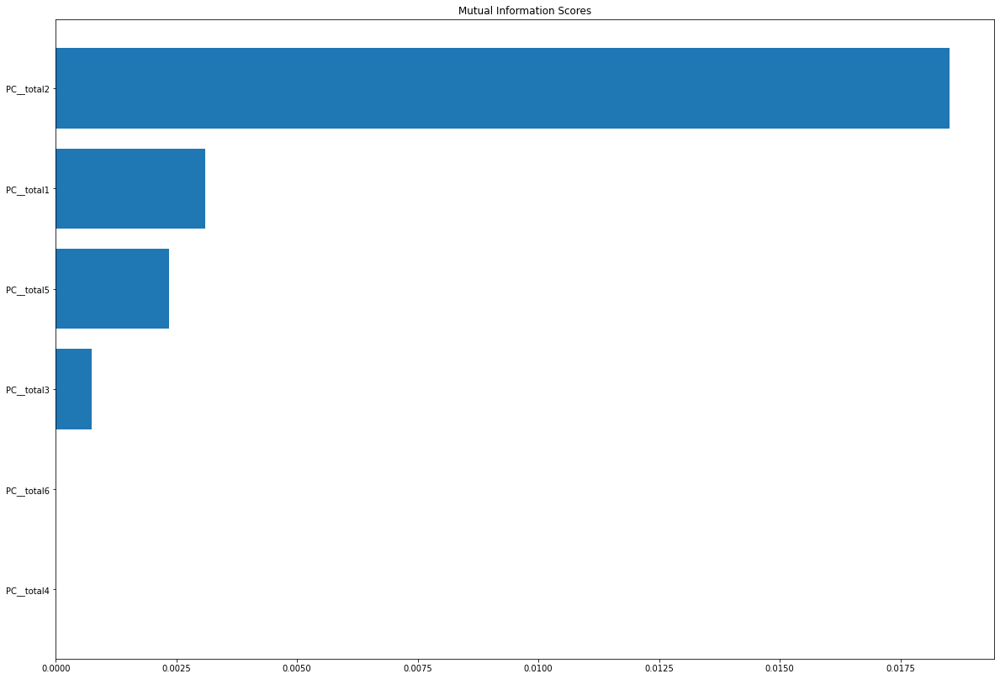


X__szn_avg


,PC__szn_avg1,PC__szn_avg2,PC__szn_avg3,PC__szn_avg4,PC__szn_avg5,PC__szn_avg6
Points_Avg_for_szn,-0.477798,-0.018255,0.038529,-0.341363,7.918347e-01,-1.623591e-01
GF_Avg_for_szn,-0.428843,-0.071757,0.599725,0.671770,-1.110223e-16,-1.249001e-16
GA_Avg_for_szn,0.396016,-0.205354,0.769858,-0.456421,2.775558e-17,-4.510281e-17
Win_Avg_for_szn,-0.469206,-0.180787,0.002685,-0.321239,-5.464115e-01,-5.877022e-01
Draw_Avg_for_szn,0.120597,0.896302,0.182734,0.009591,9.655751e-03,-3.853847e-01
Loss_Avg_for_szn,0.443030,-0.341036,-0.112986,0.347261,2.726519e-01,-6.926213e-01


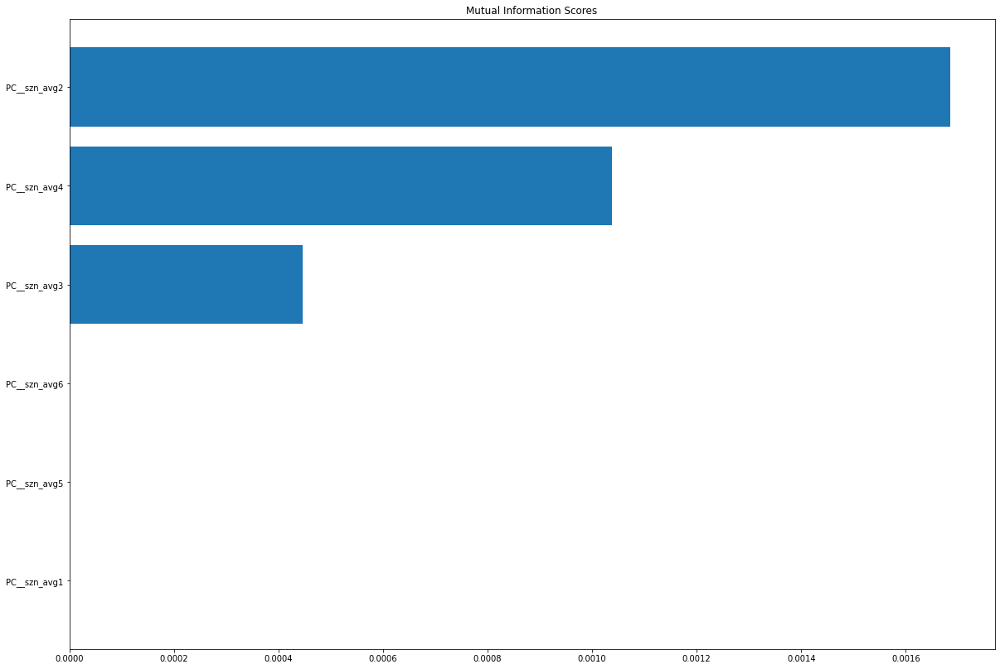


X__rol1-3


,PC__rol1-31,PC__rol1-32,PC__rol1-33,PC__rol1-34,PC__rol1-35,PC__rol1-36,PC__rol1-37,PC__rol1-38,PC__rol1-39
Points_last_1gm_sum,0.335712,-0.043182,0.071965,0.311060,-0.063373,0.877955,0.093136,-2.816382e-15,2.264188e-15
Points_last_3gm_mean,0.461567,-0.036809,0.041178,0.116397,0.042821,-0.185421,-0.324345,7.912080e-01,5.415888e-02
Win_last_3gm_mean,0.441036,-0.242749,0.033143,0.131400,-0.029597,-0.200921,-0.292890,-4.959805e-01,5.959608e-01
Draw_last_3gm_mean,-0.065759,0.809264,0.018162,-0.094751,0.267024,0.118400,-0.019748,6.052587e-02,4.920230e-01
Lose_last_3gm_mean,-0.404050,-0.397772,-0.048897,-0.060088,-0.183554,0.113122,0.319202,3.526044e-01,6.323061e-01
GF_last_3gm_mean,0.361364,-0.181274,-0.031409,-0.196288,0.655606,-0.091204,0.599085,5.551115e-17,2.792905e-16
GA_last_3gm_mean,-0.342529,-0.297185,-0.060285,-0.101480,0.626261,0.262410,-0.565120,-1.665335e-16,-1.491862e-16
Poss_last_3gm_mean,0.248617,-0.031169,-0.149567,-0.882302,-0.257211,0.224615,-0.140647,2.775558e-17,-2.029626e-16
Played_Opp_X_times,-0.049399,-0.050715,0.980977,-0.180429,0.010019,0.001063,-0.004038,7.632783e-17,8.370041e-17


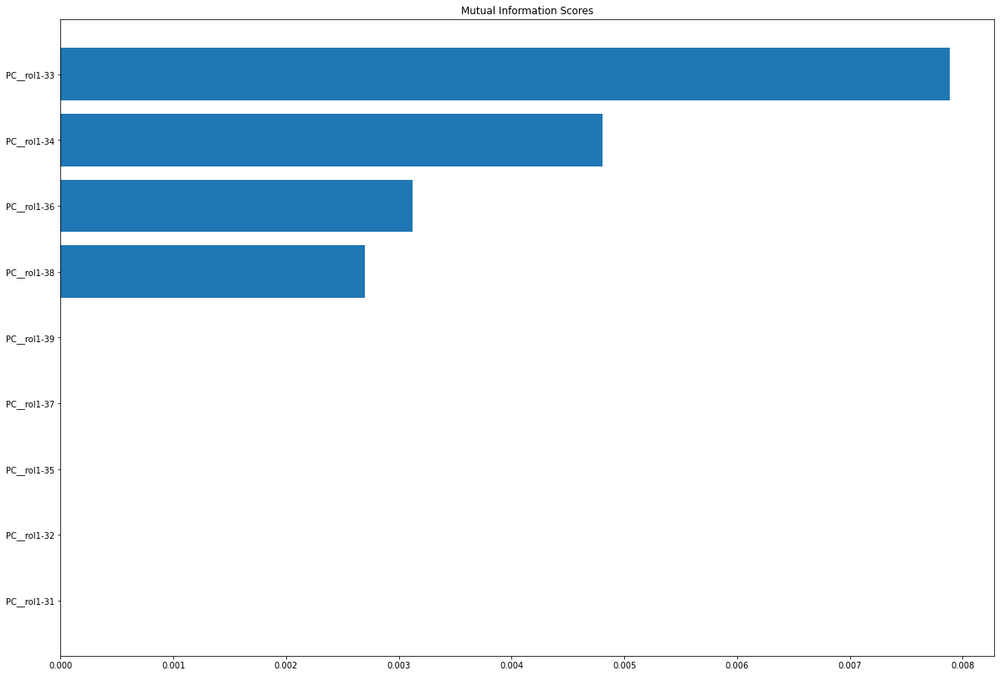


X__month_cols


,PC__month_cols1,PC__month_cols2,PC__month_cols3,PC__month_cols4,PC__month_cols5,PC__month_cols6,PC__month_cols7
GF_this_month_sum,0.432234,0.428614,0.341914,-0.099954,-0.032125,-0.378552,0.598526
GA_this_month_sum,-0.168492,0.706922,-0.107632,0.066222,0.090634,-0.382433,-0.549028
GF_this_month_mean,0.455851,0.216689,0.419690,-0.198194,-0.183832,0.579120,-0.400813
GA_this_month_mean,-0.345977,0.518172,-0.267174,0.109607,-0.032813,0.591104,0.421808
GF_mean_prev_month_,0.402165,0.001895,-0.416297,0.523750,-0.621066,-0.059353,-0.037381
GA_mean_prev_month_,-0.312703,-0.032056,0.646776,0.692857,-0.052421,0.007990,-0.002752
Poss_this_month_mean,0.444707,0.008007,-0.179907,0.424222,0.753268,0.148571,-0.018869


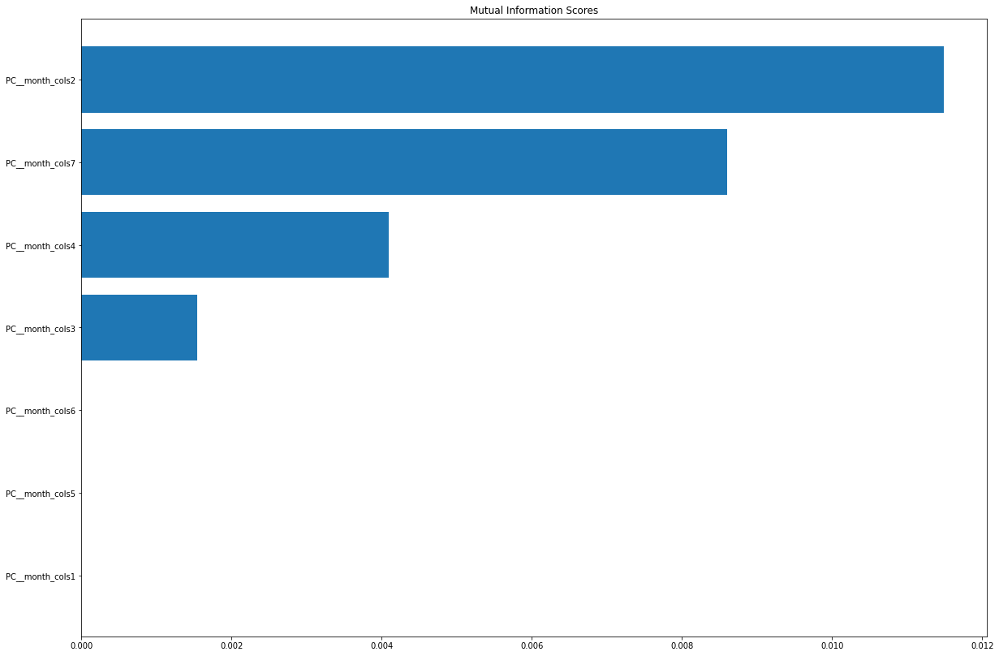


X__venue_cols


,PC__venue_cols1,PC__venue_cols2,PC__venue_cols3,PC__venue_cols4,PC__venue_cols5,PC__venue_cols6,PC__venue_cols7,PC__venue_cols8
Poss_this_Venue_mean,0.439366,-0.067735,0.213358,0.326229,-0.805879,0.030854,-0.004226,-0.003436
GF_this_Venue_mean,0.450881,-0.092845,0.357758,0.238217,0.421191,-0.624336,0.079300,-0.172808
GA_this_Venue_mean,-0.393192,0.132939,0.571463,0.526573,0.153215,0.386053,0.190972,-0.122053
Win_this_Venue_sum,0.437049,0.312359,0.047572,-0.299210,0.123194,0.438903,-0.030689,-0.640996
Lose_this_Venue_sum,-0.268059,0.466426,0.175143,-0.355535,-0.300335,-0.396225,0.537661,-0.131287
Draw_this_Venue_sum,0.042236,0.425938,-0.647001,0.581183,0.047520,-0.088303,0.173282,-0.142575
GF_this_Venue_sum,0.416222,0.373416,0.104690,-0.072946,0.198905,0.250572,0.269022,0.704498
GA_this_Venue_sum,-0.105699,0.577178,0.193417,0.022863,-0.049830,-0.200006,-0.751534,0.102331


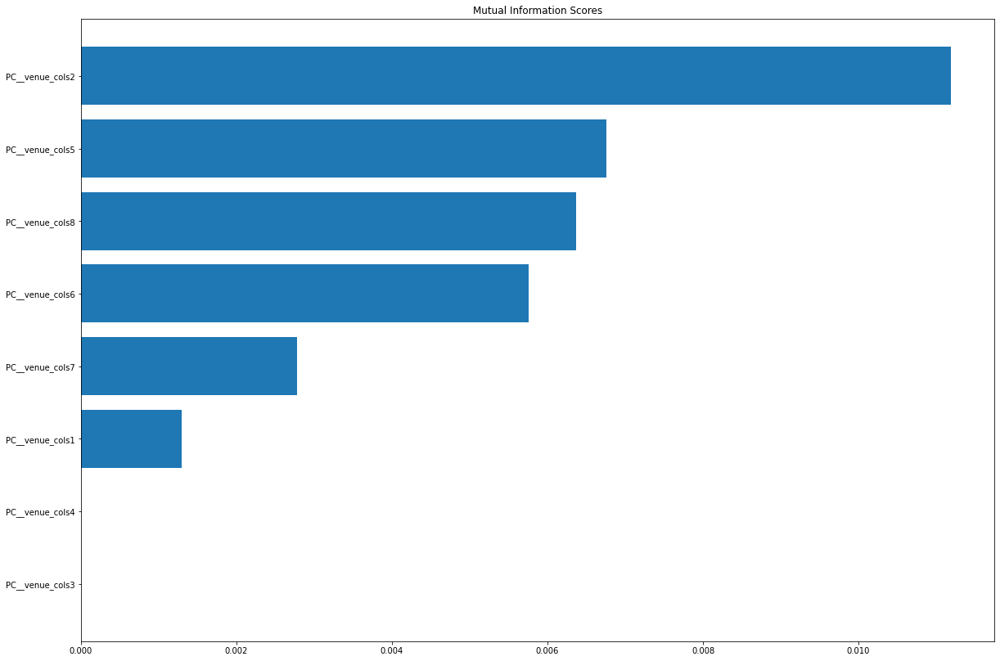


X__this_opp


,PC__this_opp1,PC__this_opp2,PC__this_opp3,PC__this_opp4,PC__this_opp5,PC__this_opp6,PC__this_opp7,PC__this_opp8
Poss_this_Opp_mean,-0.211848,0.002103,0.033949,0.972991,0.084345,0.007862,0.008698,-0.000303
GA_this_Opp_mean,0.380827,0.420215,0.253978,0.048564,0.365223,-0.366864,-0.472147,-0.347313
GF_this_Opp_mean,-0.388905,0.406090,0.254558,-0.064649,-0.359086,-0.357402,0.459786,-0.383123
Win_this_Opp_sum,-0.435350,0.215728,-0.277751,-0.136145,0.535981,0.468125,0.023712,-0.401587
Lose_this_Opp_sum,0.428000,0.232288,-0.290374,0.146794,-0.543575,0.448167,-0.067165,-0.395164
Draw_this_Opp_sum,0.021792,-0.430729,0.745384,-0.022344,-0.011267,0.376018,-0.017375,-0.340709
GA_this_Opp_sum,0.375149,0.437624,0.273613,0.040996,0.265450,0.306996,0.538680,0.369212
GF_this_Opp_sum,-0.380681,0.425404,0.278601,-0.066980,-0.277876,0.286325,-0.519661,0.403440


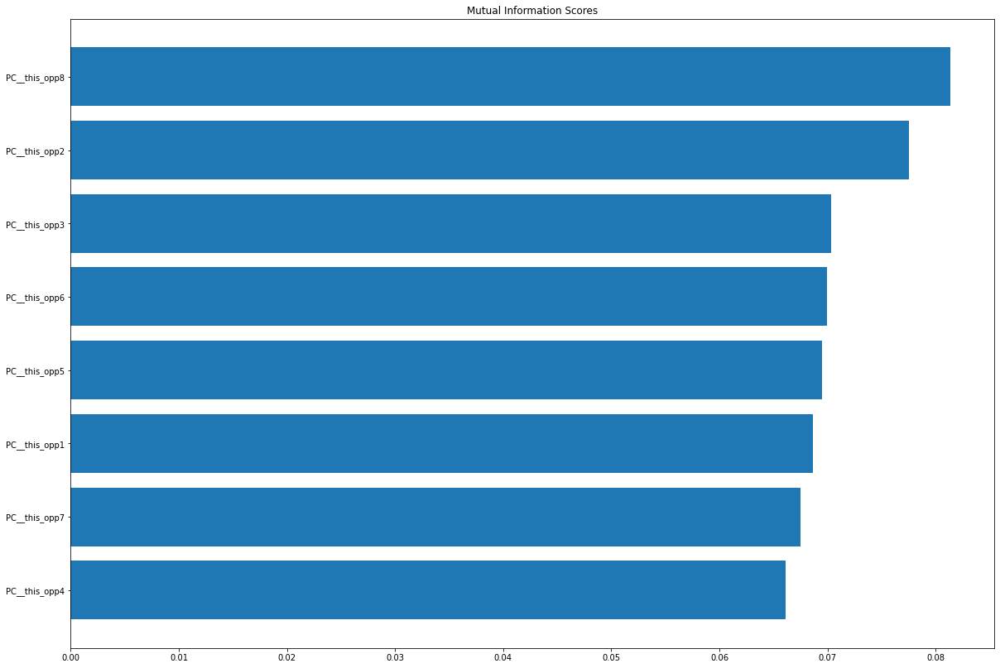


X__matchday


,PC__matchday1,PC__matchday2,PC__matchday3,PC__matchday4,PC__matchday5,PC__matchday6
Day_of_week,-0.053651,0.688747,-0.102966,0.093475,-0.709505,-0.003525
Kick_off_hr,0.042516,-0.682889,0.072770,-0.186420,-0.701271,0.005228
Kick_off_min,0.055106,-0.221902,-0.274578,0.932250,-0.056900,-0.001576
First_Match_In_Month,-0.049897,0.058070,0.951715,0.294694,-0.039150,0.000394
Rest,-0.703257,-0.061628,-0.037283,0.014984,0.004252,-0.707106
Rest_hrs,-0.703716,-0.053674,-0.039478,0.018743,0.005795,0.707078


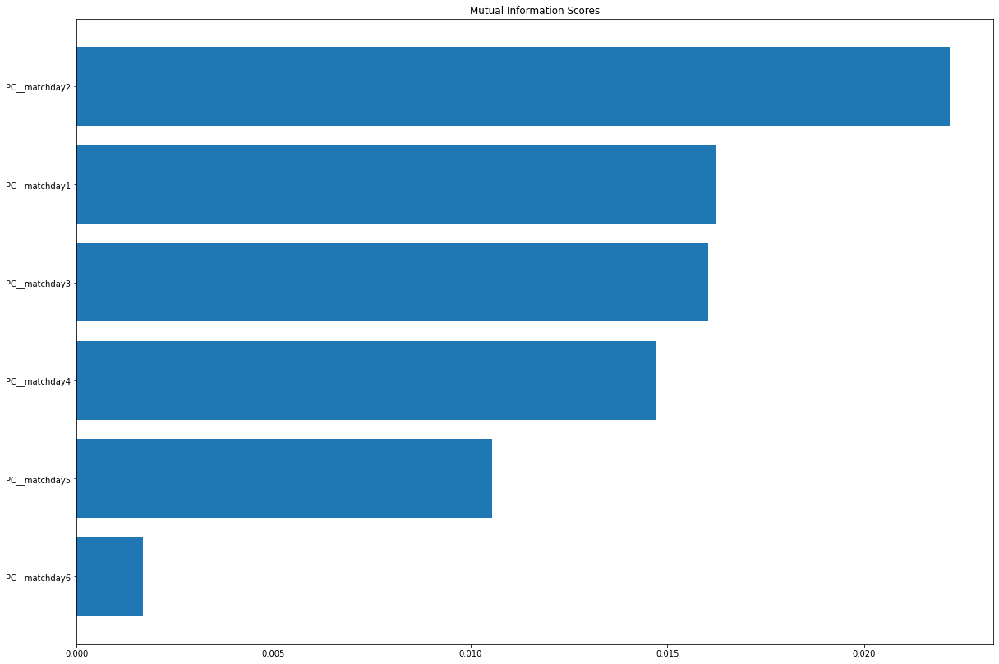


X__top4&7


,PC__top4&71,PC__top4&72,PC__top4&73,PC__top4&74
Top7_Opp,-0.462160,0.534307,0.680311,0.195195
Top7_Team,0.539830,0.456708,-0.187581,0.681773
Top4_Opp,-0.451792,0.544901,-0.679170,-0.194154
Top4_Team,0.539329,0.457184,0.201789,-0.677782


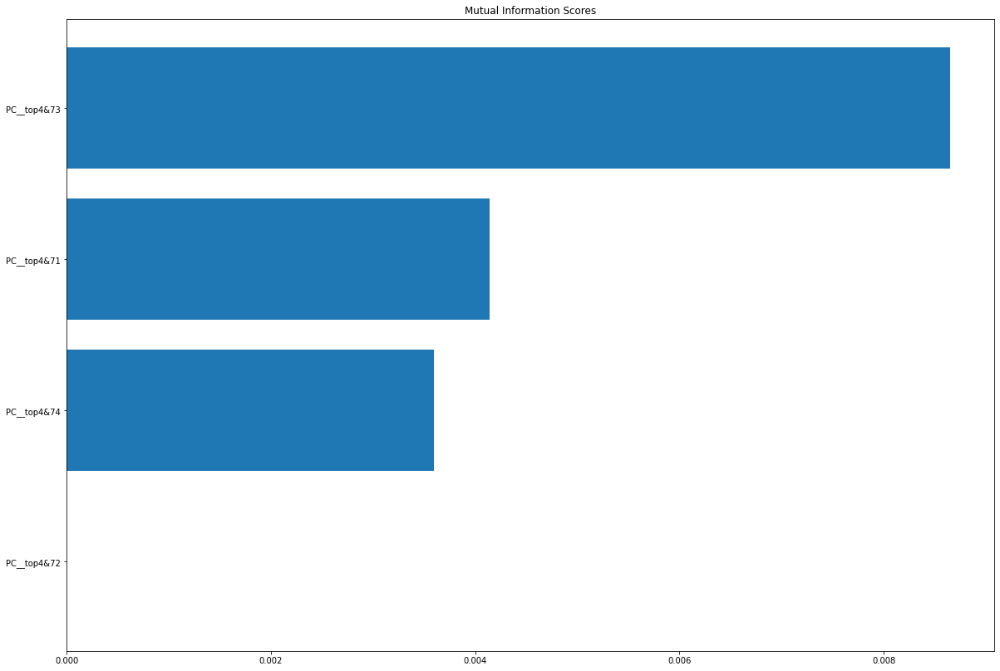


X__offense


,PC__offense1,PC__offense2,PC__offense3,PC__offense4,PC__offense5,PC__offense6,PC__offense7,PC__offense8
Standard_SoT%_last_3gm_mean,0.319010,-0.142528,0.378257,0.730557,-0.093497,0.046853,0.191560,0.391784
Standard_G/Sh_last_3gm_mean,0.363212,-0.207541,0.480791,-0.258134,0.638420,-0.000607,0.185105,-0.292175
Standard_Sh_last_3gm_mean,0.290664,0.007770,-0.698839,0.006018,0.405176,0.030926,0.389180,0.332349
Standard_SoT_last_3gm_mean,0.433567,-0.068139,-0.338900,0.401455,-0.058690,-0.061654,-0.314262,-0.652189
Standard_Gls_last_3gm_mean,0.489246,0.006030,0.034406,-0.296132,-0.023926,-0.195798,-0.650147,0.458393
Standard_PK_last_3gm_mean,0.159098,0.673329,0.115072,0.007941,-0.071158,-0.650854,0.269624,-0.081478
Standard_PKatt_last_3gm_mean,0.159638,0.674332,0.089247,0.021550,0.092432,0.700626,-0.107384,-0.020244
Passing_Ast_last_3gm_mean,0.451315,-0.154197,0.011918,-0.387595,-0.633945,0.200552,0.414608,-0.090331


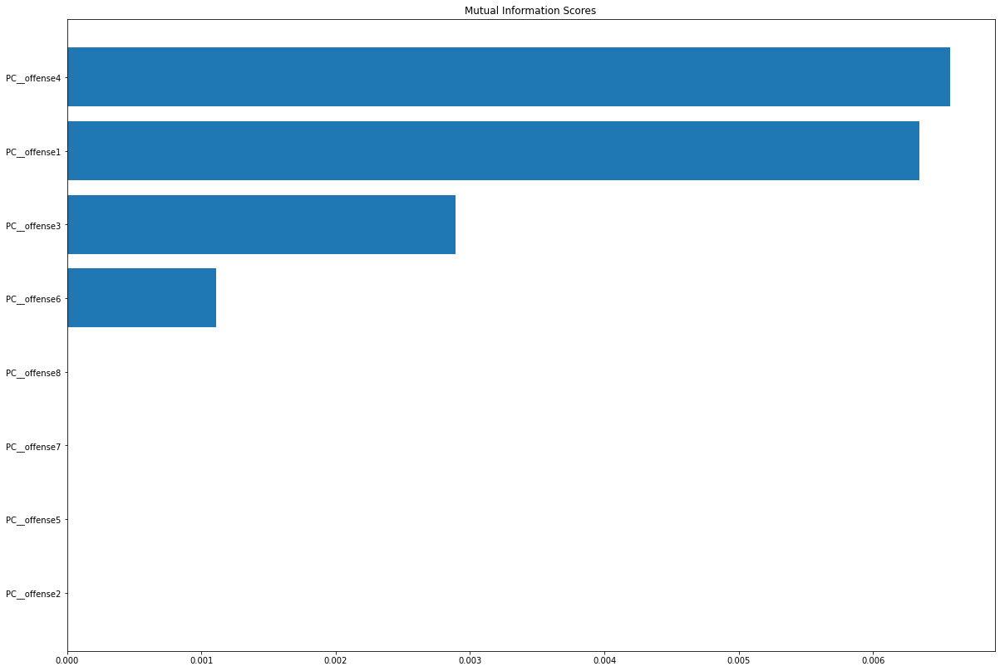


X__defense


,PC__defense1,PC__defense2,PC__defense3,PC__defense4,PC__defense5,PC__defense6
Tackles_TklW_last_3gm_mean,0.067317,0.113854,0.749387,-0.648774,0.003224,-0.002546
Def_Int_last_3gm_mean,0.144590,0.345634,0.567668,0.731093,-0.053742,0.000288
GK_Perf_SoTA_last_3gm_mean,0.576306,0.252351,-0.170435,-0.089112,0.156993,-0.736583
GK_Perf_Saves_last_3gm_mean,0.444565,0.568814,-0.266729,-0.165465,-0.210926,0.579483
GK_Perf_GA_last_3gm_mean,0.497046,-0.433574,0.091775,0.083377,0.654324,0.348488
GK_Perf_CS_last_3gm_mean,-0.444681,0.540701,-0.086936,-0.048211,0.706983,0.013954


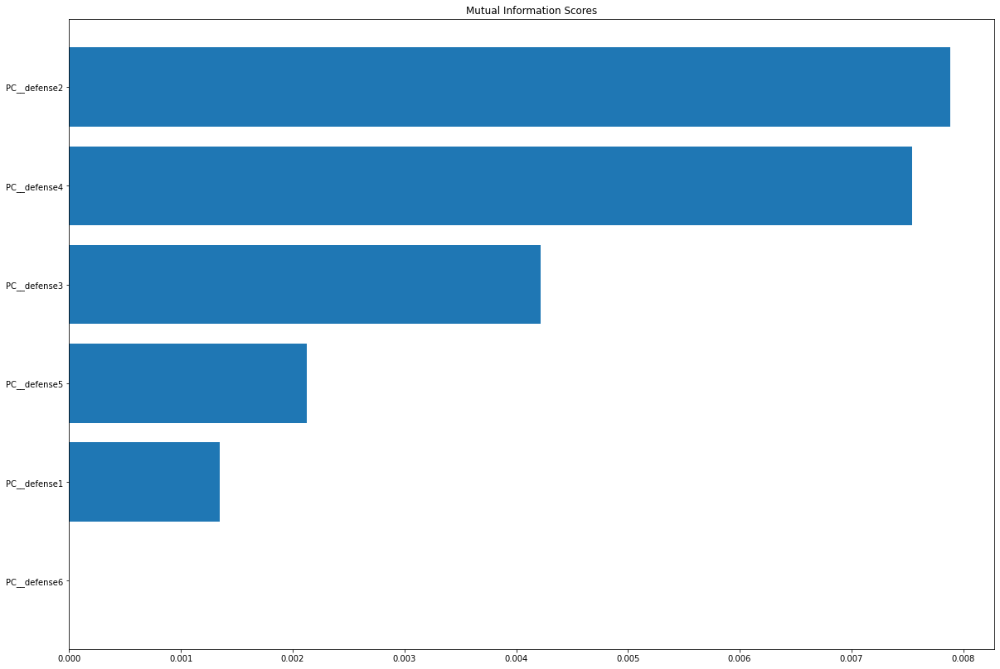


Run front test
_total
df_arrs lenghth 1
Shape :  (4064, 15)
Draw Accuracy Score :  0.7683544303797468



predicted_Draw,0.0,1.0
actual,,
0,606,1
1,182,1


Draw Precision :  0.5
Draw F1_score :  0.010810810810810811
Draw ROC :  0.5019085172081634
Draw Recall :  0.00546448087431694


difference in f1_score  0.010810810810810811
keeping  _total
++++++++++++++++++++++Starting split+++++++++++++++++++++++++++++++++++++++++
_total
df_arrs lenghth 1
Shape :  (4064, 15)
Draw Accuracy Score :  0.7683544303797468



predicted_Draw,0.0,1.0
actual,,
0,606,1
1,182,1


Draw Precision :  0.5
Draw F1_score :  0.010810810810810811
Draw ROC :  0.5019085172081634
Draw Recall :  0.00546448087431694


++++++++++++++++++++++Endinging split+++++++++++++++++++++++++++++++++++++++++
Back to front test

============================================================>>>>>>>>>>>>>>>>>>
_szn_avg
df_arrs lenghth 2
Shape :  (4064, 24)
Draw Accuracy Score :  0.7645569620253164



predicted_Draw,0.0,1.0
actual,,
0,602,5
1,181,2


Draw Precision :  0.2857142857142857
Draw F1_score :  0.021052631578947368
Draw ROC :  0.5013458647293417
Draw Recall :  0.01092896174863388


difference in f1_score  0.010241820768136557
keeping  _szn_avg
++++++++++++++++++++++Starting split+++++++++++++++++++++++++++++++++++++++++
_total
df_arrs lenghth 1
Shape :  (4064, 15)
Draw Accuracy Score :  0.7683544303797468



predicted_Draw,0.0,1.0
actual,,
0,606,1
1,182,1


Draw Precision :  0.5
Draw F1_score :  0.010810810810810811
Draw ROC :  0.5019085172081634
Draw Recall :  0.00546448087431694


_szn_avg
df_arrs lenghth 2
Shape :  (4064, 24)
Draw Accuracy Score :  0.7645569620253164



predicted_Draw,0.0,1.0
actual,,
0,602,5
1,181,2


Draw Precision :  0.2857142857142857
Draw F1_score :  0.021052631578947368
Draw ROC :  0.5013458647293417
Draw Recall :  0.01092896174863388


++++++++++++++++++++++Endinging split+++++++++++++++++++++++++++++++++++++++++
Back to front test

============================================================>>>>>>>>>>>>>>>>>>
_rol1-3
df_arrs lenghth 3
Shape :  (4064, 37)
Draw Accuracy Score :  0.7670886075949367



predicted_Draw,0.0,1.0
actual,,
0,606,1
1,183,0


Draw Precision :  0.0
Draw F1_score :  0.0
Draw ROC :  0.49917627677100496
Draw Recall :  0.0


difference in f1_score  -0.021052631578947368
discarding  _rol1-3
============================================================>>>>>>>>>>>>>>>>>>
_month_cols
df_arrs lenghth 4
Shape :  (4064, 48)
Draw Accuracy Score :  0.7683544303797468



predicted_Draw,0.0
actual,
0,607
1,183


Draw Precision :  0.0
Draw F1_score :  0.0
Draw ROC :  0.5
Draw Recall :  0.0


difference in f1_score  0.0
discarding  _month_cols
============================================================>>>>>>>>>>>>>>>>>>
_venue_cols
df_arrs lenghth 5
Shape :  (4064, 62)
Draw Accuracy Score :  0.7683544303797468



predicted_Draw,0.0
actual,
0,607
1,183


Draw Precision :  0.0
Draw F1_score :  0.0
Draw ROC :  0.5
Draw Recall :  0.0


difference in f1_score  0.0
discarding  _venue_cols
============================================================>>>>>>>>>>>>>>>>>>
_this_opp
df_arrs lenghth 6
Shape :  (4064, 78)
Draw Accuracy Score :  0.8544303797468354



predicted_Draw,0.0,1.0
actual,,
0,602,5
1,110,73


Draw Precision :  0.9358974358974359
Draw F1_score :  0.5593869731800766
Draw ROC :  0.6953349357675931
Draw Recall :  0.3989071038251366


difference in f1_score  0.5593869731800766
keeping  _this_opp
++++++++++++++++++++++Starting split+++++++++++++++++++++++++++++++++++++++++
_total
df_arrs lenghth 1
Shape :  (4064, 15)
Draw Accuracy Score :  0.7683544303797468



predicted_Draw,0.0,1.0
actual,,
0,606,1
1,182,1


Draw Precision :  0.5
Draw F1_score :  0.010810810810810811
Draw ROC :  0.5019085172081634
Draw Recall :  0.00546448087431694


_szn_avg
df_arrs lenghth 2
Shape :  (4064, 24)
Draw Accuracy Score :  0.7645569620253164



predicted_Draw,0.0,1.0
actual,,
0,602,5
1,181,2


Draw Precision :  0.2857142857142857
Draw F1_score :  0.021052631578947368
Draw ROC :  0.5013458647293417
Draw Recall :  0.01092896174863388


_this_opp
df_arrs lenghth 3
Shape :  (4064, 40)
Draw Accuracy Score :  0.8531645569620253



predicted_Draw,0.0,1.0
actual,,
0,601,6
1,110,73


Draw Precision :  0.9240506329113924
Draw F1_score :  0.5572519083969466
Draw ROC :  0.6945112125385979
Draw Recall :  0.3989071038251366


++++++++++++++++++++++Endinging split+++++++++++++++++++++++++++++++++++++++++
Back to front test

============================================================>>>>>>>>>>>>>>>>>>
_matchday
df_arrs lenghth 7
Shape :  (4064, 90)
Draw Accuracy Score :  0.8493670886075949



predicted_Draw,0.0,1.0
actual,,
0,599,8
1,111,72


Draw Precision :  0.9
Draw F1_score :  0.5475285171102662
Draw ROC :  0.6901315256434494
Draw Recall :  0.39344262295081966


difference in f1_score  -0.011858456069810397
discarding  _matchday
============================================================>>>>>>>>>>>>>>>>>>
_top4&7
df_arrs lenghth 8
Shape :  (4064, 97)
Draw Accuracy Score :  0.8493670886075949



predicted_Draw,0.0,1.0
actual,,
0,599,8
1,111,72


Draw Precision :  0.9
Draw F1_score :  0.5475285171102662
Draw ROC :  0.6901315256434494
Draw Recall :  0.39344262295081966


difference in f1_score  0.0
discarding  _top4&7
============================================================>>>>>>>>>>>>>>>>>>
_offense
df_arrs lenghth 9
Shape :  (4064, 109)
Draw Accuracy Score :  0.850632911392405



predicted_Draw,0.0,1.0
actual,,
0,600,7
1,111,72


Draw Precision :  0.9113924050632911
Draw F1_score :  0.549618320610687
Draw ROC :  0.6909552488724444
Draw Recall :  0.39344262295081966


difference in f1_score  0.0020898035004208726
keeping  _offense
++++++++++++++++++++++Starting split+++++++++++++++++++++++++++++++++++++++++
_total
df_arrs lenghth 1
Shape :  (4064, 15)
Draw Accuracy Score :  0.7683544303797468



predicted_Draw,0.0,1.0
actual,,
0,606,1
1,182,1


Draw Precision :  0.5
Draw F1_score :  0.010810810810810811
Draw ROC :  0.5019085172081634
Draw Recall :  0.00546448087431694


_szn_avg
df_arrs lenghth 2
Shape :  (4064, 24)
Draw Accuracy Score :  0.7645569620253164



predicted_Draw,0.0,1.0
actual,,
0,602,5
1,181,2


Draw Precision :  0.2857142857142857
Draw F1_score :  0.021052631578947368
Draw ROC :  0.5013458647293417
Draw Recall :  0.01092896174863388


_this_opp
df_arrs lenghth 3
Shape :  (4064, 40)
Draw Accuracy Score :  0.8531645569620253



predicted_Draw,0.0,1.0
actual,,
0,601,6
1,110,73


Draw Precision :  0.9240506329113924
Draw F1_score :  0.5572519083969466
Draw ROC :  0.6945112125385979
Draw Recall :  0.3989071038251366


_offense
df_arrs lenghth 4
Shape :  (4064, 52)
Draw Accuracy Score :  0.850632911392405



predicted_Draw,0.0,1.0
actual,,
0,600,7
1,111,72


Draw Precision :  0.9113924050632911
Draw F1_score :  0.549618320610687
Draw ROC :  0.6909552488724444
Draw Recall :  0.39344262295081966


++++++++++++++++++++++Endinging split+++++++++++++++++++++++++++++++++++++++++
Back to front test

============================================================>>>>>>>>>>>>>>>>>>
_defense
df_arrs lenghth 10
Shape :  (4064, 120)
Draw Accuracy Score :  0.8531645569620253



predicted_Draw,0.0,1.0
actual,,
0,601,6
1,110,73


Draw Precision :  0.9240506329113924
Draw F1_score :  0.5572519083969466
Draw ROC :  0.6945112125385979
Draw Recall :  0.3989071038251366


difference in f1_score  0.007633587786259555
keeping  _defense
++++++++++++++++++++++Starting split+++++++++++++++++++++++++++++++++++++++++
_total
df_arrs lenghth 1
Shape :  (4064, 15)
Draw Accuracy Score :  0.7683544303797468



predicted_Draw,0.0,1.0
actual,,
0,606,1
1,182,1


Draw Precision :  0.5
Draw F1_score :  0.010810810810810811
Draw ROC :  0.5019085172081634
Draw Recall :  0.00546448087431694


_szn_avg
df_arrs lenghth 2
Shape :  (4064, 24)
Draw Accuracy Score :  0.7645569620253164



predicted_Draw,0.0,1.0
actual,,
0,602,5
1,181,2


Draw Precision :  0.2857142857142857
Draw F1_score :  0.021052631578947368
Draw ROC :  0.5013458647293417
Draw Recall :  0.01092896174863388


_this_opp
df_arrs lenghth 3
Shape :  (4064, 40)
Draw Accuracy Score :  0.8531645569620253



predicted_Draw,0.0,1.0
actual,,
0,601,6
1,110,73


Draw Precision :  0.9240506329113924
Draw F1_score :  0.5572519083969466
Draw ROC :  0.6945112125385979
Draw Recall :  0.3989071038251366


_offense
df_arrs lenghth 4
Shape :  (4064, 52)
Draw Accuracy Score :  0.850632911392405



predicted_Draw,0.0,1.0
actual,,
0,600,7
1,111,72


Draw Precision :  0.9113924050632911
Draw F1_score :  0.549618320610687
Draw ROC :  0.6909552488724444
Draw Recall :  0.39344262295081966


_defense
df_arrs lenghth 5
Shape :  (4064, 63)
Draw Accuracy Score :  0.8531645569620253



predicted_Draw,0.0,1.0
actual,,
0,600,7
1,109,74


Draw Precision :  0.9135802469135802
Draw F1_score :  0.5606060606060606
Draw ROC :  0.6964197297467614
Draw Recall :  0.40437158469945356


++++++++++++++++++++++Endinging split+++++++++++++++++++++++++++++++++++++++++
Back to front test

============================================================>>>>>>>>>>>>>>>>>>


['_total', '_szn_avg', '_this_opp', '_offense', '_defense']

B1 >>>>>>>>>>>>>>>>>a ,rf and all predictors
train_matrix.shape :  (1000, 58)
train_matrix.shape :  (1750, 58)
train_matrix.shape :  (2500, 58)
train_matrix.shape :  (3250, 58)
train_matrix.shape :  (4000, 58)
Precision_score :Draw  0.8971631205673759


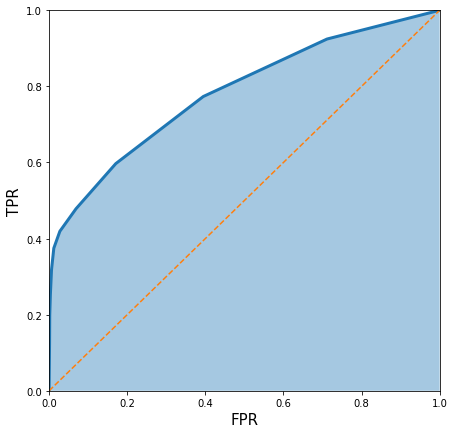

Draw ROC :  0.7906559384834815
================================================....................

B2 >>>>>>>>>>>>>>>>>a,rf2 and all predictors
train_matrix.shape :  (1000, 58)
train_matrix.shape :  (1750, 58)
train_matrix.shape :  (2500, 58)
train_matrix.shape :  (3250, 58)
train_matrix.shape :  (4000, 58)
Precision_score :Draw  0.8962962962962963


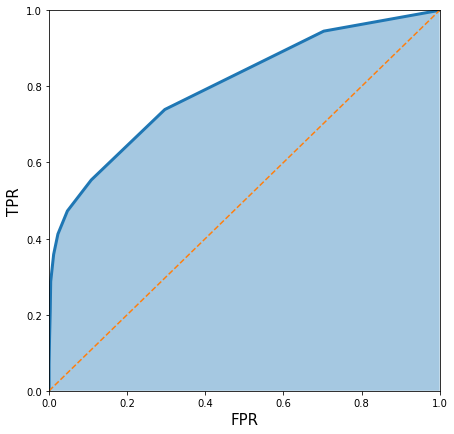

Draw ROC :  0.8094866905415252
================================================....................

B3 >>>>>>>>>>>>>>>>>a ,rf and topKall predictors
train_matrix.shape :  (1000, 48)
train_matrix.shape :  (1750, 48)
train_matrix.shape :  (2500, 48)
train_matrix.shape :  (3250, 48)
train_matrix.shape :  (4000, 48)
Precision_score :Draw  0.8951048951048951


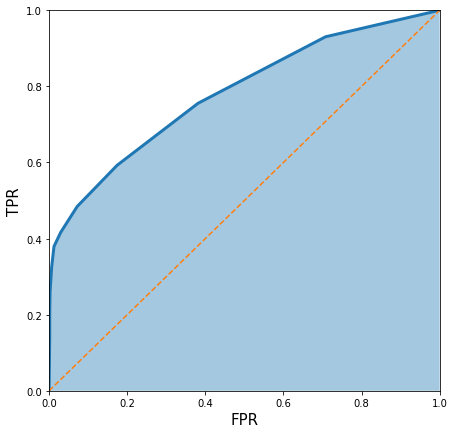

Draw ROC :  0.7881605506720617
================================================....................

B4 >>>>>>>>>>>>>>>>>a ,rf2 and topKall predictors
train_matrix.shape :  (1000, 48)
train_matrix.shape :  (1750, 48)
train_matrix.shape :  (2500, 48)
train_matrix.shape :  (3250, 48)
train_matrix.shape :  (4000, 48)
Precision_score :Draw  0.9037037037037037


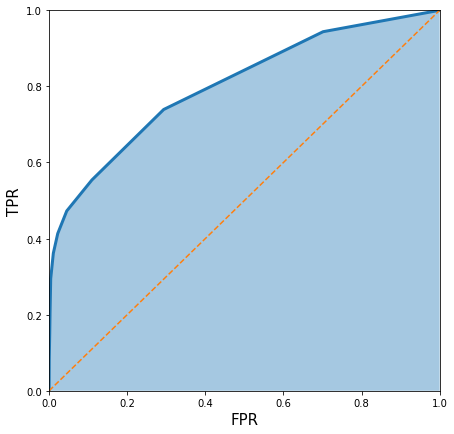

Draw ROC :  0.8112422678014976
================================================....................

B5 >>>>>>>>>>>>>>>>>a_df ,rf and all predictors + cats
train_matrix.shape :  (1000, 101)
train_matrix.shape :  (1750, 103)
train_matrix.shape :  (2500, 103)
train_matrix.shape :  (3250, 103)
train_matrix.shape :  (4000, 103)
Precision_score :Draw  0.9028776978417267


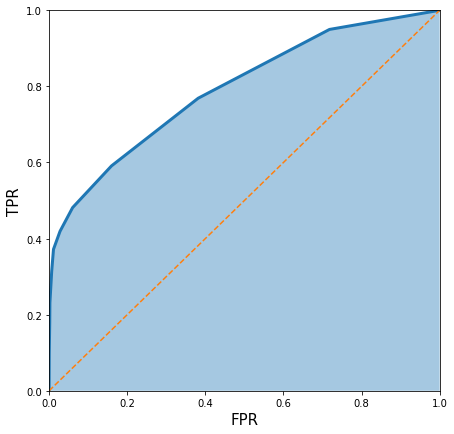

Draw ROC :  0.7949323287288963
================================================....................

B6 >>>>>>>>>>>>>>>>>a_df ,rf2 and all predictors + cats
train_matrix.shape :  (1000, 101)
train_matrix.shape :  (1750, 103)
train_matrix.shape :  (2500, 103)
train_matrix.shape :  (3250, 103)
train_matrix.shape :  (4000, 103)
Precision_score :Draw  0.9123505976095617


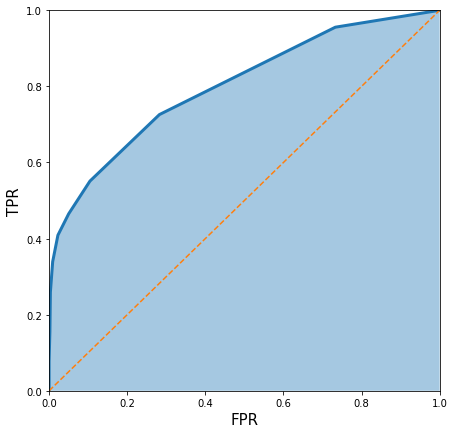

Draw ROC :  0.8117346480008681
================================================....................

B7 >>>>>>>>>>>>>>>>>a_df ,rf and topkall predictors + cats
train_matrix.shape :  (1000, 91)
train_matrix.shape :  (1750, 93)
train_matrix.shape :  (2500, 93)
train_matrix.shape :  (3250, 93)
train_matrix.shape :  (4000, 93)
Precision_score :Draw  0.9061371841155235


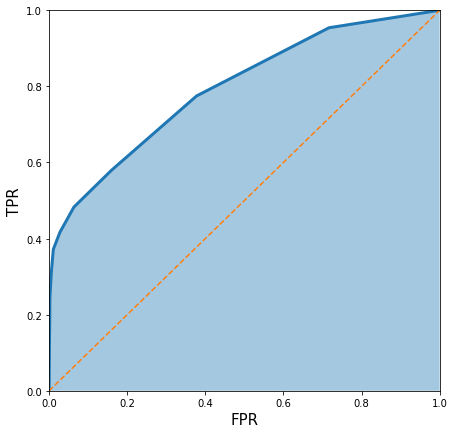

Draw ROC :  0.798393253026991
================================================....................

B8 >>>>>>>>>>>>>>>>>a_df ,rf2 and topkall predictors + cats
train_matrix.shape :  (1000, 91)
train_matrix.shape :  (1750, 93)
train_matrix.shape :  (2500, 93)
train_matrix.shape :  (3250, 93)
train_matrix.shape :  (4000, 93)
Precision_score :Draw  0.9


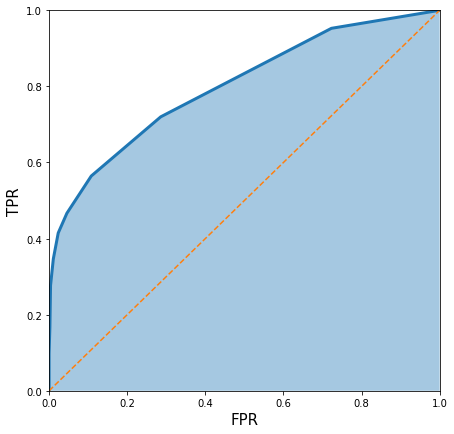

Draw ROC :  0.8124620560284018
================================================....................



In [76]:
preds_df_Draw , a__df_Draw = PCA_ish(df=df4,target='Draw')

In [106]:
a__df_Draw.to_csv("C:\\Users\\user\\Solo Dolo\\EPL Analysis\\predictions data\\Draw_data.csv",header=True,index=False)

In [94]:
preds_df_Draw[0].head()

,Team,Opponent,Result,Target,Predictions,Probs,Season
1000,Cardiff City,Brighton,W,0,0.0,0.078335,2019
1001,Cardiff City,Everton,L,0,0.0,0.090125,2019
1002,Cardiff City,Wolves,W,0,0.0,0.106814,2019
1003,Cardiff City,West Ham,L,0,0.0,0.080972,2019
1004,Cardiff City,Southampton,W,0,0.0,0.278530,2019


In [95]:
a__df_Draw.head()

,Total_Points,Total_GF,Total_GA,Total_Win,Total_Draw,Total_Loss,PC__total2,PC__total1,PC__total5,PC__total3,Points_Avg_for_szn,GF_Avg_for_szn,GA_Avg_for_szn,Win_Avg_for_szn,Draw_Avg_for_szn,Loss_Avg_for_szn,PC__szn_avg2,PC__szn_avg4,PC__szn_avg3,Poss_this_Opp_mean,GA_this_Opp_mean,GF_this_Opp_mean,Win_this_Opp_sum,Lose_this_Opp_sum,Draw_this_Opp_sum,GA_this_Opp_sum,GF_this_Opp_sum,PC__this_opp8,PC__this_opp2,PC__this_opp3,PC__this_opp6,PC__this_opp5,PC__this_opp1,PC__this_opp7,PC__this_opp4,Standard_SoT%_last_3gm_mean,Standard_G/Sh_last_3gm_mean,Standard_Sh_last_3gm_mean,Standard_SoT_last_3gm_mean,Standard_Gls_last_3gm_mean,Standard_PK_last_3gm_mean,Standard_PKatt_last_3gm_mean,Passing_Ast_last_3gm_mean,PC__offense4,PC__offense1,PC__offense3,PC__offense6,Tackles_TklW_last_3gm_mean,Def_Int_last_3gm_mean,GK_Perf_SoTA_last_3gm_mean,GK_Perf_Saves_last_3gm_mean,GK_Perf_GA_last_3gm_mean,GK_Perf_CS_last_3gm_mean,PC__defense2,PC__defense4,PC__defense3,PC__defense5,PC__defense1,Draw,Season,Team,Opponent,Result,Comp,Venue,prev_opp,prev_comp
0,4.0,5.0,9.0,1.0,1.0,2.0,-0.506981,-3.048307,0.039219,0.037066,1.000000,1.250000,2.250000,0.250000,0.250000,0.500000,-0.391447,-0.494009,1.479750,58.000000,0.0,3.0,1.0,0.0,0.0,0.0,3.0,-0.003806,0.293938,-0.459467,-0.130758,-0.343009,-2.567994,0.067911,0.088019,24.600000,0.050000,18.000000,5.666667,1.333333,0.000000,0.000000,1.333333,-0.329571,0.060680,-2.187725,-0.022069,10.666667,16.333333,5.666667,3.000000,2.666667,0.000000,-0.608256,0.754539,0.656455,0.485590,2.273157,0,2018,Arsenal,Bournemouth,W,Premier League,Home,Liverpool,Premier League
1,7.0,8.0,9.0,2.0,1.0,2.0,-0.608959,-2.899726,0.029019,0.076856,1.400000,1.600000,1.800000,0.400000,0.200000,0.400000,-0.592692,-0.279980,0.970127,72.000000,1.0,3.0,1.0,0.0,0.0,1.0,3.0,-0.019796,0.953340,-0.017619,-0.198342,0.239940,-2.226141,0.082939,1.250688,29.900000,0.060000,14.666667,5.333333,1.000000,0.000000,0.000000,1.000000,0.257453,-0.459626,-1.224951,-0.028342,11.333333,15.666667,5.000000,3.333333,1.666667,0.333333,0.637336,0.293384,0.555037,0.345125,0.958344,0,2018,Arsenal,Europa,W,Europa,Home,Bournemouth,Premier League
2,10.0,11.0,10.0,3.0,1.0,2.0,-0.684015,-2.729148,0.041221,0.126567,1.666667,1.833333,1.666667,0.500000,0.166667,0.333333,-0.814329,-0.331715,0.958314,50.833333,1.0,1.0,0.0,0.0,1.0,1.0,1.0,0.029730,-1.603723,1.280358,-0.131707,-0.000601,0.129591,0.002351,-0.001676,32.233333,0.123333,13.666667,5.333333,2.000000,0.000000,0.000000,1.333333,-0.360164,0.705251,-0.415918,-0.164514,10.000000,15.000000,5.000000,3.333333,1.666667,0.333333,0.523783,0.544129,0.058177,0.351232,0.899976,1,2018,Arsenal,Chelsea,D,Premier League,Away,Europa,Europa
3,14.0,12.0,10.0,4.0,2.0,2.0,-0.711739,-2.493522,0.081189,-0.078619,1.750000,1.500000,1.250000,0.500000,0.250000,0.250000,0.333909,-0.452445,-0.002358,69.000000,0.0,2.0,1.0,0.0,0.0,0.0,2.0,0.009639,-0.312142,-0.818875,-0.048395,0.200677,-2.191463,0.083828,1.043580,30.533333,0.076667,18.000000,5.666667,1.333333,0.000000,0.000000,0.666667,0.391366,-0.014862,-1.758065,-0.183715,5.000000,9.000000,3.333333,3.000000,0.333333,0.666667,0.800694,0.861502,-2.245260,-0.005685,-1.590398,0,2018,Arsenal,West Brom,W,Premier League,Home,EFL Cup,EFL Cup
4,17.0,14.0,10.0,5.0,2.0,2.0,-0.803564,-2.361210,0.096915,-0.042484,1.888889,1.555556,1.111111,0.555556,0.222222,0.222222,0.155456,-0.468705,-0.237349,62.000000,2.0,4.0,1.0,0.0,0.0,2.0,4.0,-0.048915,2.216627,0.748204,-0.356495,0.191170,-2.039709,0.072972,0.442266,27.033333,0.036667,17.666667,5.000000,1.000000,0.333333,0.333333,0.333333,0.470269,-0.448838,-1.683822,-0.235553,5.666667,11.000000,2.333333,2.000000,0.000000,1.000000,1.171878,1.108743,-1.594907,0.600640,-3.010713,0,2018,Arsenal,Europa,W,Europa,Away,West Brom,Premier League


get PCA cols
X__total


,PC__total1,PC__total2,PC__total3,PC__total4,PC__total5,PC__total6
Total_Points,0.469766,-0.302114,0.068232,0.259357,0.297685,7.262981e-01
Total_GF,0.467809,-0.291923,0.105089,-0.359373,-0.745482,-3.330669e-16
Total_GA,0.391082,0.478648,0.176401,-0.654365,0.398296,-1.110223e-16
Total_Win,0.449306,-0.354543,0.193090,0.258178,0.323546,-6.810302e-01
Total_Draw,0.377617,0.236333,-0.879083,0.134565,-0.044373,-9.321476e-02
Total_Loss,0.251117,0.642534,0.378303,0.539099,-0.300581,2.428613e-17


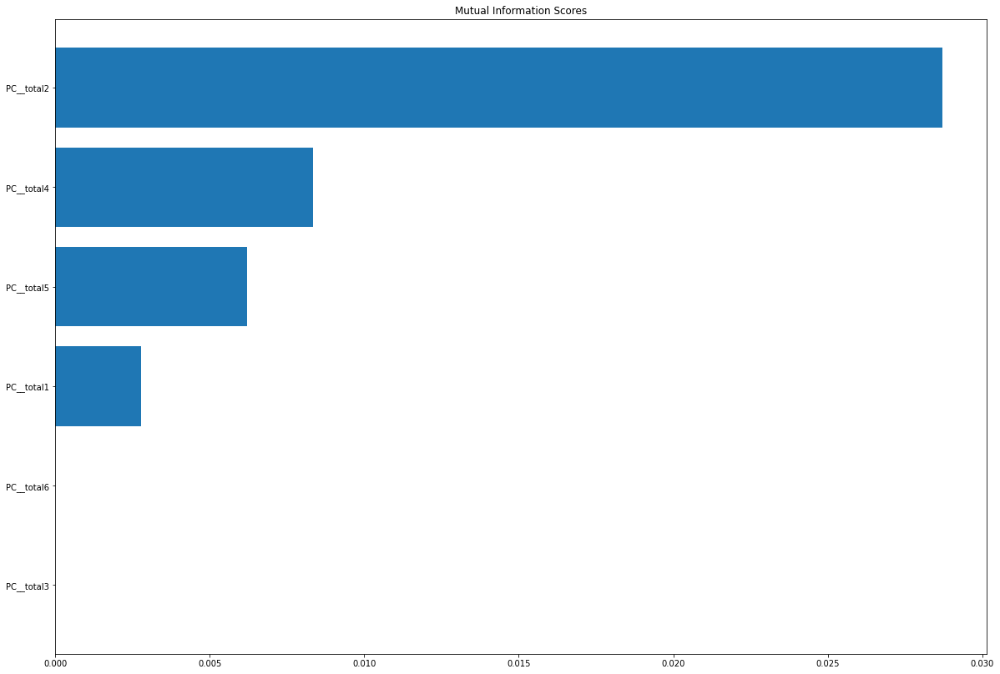


X__szn_avg


,PC__szn_avg1,PC__szn_avg2,PC__szn_avg3,PC__szn_avg4,PC__szn_avg5,PC__szn_avg6
Points_Avg_for_szn,-0.477798,-0.018255,0.038529,-0.341363,7.918347e-01,-1.623591e-01
GF_Avg_for_szn,-0.428843,-0.071757,0.599725,0.671770,-1.110223e-16,-1.249001e-16
GA_Avg_for_szn,0.396016,-0.205354,0.769858,-0.456421,2.775558e-17,-4.510281e-17
Win_Avg_for_szn,-0.469206,-0.180787,0.002685,-0.321239,-5.464115e-01,-5.877022e-01
Draw_Avg_for_szn,0.120597,0.896302,0.182734,0.009591,9.655751e-03,-3.853847e-01
Loss_Avg_for_szn,0.443030,-0.341036,-0.112986,0.347261,2.726519e-01,-6.926213e-01


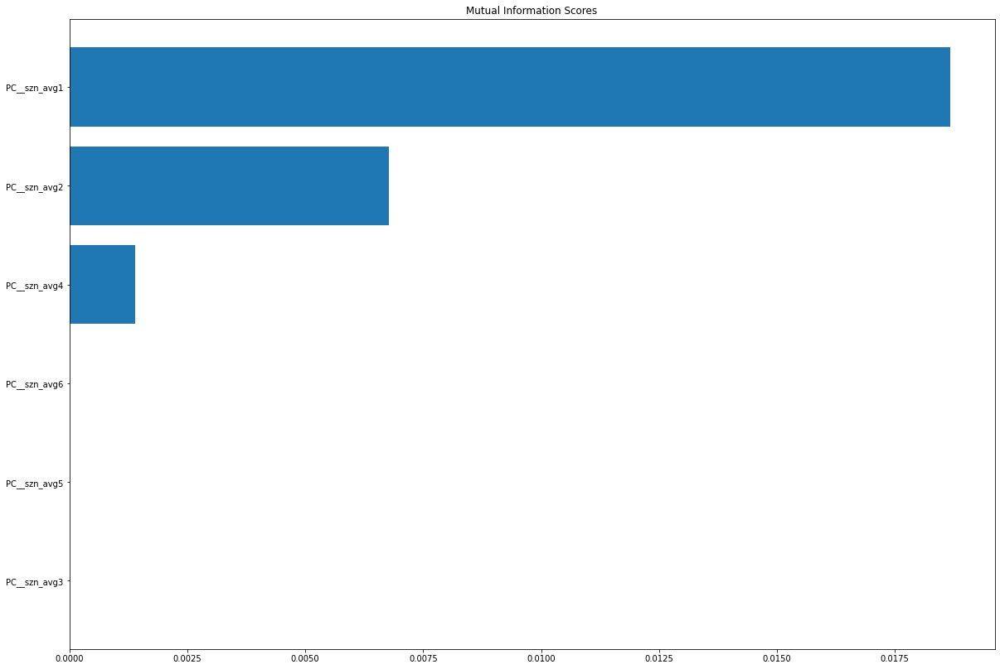


X__rol1-3


,PC__rol1-31,PC__rol1-32,PC__rol1-33,PC__rol1-34,PC__rol1-35,PC__rol1-36,PC__rol1-37,PC__rol1-38,PC__rol1-39
Points_last_1gm_sum,0.335712,-0.043182,0.071965,0.311060,-0.063373,0.877955,0.093136,-2.816382e-15,2.264188e-15
Points_last_3gm_mean,0.461567,-0.036809,0.041178,0.116397,0.042821,-0.185421,-0.324345,7.912080e-01,5.415888e-02
Win_last_3gm_mean,0.441036,-0.242749,0.033143,0.131400,-0.029597,-0.200921,-0.292890,-4.959805e-01,5.959608e-01
Draw_last_3gm_mean,-0.065759,0.809264,0.018162,-0.094751,0.267024,0.118400,-0.019748,6.052587e-02,4.920230e-01
Lose_last_3gm_mean,-0.404050,-0.397772,-0.048897,-0.060088,-0.183554,0.113122,0.319202,3.526044e-01,6.323061e-01
GF_last_3gm_mean,0.361364,-0.181274,-0.031409,-0.196288,0.655606,-0.091204,0.599085,5.551115e-17,2.792905e-16
GA_last_3gm_mean,-0.342529,-0.297185,-0.060285,-0.101480,0.626261,0.262410,-0.565120,-1.665335e-16,-1.491862e-16
Poss_last_3gm_mean,0.248617,-0.031169,-0.149567,-0.882302,-0.257211,0.224615,-0.140647,2.775558e-17,-2.029626e-16
Played_Opp_X_times,-0.049399,-0.050715,0.980977,-0.180429,0.010019,0.001063,-0.004038,7.632783e-17,8.370041e-17


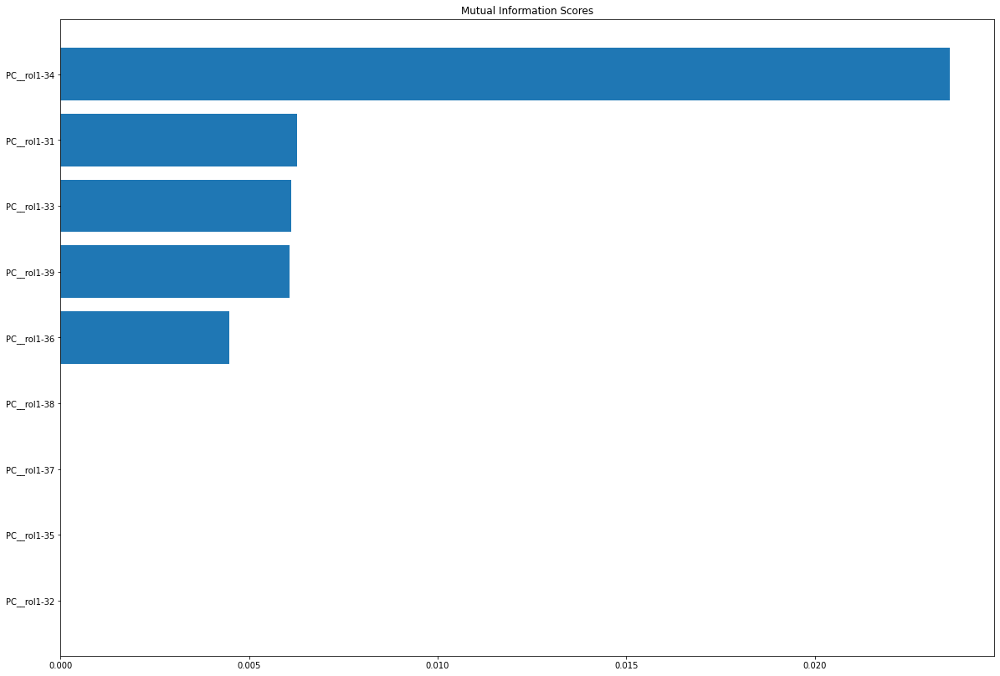


X__month_cols


,PC__month_cols1,PC__month_cols2,PC__month_cols3,PC__month_cols4,PC__month_cols5,PC__month_cols6,PC__month_cols7
GF_this_month_sum,0.432234,0.428614,0.341914,-0.099954,-0.032125,-0.378552,0.598526
GA_this_month_sum,-0.168492,0.706922,-0.107632,0.066222,0.090634,-0.382433,-0.549028
GF_this_month_mean,0.455851,0.216689,0.419690,-0.198194,-0.183832,0.579120,-0.400813
GA_this_month_mean,-0.345977,0.518172,-0.267174,0.109607,-0.032813,0.591104,0.421808
GF_mean_prev_month_,0.402165,0.001895,-0.416297,0.523750,-0.621066,-0.059353,-0.037381
GA_mean_prev_month_,-0.312703,-0.032056,0.646776,0.692857,-0.052421,0.007990,-0.002752
Poss_this_month_mean,0.444707,0.008007,-0.179907,0.424222,0.753268,0.148571,-0.018869


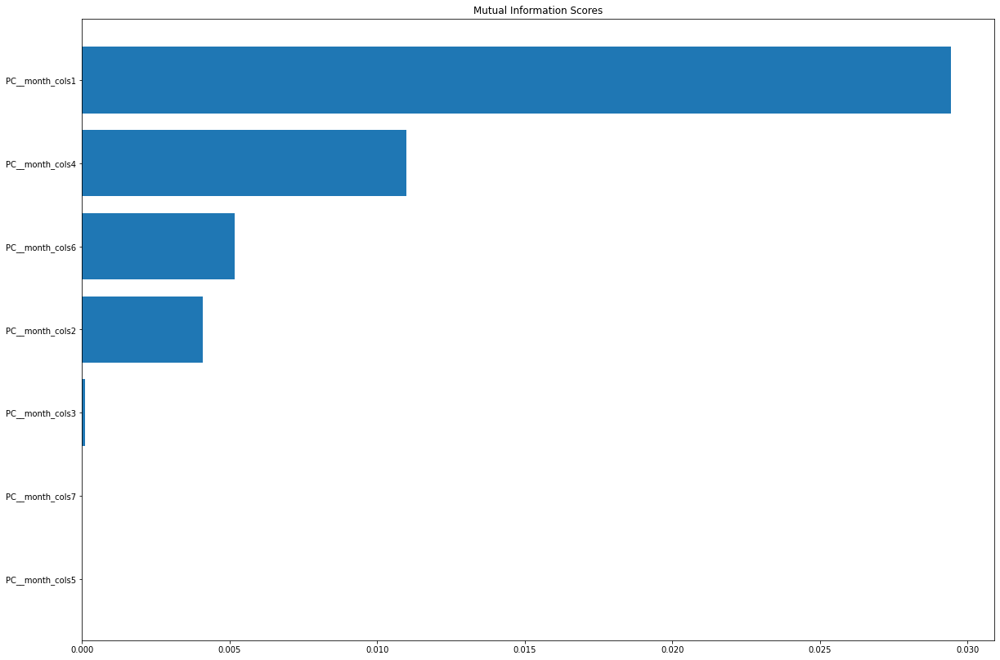


X__venue_cols


,PC__venue_cols1,PC__venue_cols2,PC__venue_cols3,PC__venue_cols4,PC__venue_cols5,PC__venue_cols6,PC__venue_cols7,PC__venue_cols8
Poss_this_Venue_mean,0.439366,-0.067735,0.213358,0.326229,-0.805879,0.030854,-0.004226,-0.003436
GF_this_Venue_mean,0.450881,-0.092845,0.357758,0.238217,0.421191,-0.624336,0.079300,-0.172808
GA_this_Venue_mean,-0.393192,0.132939,0.571463,0.526573,0.153215,0.386053,0.190972,-0.122053
Win_this_Venue_sum,0.437049,0.312359,0.047572,-0.299210,0.123194,0.438903,-0.030689,-0.640996
Lose_this_Venue_sum,-0.268059,0.466426,0.175143,-0.355535,-0.300335,-0.396225,0.537661,-0.131287
Draw_this_Venue_sum,0.042236,0.425938,-0.647001,0.581183,0.047520,-0.088303,0.173282,-0.142575
GF_this_Venue_sum,0.416222,0.373416,0.104690,-0.072946,0.198905,0.250572,0.269022,0.704498
GA_this_Venue_sum,-0.105699,0.577178,0.193417,0.022863,-0.049830,-0.200006,-0.751534,0.102331


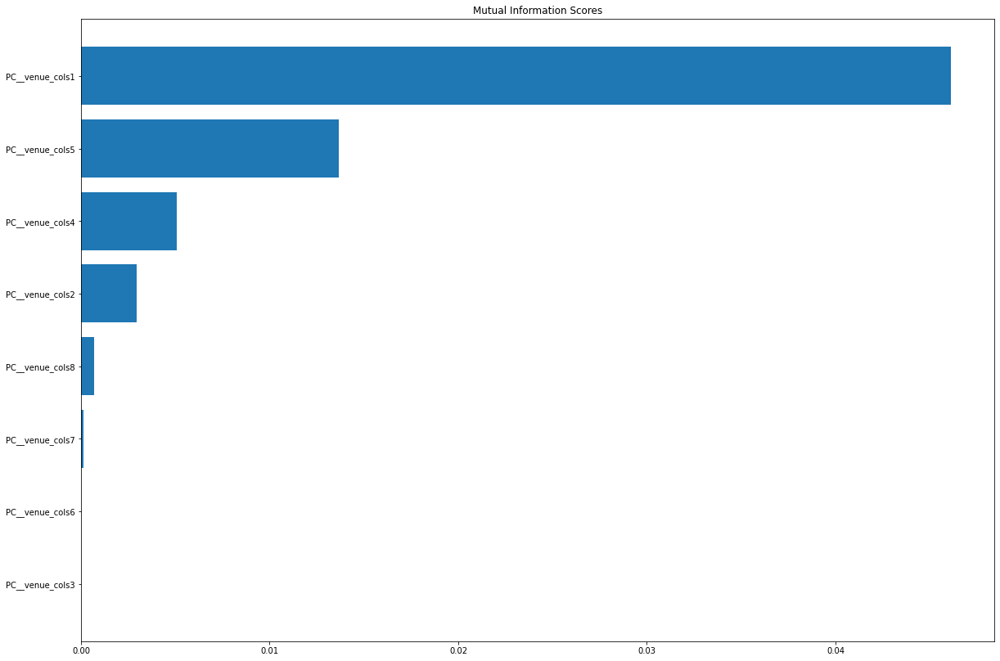


X__this_opp


,PC__this_opp1,PC__this_opp2,PC__this_opp3,PC__this_opp4,PC__this_opp5,PC__this_opp6,PC__this_opp7,PC__this_opp8
Poss_this_Opp_mean,-0.211848,0.002103,0.033949,0.972991,0.084345,0.007862,0.008698,-0.000303
GA_this_Opp_mean,0.380827,0.420215,0.253978,0.048564,0.365223,-0.366864,-0.472147,-0.347313
GF_this_Opp_mean,-0.388905,0.406090,0.254558,-0.064649,-0.359086,-0.357402,0.459786,-0.383123
Win_this_Opp_sum,-0.435350,0.215728,-0.277751,-0.136145,0.535981,0.468125,0.023712,-0.401587
Lose_this_Opp_sum,0.428000,0.232288,-0.290374,0.146794,-0.543575,0.448167,-0.067165,-0.395164
Draw_this_Opp_sum,0.021792,-0.430729,0.745384,-0.022344,-0.011267,0.376018,-0.017375,-0.340709
GA_this_Opp_sum,0.375149,0.437624,0.273613,0.040996,0.265450,0.306996,0.538680,0.369212
GF_this_Opp_sum,-0.380681,0.425404,0.278601,-0.066980,-0.277876,0.286325,-0.519661,0.403440


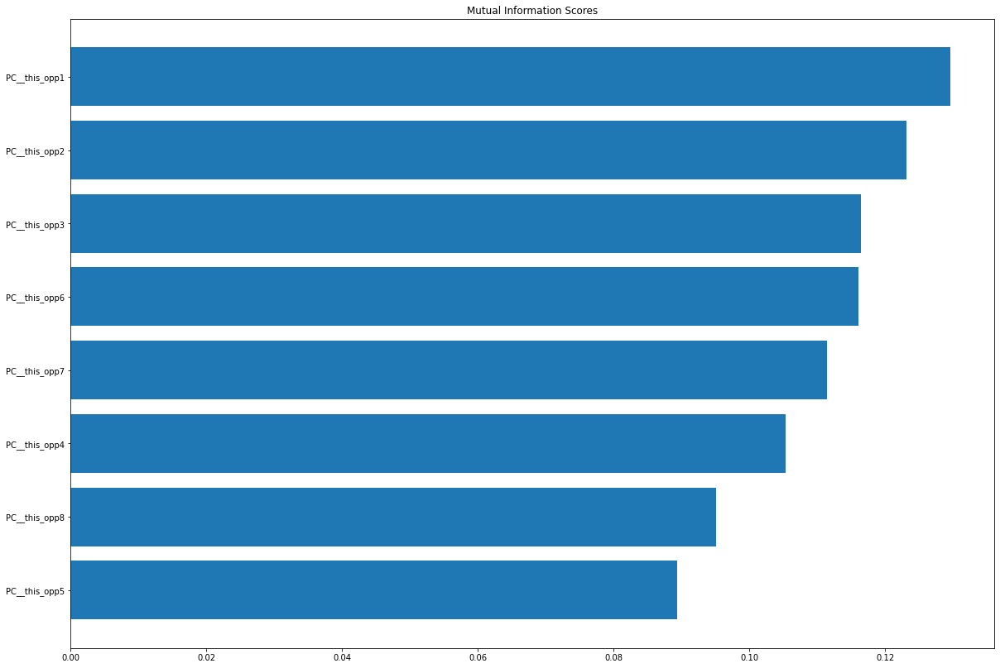


X__matchday


,PC__matchday1,PC__matchday2,PC__matchday3,PC__matchday4,PC__matchday5,PC__matchday6
Day_of_week,-0.053651,0.688747,-0.102966,0.093475,-0.709505,-0.003525
Kick_off_hr,0.042516,-0.682889,0.072770,-0.186420,-0.701271,0.005228
Kick_off_min,0.055106,-0.221902,-0.274578,0.932250,-0.056900,-0.001576
First_Match_In_Month,-0.049897,0.058070,0.951715,0.294694,-0.039150,0.000394
Rest,-0.703257,-0.061628,-0.037283,0.014984,0.004252,-0.707106
Rest_hrs,-0.703716,-0.053674,-0.039478,0.018743,0.005795,0.707078


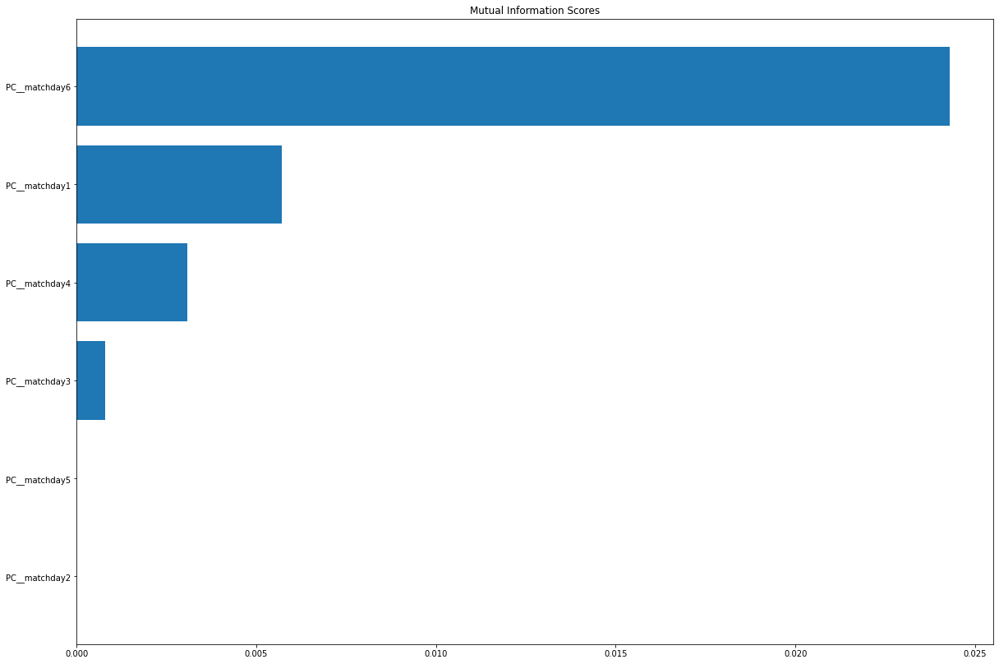


X__top4&7


,PC__top4&71,PC__top4&72,PC__top4&73,PC__top4&74
Top7_Opp,-0.462160,0.534307,0.680311,0.195195
Top7_Team,0.539830,0.456708,-0.187581,0.681773
Top4_Opp,-0.451792,0.544901,-0.679170,-0.194154
Top4_Team,0.539329,0.457184,0.201789,-0.677782


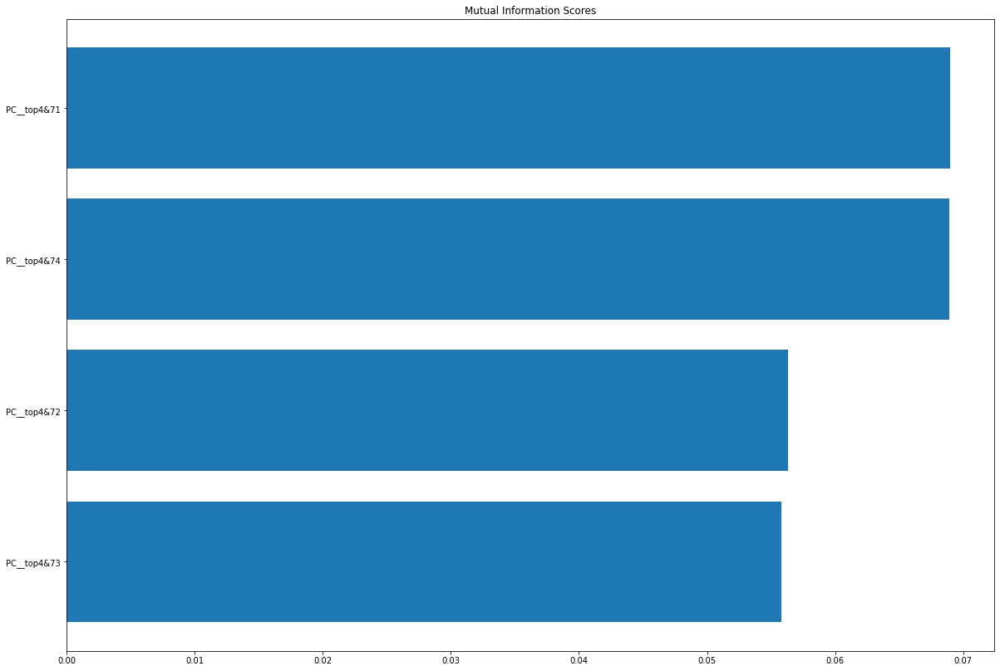


X__offense


,PC__offense1,PC__offense2,PC__offense3,PC__offense4,PC__offense5,PC__offense6,PC__offense7,PC__offense8
Standard_SoT%_last_3gm_mean,0.319010,-0.142528,0.378257,0.730557,-0.093497,0.046853,0.191560,0.391784
Standard_G/Sh_last_3gm_mean,0.363212,-0.207541,0.480791,-0.258134,0.638420,-0.000607,0.185105,-0.292175
Standard_Sh_last_3gm_mean,0.290664,0.007770,-0.698839,0.006018,0.405176,0.030926,0.389180,0.332349
Standard_SoT_last_3gm_mean,0.433567,-0.068139,-0.338900,0.401455,-0.058690,-0.061654,-0.314262,-0.652189
Standard_Gls_last_3gm_mean,0.489246,0.006030,0.034406,-0.296132,-0.023926,-0.195798,-0.650147,0.458393
Standard_PK_last_3gm_mean,0.159098,0.673329,0.115072,0.007941,-0.071158,-0.650854,0.269624,-0.081478
Standard_PKatt_last_3gm_mean,0.159638,0.674332,0.089247,0.021550,0.092432,0.700626,-0.107384,-0.020244
Passing_Ast_last_3gm_mean,0.451315,-0.154197,0.011918,-0.387595,-0.633945,0.200552,0.414608,-0.090331


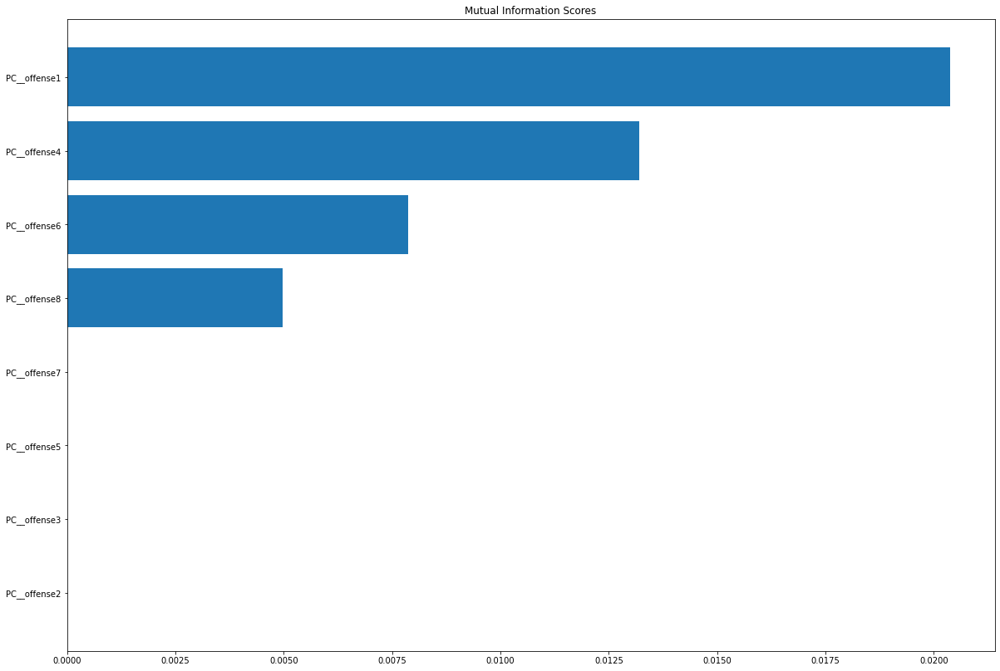


X__defense


,PC__defense1,PC__defense2,PC__defense3,PC__defense4,PC__defense5,PC__defense6
Tackles_TklW_last_3gm_mean,0.067317,0.113854,0.749387,-0.648774,0.003224,-0.002546
Def_Int_last_3gm_mean,0.144590,0.345634,0.567668,0.731093,-0.053742,0.000288
GK_Perf_SoTA_last_3gm_mean,0.576306,0.252351,-0.170435,-0.089112,0.156993,-0.736583
GK_Perf_Saves_last_3gm_mean,0.444565,0.568814,-0.266729,-0.165465,-0.210926,0.579483
GK_Perf_GA_last_3gm_mean,0.497046,-0.433574,0.091775,0.083377,0.654324,0.348488
GK_Perf_CS_last_3gm_mean,-0.444681,0.540701,-0.086936,-0.048211,0.706983,0.013954


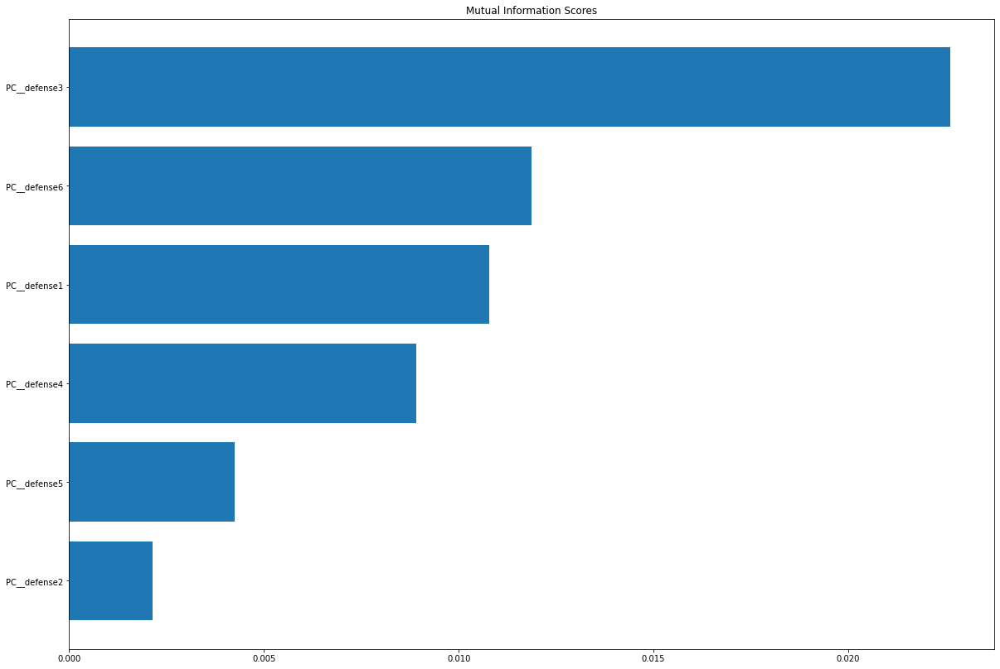


Run front test
_total
df_arrs lenghth 1
Shape :  (4064, 15)
Lose Accuracy Score :  0.640506329113924



predicted_Lose,0.0,1.0
actual,,
0,467,28
1,256,39


Lose Precision :  0.582089552238806
Lose F1_score :  0.21546961325966849
Lose ROC :  0.537818866632426
Lose Recall :  0.13220338983050847


difference in f1_score  0.21546961325966849
keeping  _total
++++++++++++++++++++++Starting split+++++++++++++++++++++++++++++++++++++++++
_total
df_arrs lenghth 1
Shape :  (4064, 15)
Lose Accuracy Score :  0.640506329113924



predicted_Lose,0.0,1.0
actual,,
0,467,28
1,256,39


Lose Precision :  0.582089552238806
Lose F1_score :  0.21546961325966849
Lose ROC :  0.537818866632426
Lose Recall :  0.13220338983050847


++++++++++++++++++++++Endinging split+++++++++++++++++++++++++++++++++++++++++
Back to front test

============================================================>>>>>>>>>>>>>>>>>>
_szn_avg
df_arrs lenghth 2
Shape :  (4064, 24)
Lose Accuracy Score :  0.6316455696202532



predicted_Lose,0.0,1.0
actual,,
0,457,38
1,253,42


Lose Precision :  0.525
Lose F1_score :  0.224
Lose ROC :  0.5328026022941277
Lose Recall :  0.1423728813559322


difference in f1_score  0.00853038674033152
keeping  _szn_avg
++++++++++++++++++++++Starting split+++++++++++++++++++++++++++++++++++++++++
_total
df_arrs lenghth 1
Shape :  (4064, 15)
Lose Accuracy Score :  0.640506329113924



predicted_Lose,0.0,1.0
actual,,
0,467,28
1,256,39


Lose Precision :  0.582089552238806
Lose F1_score :  0.21546961325966849
Lose ROC :  0.537818866632426
Lose Recall :  0.13220338983050847


_szn_avg
df_arrs lenghth 2
Shape :  (4064, 24)
Lose Accuracy Score :  0.6316455696202532



predicted_Lose,0.0,1.0
actual,,
0,457,38
1,253,42


Lose Precision :  0.525
Lose F1_score :  0.224
Lose ROC :  0.5328026022941277
Lose Recall :  0.1423728813559322


++++++++++++++++++++++Endinging split+++++++++++++++++++++++++++++++++++++++++
Back to front test

============================================================>>>>>>>>>>>>>>>>>>
_rol1-3
df_arrs lenghth 3
Shape :  (4064, 38)
Lose Accuracy Score :  0.640506329113924



predicted_Lose,0.0,1.0
actual,,
0,472,23
1,261,34


Lose Precision :  0.5964912280701754
Lose F1_score :  0.1931818181818182
Lose ROC :  0.5343947954117445
Lose Recall :  0.1152542372881356


difference in f1_score  -0.0308181818181818
discarding  _rol1-3
============================================================>>>>>>>>>>>>>>>>>>
_month_cols
df_arrs lenghth 4
Shape :  (4064, 50)
Lose Accuracy Score :  0.6354430379746835



predicted_Lose,0.0,1.0
actual,,
0,477,18
1,270,25


Lose Precision :  0.5813953488372093
Lose F1_score :  0.14792899408284024
Lose ROC :  0.524191063174114
Lose Recall :  0.0847457627118644


difference in f1_score  -0.04525282409897796
discarding  _month_cols
============================================================>>>>>>>>>>>>>>>>>>
_venue_cols
df_arrs lenghth 5
Shape :  (4064, 64)
Lose Accuracy Score :  0.6417721518987342



predicted_Lose,0.0,1.0
actual,,
0,485,10
1,273,22


Lose Precision :  0.6875
Lose F1_score :  0.1345565749235474
Lose ROC :  0.5271871254922101
Lose Recall :  0.07457627118644068


difference in f1_score  -0.013372419159292853
discarding  _venue_cols
============================================================>>>>>>>>>>>>>>>>>>
_this_opp
df_arrs lenghth 6
Shape :  (4064, 80)
Lose Accuracy Score :  0.7886075949367088



predicted_Lose,0.0,1.0
actual,,
0,468,27
1,140,155


Lose Precision :  0.8516483516483516
Lose F1_score :  0.649895178197065
Lose ROC :  0.7354391371340524
Lose Recall :  0.5254237288135594


difference in f1_score  0.5153386032735177
keeping  _this_opp
++++++++++++++++++++++Starting split+++++++++++++++++++++++++++++++++++++++++
_total
df_arrs lenghth 1
Shape :  (4064, 15)
Lose Accuracy Score :  0.640506329113924



predicted_Lose,0.0,1.0
actual,,
0,467,28
1,256,39


Lose Precision :  0.582089552238806
Lose F1_score :  0.21546961325966849
Lose ROC :  0.537818866632426
Lose Recall :  0.13220338983050847


_szn_avg
df_arrs lenghth 2
Shape :  (4064, 24)
Lose Accuracy Score :  0.6316455696202532



predicted_Lose,0.0,1.0
actual,,
0,457,38
1,253,42


Lose Precision :  0.525
Lose F1_score :  0.224
Lose ROC :  0.5328026022941277
Lose Recall :  0.1423728813559322


_this_opp
df_arrs lenghth 3
Shape :  (4064, 40)
Lose Accuracy Score :  0.769620253164557



predicted_Lose,0.0,1.0
actual,,
0,456,39
1,143,152


Lose Precision :  0.7958115183246073
Lose F1_score :  0.6255144032921811
Lose ROC :  0.7182331792501284
Lose Recall :  0.5152542372881356


++++++++++++++++++++++Endinging split+++++++++++++++++++++++++++++++++++++++++
Back to front test

============================================================>>>>>>>>>>>>>>>>>>
_matchday
df_arrs lenghth 7
Shape :  (4064, 90)
Lose Accuracy Score :  0.789873417721519



predicted_Lose,0.0,1.0
actual,,
0,470,25
1,141,154


Lose Precision :  0.8603351955307262
Lose F1_score :  0.649789029535865
Lose ROC :  0.7357644239000172
Lose Recall :  0.5220338983050847


difference in f1_score  -0.00010614866119995625
discarding  _matchday
============================================================>>>>>>>>>>>>>>>>>>
_top4&7
df_arrs lenghth 8
Shape :  (4064, 98)
Lose Accuracy Score :  0.7860759493670886



predicted_Lose,0.0,1.0
actual,,
0,471,24
1,145,150


Lose Precision :  0.8620689655172413
Lose F1_score :  0.6396588486140725
Lose ROC :  0.7299948638931689
Lose Recall :  0.5084745762711864


difference in f1_score  -0.01013018092179252
discarding  _top4&7
============================================================>>>>>>>>>>>>>>>>>>
_offense
df_arrs lenghth 9
Shape :  (4064, 111)
Lose Accuracy Score :  0.789873417721519



predicted_Lose,0.0,1.0
actual,,
0,470,25
1,141,154


Lose Precision :  0.8603351955307262
Lose F1_score :  0.649789029535865
Lose ROC :  0.7357644239000172
Lose Recall :  0.5220338983050847


difference in f1_score  0.01013018092179252
keeping  _offense
++++++++++++++++++++++Starting split+++++++++++++++++++++++++++++++++++++++++
_total
df_arrs lenghth 1
Shape :  (4064, 15)
Lose Accuracy Score :  0.640506329113924



predicted_Lose,0.0,1.0
actual,,
0,467,28
1,256,39


Lose Precision :  0.582089552238806
Lose F1_score :  0.21546961325966849
Lose ROC :  0.537818866632426
Lose Recall :  0.13220338983050847


_szn_avg
df_arrs lenghth 2
Shape :  (4064, 24)
Lose Accuracy Score :  0.6316455696202532



predicted_Lose,0.0,1.0
actual,,
0,457,38
1,253,42


Lose Precision :  0.525
Lose F1_score :  0.224
Lose ROC :  0.5328026022941277
Lose Recall :  0.1423728813559322


_this_opp
df_arrs lenghth 3
Shape :  (4064, 40)
Lose Accuracy Score :  0.769620253164557



predicted_Lose,0.0,1.0
actual,,
0,456,39
1,143,152


Lose Precision :  0.7958115183246073
Lose F1_score :  0.6255144032921811
Lose ROC :  0.7182331792501284
Lose Recall :  0.5152542372881356


_offense
df_arrs lenghth 4
Shape :  (4064, 53)
Lose Accuracy Score :  0.779746835443038



predicted_Lose,0.0,1.0
actual,,
0,465,30
1,144,151


Lose Precision :  0.8342541436464088
Lose F1_score :  0.6344537815126051
Lose ROC :  0.7256291730868003
Lose Recall :  0.511864406779661


++++++++++++++++++++++Endinging split+++++++++++++++++++++++++++++++++++++++++
Back to front test

============================================================>>>>>>>>>>>>>>>>>>
_defense
df_arrs lenghth 10
Shape :  (4064, 123)
Lose Accuracy Score :  0.7886075949367088



predicted_Lose,0.0,1.0
actual,,
0,468,27
1,140,155


Lose Precision :  0.8516483516483516
Lose F1_score :  0.649895178197065
Lose ROC :  0.7354391371340524
Lose Recall :  0.5254237288135594


difference in f1_score  0.00010614866119995625
keeping  _defense
++++++++++++++++++++++Starting split+++++++++++++++++++++++++++++++++++++++++
_total
df_arrs lenghth 1
Shape :  (4064, 15)
Lose Accuracy Score :  0.640506329113924



predicted_Lose,0.0,1.0
actual,,
0,467,28
1,256,39


Lose Precision :  0.582089552238806
Lose F1_score :  0.21546961325966849
Lose ROC :  0.537818866632426
Lose Recall :  0.13220338983050847


_szn_avg
df_arrs lenghth 2
Shape :  (4064, 24)
Lose Accuracy Score :  0.6316455696202532



predicted_Lose,0.0,1.0
actual,,
0,457,38
1,253,42


Lose Precision :  0.525
Lose F1_score :  0.224
Lose ROC :  0.5328026022941277
Lose Recall :  0.1423728813559322


_this_opp
df_arrs lenghth 3
Shape :  (4064, 40)
Lose Accuracy Score :  0.769620253164557



predicted_Lose,0.0,1.0
actual,,
0,456,39
1,143,152


Lose Precision :  0.7958115183246073
Lose F1_score :  0.6255144032921811
Lose ROC :  0.7182331792501284
Lose Recall :  0.5152542372881356


_offense
df_arrs lenghth 4
Shape :  (4064, 53)
Lose Accuracy Score :  0.779746835443038



predicted_Lose,0.0,1.0
actual,,
0,465,30
1,144,151


Lose Precision :  0.8342541436464088
Lose F1_score :  0.6344537815126051
Lose ROC :  0.7256291730868003
Lose Recall :  0.511864406779661


_defense
df_arrs lenghth 5
Shape :  (4064, 65)
Lose Accuracy Score :  0.779746835443038



predicted_Lose,0.0,1.0
actual,,
0,465,30
1,144,151


Lose Precision :  0.8342541436464088
Lose F1_score :  0.6344537815126051
Lose ROC :  0.7256291730868003
Lose Recall :  0.511864406779661


++++++++++++++++++++++Endinging split+++++++++++++++++++++++++++++++++++++++++
Back to front test

============================================================>>>>>>>>>>>>>>>>>>


['_total', '_szn_avg', '_this_opp', '_offense', '_defense']

B1 >>>>>>>>>>>>>>>>>a ,rf and all predictors
train_matrix.shape :  (1000, 60)
train_matrix.shape :  (1750, 60)
train_matrix.shape :  (2500, 60)
train_matrix.shape :  (3250, 60)
train_matrix.shape :  (4000, 60)
Precision_score :Lose  0.85553772070626


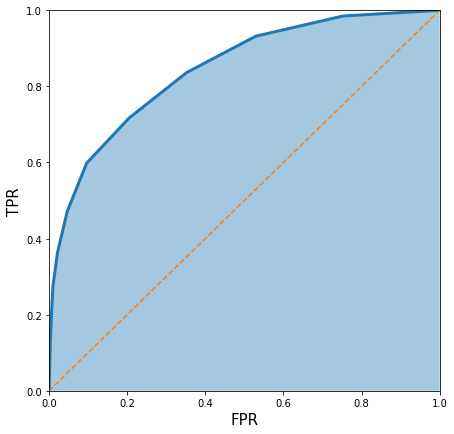

Lose ROC :  0.8505797512606273
================================================....................

B2 >>>>>>>>>>>>>>>>>a,rf2 and all predictors
train_matrix.shape :  (1000, 60)
train_matrix.shape :  (1750, 60)
train_matrix.shape :  (2500, 60)
train_matrix.shape :  (3250, 60)
train_matrix.shape :  (4000, 60)
Precision_score :Lose  0.8573667711598746


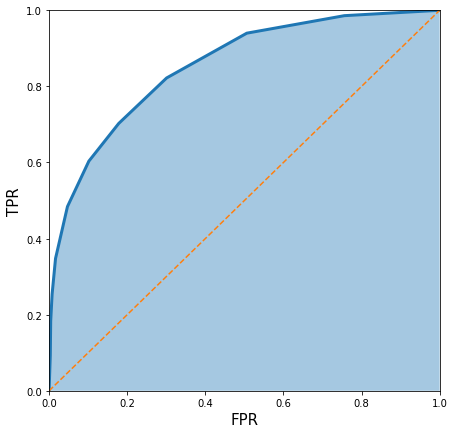

Lose ROC :  0.8549262841925122
================================================....................

B3 >>>>>>>>>>>>>>>>>a ,rf and topKall predictors
train_matrix.shape :  (1000, 54)
train_matrix.shape :  (1750, 54)
train_matrix.shape :  (2500, 54)
train_matrix.shape :  (3250, 54)
train_matrix.shape :  (4000, 54)
Precision_score :Lose  0.8539325842696629


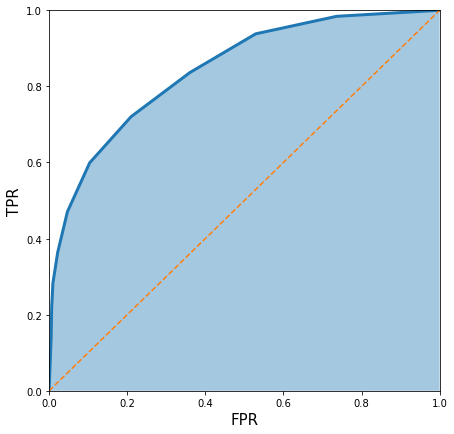

Lose ROC :  0.8487146635429346
================================================....................

B4 >>>>>>>>>>>>>>>>>a ,rf2 and topKall predictors
train_matrix.shape :  (1000, 54)
train_matrix.shape :  (1750, 54)
train_matrix.shape :  (2500, 54)
train_matrix.shape :  (3250, 54)
train_matrix.shape :  (4000, 54)
Precision_score :Lose  0.85423197492163


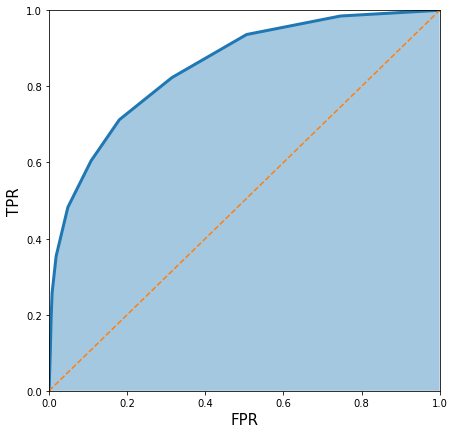

Lose ROC :  0.8535864959595868
================================================....................

B5 >>>>>>>>>>>>>>>>>a_df ,rf and all predictors + cats
train_matrix.shape :  (1000, 103)
train_matrix.shape :  (1750, 105)
train_matrix.shape :  (2500, 105)
train_matrix.shape :  (3250, 105)
train_matrix.shape :  (4000, 105)
Precision_score :Lose  0.8573667711598746


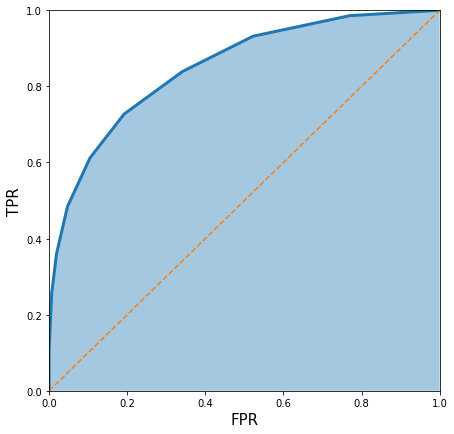

Lose ROC :  0.8541882109617374
================================================....................

B6 >>>>>>>>>>>>>>>>>a_df ,rf2 and all predictors + cats
train_matrix.shape :  (1000, 103)
train_matrix.shape :  (1750, 105)
train_matrix.shape :  (2500, 105)
train_matrix.shape :  (3250, 105)
train_matrix.shape :  (4000, 105)
Precision_score :Lose  0.8531684698608965


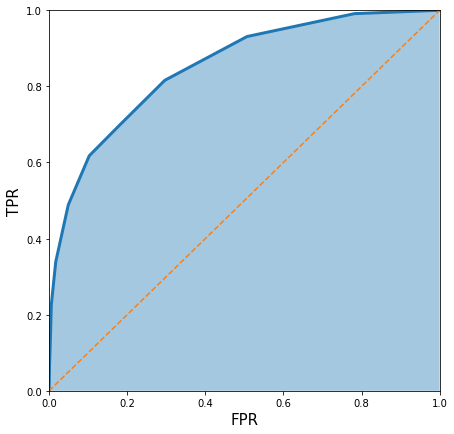

Lose ROC :  0.8562912392126
================================================....................

B7 >>>>>>>>>>>>>>>>>a_df ,rf and topkall predictors + cats
train_matrix.shape :  (1000, 97)
train_matrix.shape :  (1750, 99)
train_matrix.shape :  (2500, 99)
train_matrix.shape :  (3250, 99)
train_matrix.shape :  (4000, 99)
Precision_score :Lose  0.8507692307692307


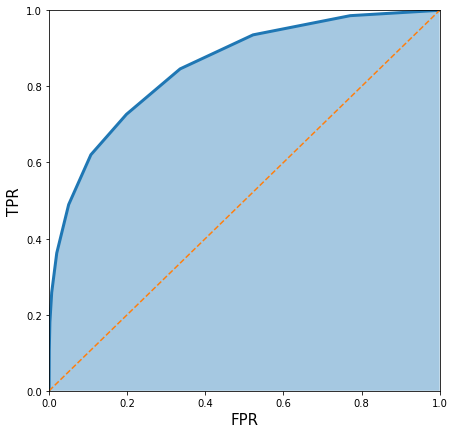

Lose ROC :  0.8551601065241464
================================================....................

B8 >>>>>>>>>>>>>>>>>a_df ,rf2 and topkall predictors + cats
train_matrix.shape :  (1000, 97)
train_matrix.shape :  (1750, 99)
train_matrix.shape :  (2500, 99)
train_matrix.shape :  (3250, 99)
train_matrix.shape :  (4000, 99)
Precision_score :Lose  0.8516228748068007


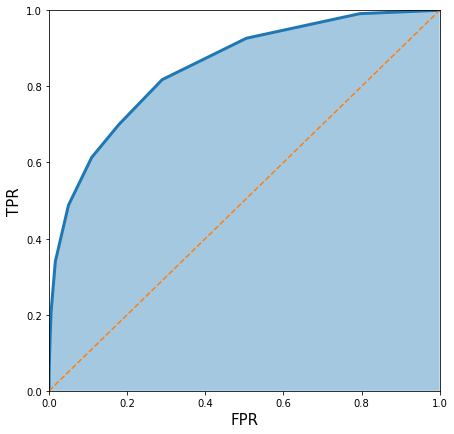

Lose ROC :  0.8565410767724282
================================================....................



In [77]:
preds_df_Lose , a__df_Lose = PCA_ish(df=df4,target='Lose')

In [107]:
a__df_Lose.to_csv("C:\\Users\\user\\Solo Dolo\\EPL Analysis\\predictions data\\Lose_data.csv",header=True,index=False)

In [92]:
preds_df_Lose[0].head()

,Team,Opponent,Result,Target,Predictions,Probs,Season
1000,Cardiff City,Brighton,W,0,0.0,0.116386,2019
1001,Cardiff City,Everton,L,1,1.0,0.915573,2019
1002,Cardiff City,Wolves,W,0,0.0,0.091492,2019
1003,Cardiff City,West Ham,L,1,1.0,0.813001,2019
1004,Cardiff City,Southampton,W,0,0.0,0.096596,2019


In [93]:
a__df_Lose.head()

,Total_Points,Total_GF,Total_GA,Total_Win,Total_Draw,Total_Loss,PC__total2,PC__total4,PC__total5,PC__total1,Points_Avg_for_szn,GF_Avg_for_szn,GA_Avg_for_szn,Win_Avg_for_szn,Draw_Avg_for_szn,Loss_Avg_for_szn,PC__szn_avg1,PC__szn_avg2,PC__szn_avg4,Poss_this_Opp_mean,GA_this_Opp_mean,GF_this_Opp_mean,Win_this_Opp_sum,Lose_this_Opp_sum,Draw_this_Opp_sum,GA_this_Opp_sum,GF_this_Opp_sum,PC__this_opp1,PC__this_opp2,PC__this_opp3,PC__this_opp6,PC__this_opp7,PC__this_opp4,PC__this_opp8,PC__this_opp5,Standard_SoT%_last_3gm_mean,Standard_G/Sh_last_3gm_mean,Standard_Sh_last_3gm_mean,Standard_SoT_last_3gm_mean,Standard_Gls_last_3gm_mean,Standard_PK_last_3gm_mean,Standard_PKatt_last_3gm_mean,Passing_Ast_last_3gm_mean,PC__offense1,PC__offense4,PC__offense6,PC__offense8,PC__offense7,Tackles_TklW_last_3gm_mean,Def_Int_last_3gm_mean,GK_Perf_SoTA_last_3gm_mean,GK_Perf_Saves_last_3gm_mean,GK_Perf_GA_last_3gm_mean,GK_Perf_CS_last_3gm_mean,PC__defense3,PC__defense6,PC__defense1,PC__defense4,PC__defense5,PC__defense2,Lose,Season,Team,Opponent,Result,Comp,Venue,prev_opp,prev_comp
0,4.0,5.0,9.0,1.0,1.0,2.0,-0.506981,-0.121968,0.039219,-3.048307,1.000000,1.250000,2.250000,0.250000,0.250000,0.500000,2.588832,-0.391447,-0.494009,58.000000,0.0,3.0,1.0,0.0,0.0,0.0,3.0,-2.567994,0.293938,-0.459467,-0.130758,0.067911,0.088019,-0.003806,-0.343009,24.600000,0.050000,18.000000,5.666667,1.333333,0.000000,0.000000,1.333333,0.060680,-0.329571,-0.022069,-0.234602,0.097643,10.666667,16.333333,5.666667,3.000000,2.666667,0.000000,0.656455,-0.096063,2.273157,0.754539,0.485590,-0.608256,0,2018,Arsenal,Bournemouth,W,Premier League,Home,Liverpool,Premier League
1,7.0,8.0,9.0,2.0,1.0,2.0,-0.608959,-0.103243,0.029019,-2.899726,1.400000,1.600000,1.800000,0.400000,0.200000,0.400000,0.817647,-0.592692,-0.279980,72.000000,1.0,3.0,1.0,0.0,0.0,1.0,3.0,-2.226141,0.953340,-0.017619,-0.198342,0.082939,1.250688,-0.019796,0.239940,29.900000,0.060000,14.666667,5.333333,1.000000,0.000000,0.000000,1.000000,-0.459626,0.257453,-0.028342,-0.365606,0.012204,11.333333,15.666667,5.000000,3.333333,1.666667,0.333333,0.555037,-0.053437,0.958344,0.293384,0.345125,0.637336,0,2018,Arsenal,Europa,W,Europa,Home,Bournemouth,Premier League
2,10.0,11.0,10.0,3.0,1.0,2.0,-0.684015,-0.121324,0.041221,-2.729148,1.666667,1.833333,1.666667,0.500000,0.166667,0.333333,-0.194452,-0.814329,-0.331715,50.833333,1.0,1.0,0.0,0.0,1.0,1.0,1.0,0.129591,-1.603723,1.280358,-0.131707,0.002351,-0.001676,0.029730,-0.000601,32.233333,0.123333,13.666667,5.333333,2.000000,0.000000,0.000000,1.333333,0.705251,-0.360164,-0.164514,-0.144204,-0.440341,10.000000,15.000000,5.000000,3.333333,1.666667,0.333333,0.058177,-0.052074,0.899976,0.544129,0.351232,0.523783,0,2018,Arsenal,Chelsea,D,Premier League,Away,Europa,Europa
3,14.0,12.0,10.0,4.0,2.0,2.0,-0.711739,-0.031766,0.081189,-2.493522,1.750000,1.500000,1.250000,0.500000,0.250000,0.250000,-0.559713,0.333909,-0.452445,69.000000,0.0,2.0,1.0,0.0,0.0,0.0,2.0,-2.191463,-0.312142,-0.818875,-0.048395,0.083828,1.043580,0.009639,0.200677,30.533333,0.076667,18.000000,5.666667,1.333333,0.000000,0.000000,0.666667,-0.014862,0.391366,-0.183715,-0.024622,-0.098330,5.000000,9.000000,3.333333,3.000000,0.333333,0.666667,-2.245260,0.001047,-1.590398,0.861502,-0.005685,0.800694,0,2018,Arsenal,West Brom,W,Premier League,Home,EFL Cup,EFL Cup
4,17.0,14.0,10.0,5.0,2.0,2.0,-0.803564,-0.000544,0.096915,-2.361210,1.888889,1.555556,1.111111,0.555556,0.222222,0.222222,-1.110528,0.155456,-0.468705,62.000000,2.0,4.0,1.0,0.0,0.0,2.0,4.0,-2.039709,2.216627,0.748204,-0.356495,0.072972,0.442266,-0.048915,0.191170,27.033333,0.036667,17.666667,5.000000,1.000000,0.333333,0.333333,0.333333,-0.448838,0.470269,-0.235553,-0.065404,0.168632,5.666667,11.000000,2.333333,2.000000,0.000000,1.000000,-1.594907,-0.141280,-3.010713,1.108743,0.600640,1.171878,0,2018,Arsenal,Europa,W,Europa,Away,West Brom,Premier League


In [88]:
def merge_probs(df,alias='Lose'):
    df=df.copy()
    probs_arr = []
    for idx ,probs_df in enumerate(df):
        #print(f'Probs {idx}')
        probs = probs_df.loc[:,'Probs']
        #display(probs.head())
        probs_arr.append(probs)
        all_probs = pd.concat(probs_arr,axis=1)
    rename_cols = [ alias+f'_p{i+1}' for i in range(len(probs_arr))]
    all_probs.columns = rename_cols
    return all_probs
Win_probs = merge_probs(df=preds_df,alias='Win')
Lose_probs = merge_probs(df=preds_df_Lose,alias='Lose')
Draw_probs = merge_probs(df=preds_df_Draw,alias='Draw')   
base_ish = preds_df[0].loc[:,['Team','Opponent','Result','Season']]
All_Probs = pd.concat([base_ish,Win_probs,Lose_probs,Draw_probs],axis=1)
All_Probs.head()

,Team,Opponent,Result,Season,Win_p1,Win_p2,Win_p3,Win_p4,Win_p5,Win_p6,Win_p7,Win_p8,Lose_p1,Lose_p2,Lose_p3,Lose_p4,Lose_p5,Lose_p6,Lose_p7,Lose_p8,Draw_p1,Draw_p2,Draw_p3,Draw_p4,Draw_p5,Draw_p6,Draw_p7,Draw_p8
1000,Cardiff City,Brighton,W,2019,0.799095,0.670389,0.759173,0.736025,0.730971,0.717456,0.765054,0.710793,0.116386,0.087573,0.086228,0.069821,0.130983,0.097853,0.102432,0.092946,0.078335,0.083393,0.058514,0.062027,0.088271,0.098452,0.077570,0.086562
1001,Cardiff City,Everton,L,2019,0.025695,0.051892,0.037517,0.049244,0.020827,0.055643,0.061895,0.061746,0.915573,0.832355,0.922212,0.863051,0.917961,0.836748,0.904072,0.854537,0.090125,0.099973,0.038901,0.082094,0.058669,0.115021,0.073613,0.098932
1002,Cardiff City,Wolves,W,2019,0.799912,0.684858,0.780391,0.700803,0.765769,0.705525,0.826955,0.712171,0.091492,0.120586,0.144543,0.101338,0.182688,0.110774,0.103196,0.114000,0.106814,0.091498,0.127900,0.070248,0.129950,0.104341,0.097143,0.082102
1003,Cardiff City,West Ham,L,2019,0.074541,0.063685,0.065787,0.064898,0.066737,0.070636,0.069982,0.060197,0.813001,0.827718,0.843123,0.814025,0.815487,0.831127,0.797249,0.838307,0.080972,0.055055,0.103174,0.051023,0.056356,0.060160,0.066930,0.052114
1004,Cardiff City,Southampton,W,2019,0.686976,0.559005,0.644704,0.570888,0.648832,0.558509,0.708552,0.584590,0.096596,0.138122,0.133673,0.134798,0.139522,0.134892,0.112923,0.121794,0.278530,0.228738,0.281523,0.191479,0.273408,0.233259,0.253448,0.228645


In [96]:
All_Probs[All_Probs.Season ==2022]

,Team,Opponent,Result,Season,Win_p1,Win_p2,Win_p3,Win_p4,Win_p5,Win_p6,Win_p7,Win_p8,Lose_p1,Lose_p2,Lose_p3,Lose_p4,Lose_p5,Lose_p6,Lose_p7,Lose_p8,Draw_p1,Draw_p2,Draw_p3,Draw_p4,Draw_p5,Draw_p6,Draw_p7,Draw_p8
3274,Arsenal,Norwich City,W,2022,0.820408,0.904601,0.886327,0.923161,0.883435,0.906936,0.885636,0.882758,0.055198,0.050970,0.020644,0.035645,0.054818,0.056479,0.058398,0.064655,0.068871,0.039625,0.026150,0.039626,0.042061,0.048598,0.033000,0.044889
3275,Arsenal,Burnley,W,2022,0.929270,0.919165,0.951640,0.933975,0.949476,0.915255,0.906585,0.906557,0.008333,0.020268,0.006500,0.015931,0.013104,0.037611,0.025698,0.035300,0.033199,0.035088,0.019197,0.048053,0.060031,0.053752,0.047745,0.039665
3276,Arsenal,Tottenham,W,2022,0.855724,0.891069,0.886008,0.910840,0.863501,0.902424,0.882008,0.875577,0.028611,0.026534,0.028036,0.036278,0.025915,0.034688,0.035935,0.049466,0.076177,0.048795,0.098866,0.040665,0.059300,0.054031,0.040452,0.049091
3277,Arsenal,Brighton,D,2022,0.027982,0.040020,0.044014,0.040305,0.068860,0.080524,0.029649,0.052419,0.031579,0.064038,0.020287,0.052556,0.029044,0.064018,0.042385,0.079013,0.985854,0.941570,0.980722,0.934737,0.962752,0.922379,0.958903,0.900257
3278,Arsenal,Crystal Palace,D,2022,0.084608,0.055661,0.078799,0.071669,0.064960,0.077438,0.055815,0.082243,0.020579,0.045490,0.020417,0.046809,0.012889,0.067498,0.057386,0.069434,0.951412,0.896558,0.980972,0.914406,0.933777,0.870409,0.961232,0.889403
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4059,Wolverhampton Wanderers,Brighton,L,2022,0.534208,0.546154,0.540811,0.521750,0.565665,0.541753,0.564508,0.538025,0.386249,0.293116,0.379098,0.287905,0.360175,0.258505,0.313848,0.247447,0.424017,0.260496,0.414518,0.240313,0.336164,0.245869,0.357806,0.245160
4060,Wolverhampton Wanderers,Chelsea,D,2022,0.359772,0.226670,0.366133,0.248186,0.286671,0.235412,0.280866,0.234494,0.451351,0.325110,0.443584,0.324574,0.406645,0.333017,0.396680,0.360566,0.365987,0.364709,0.381652,0.327934,0.346232,0.356936,0.301146,0.380178
4061,Wolverhampton Wanderers,Manchester City,L,2022,0.336719,0.214791,0.331063,0.198532,0.270968,0.220424,0.317435,0.228025,0.731259,0.670882,0.684380,0.712783,0.690880,0.663773,0.655021,0.636308,0.216854,0.125268,0.193479,0.148837,0.179267,0.157744,0.186799,0.132645
4062,Wolverhampton Wanderers,Norwich City,D,2022,0.382997,0.358162,0.422910,0.357362,0.361701,0.331183,0.412650,0.370059,0.438574,0.418620,0.441605,0.407695,0.465648,0.358938,0.432983,0.406784,0.286138,0.239180,0.321332,0.245749,0.343648,0.265514,0.291671,0.258597


In [97]:
All_Probs.shape

(3064, 28)

<AxesSubplot:xlabel='Win_p1', ylabel='Draw_p1'>

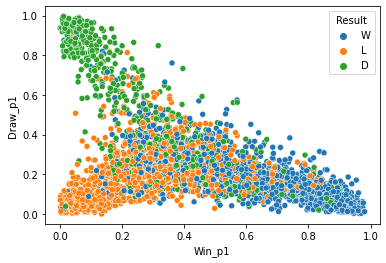

In [101]:
sns.scatterplot(All_Probs.Win_p1,All_Probs.Draw_p1,hue = All_Probs.Result)

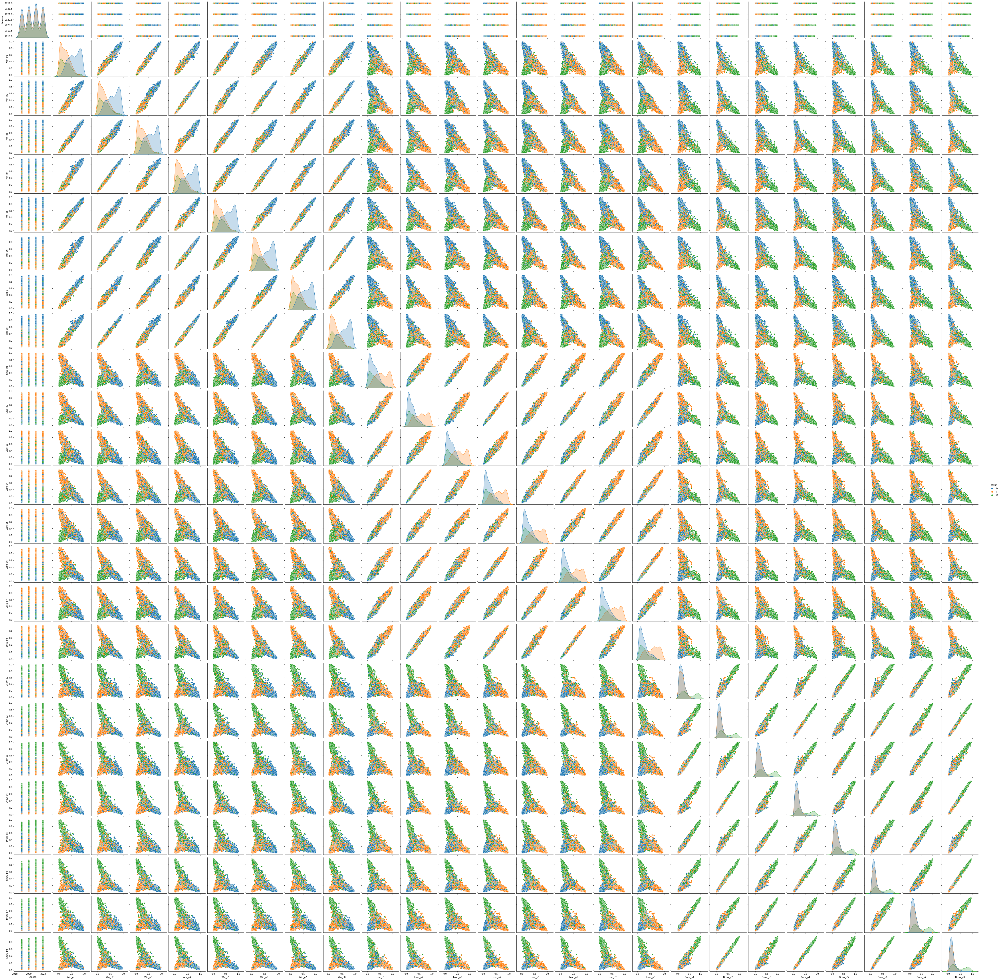

In [104]:
sns.pairplot(data=All_Probs,hue='Result')

In [98]:
All_Probs.to_csv("C:\\Users\\user\\Solo Dolo\\EPL Analysis\\All_Probs.csv",header=True,index=False)

In [294]:
targets = ['Win','Draw','Lose','Points']
rf = RandomForestClassifier(n_estimators=200, min_samples_split=10, random_state=1)

In [365]:
rf2 = RandomForestClassifier( **{'n_estimators': 200,
  'max_depth': 15.0,
  'min_samples_split': 15,
  'min_samples_leaf': 15,
  'max_features': 'sqrt'})

X__total


,PC__total1,PC__total2,PC__total3,PC__total4,PC__total5,PC__total6
Total_Points,0.469766,-0.302114,0.068232,0.259357,0.297685,7.262981e-01
Total_GF,0.467809,-0.291923,0.105089,-0.359373,-0.745482,-3.330669e-16
Total_GA,0.391082,0.478648,0.176401,-0.654365,0.398296,-1.110223e-16
Total_Win,0.449306,-0.354543,0.193090,0.258178,0.323546,-6.810302e-01
Total_Draw,0.377617,0.236333,-0.879083,0.134565,-0.044373,-9.321476e-02
Total_Loss,0.251117,0.642534,0.378303,0.539099,-0.300581,2.428613e-17




X__szn_avg


,PC__szn_avg1,PC__szn_avg2,PC__szn_avg3,PC__szn_avg4,PC__szn_avg5,PC__szn_avg6
Points_Avg_for_szn,-0.477798,-0.018255,0.038529,-0.341363,7.918347e-01,-1.623591e-01
GF_Avg_for_szn,-0.428843,-0.071757,0.599725,0.671770,-1.110223e-16,-1.249001e-16
GA_Avg_for_szn,0.396016,-0.205354,0.769858,-0.456421,2.775558e-17,-4.510281e-17
Win_Avg_for_szn,-0.469206,-0.180787,0.002685,-0.321239,-5.464115e-01,-5.877022e-01
Draw_Avg_for_szn,0.120597,0.896302,0.182734,0.009591,9.655751e-03,-3.853847e-01
Loss_Avg_for_szn,0.443030,-0.341036,-0.112986,0.347261,2.726519e-01,-6.926213e-01




X__rol1-3


,PC__rol1-31,PC__rol1-32,PC__rol1-33,PC__rol1-34,PC__rol1-35,PC__rol1-36,PC__rol1-37,PC__rol1-38,PC__rol1-39
Points_last_1gm_sum,0.335712,-0.043182,0.071965,0.311060,-0.063373,0.877955,0.093136,-2.816382e-15,2.264188e-15
Points_last_3gm_mean,0.461567,-0.036809,0.041178,0.116397,0.042821,-0.185421,-0.324345,7.912080e-01,5.415888e-02
Win_last_3gm_mean,0.441036,-0.242749,0.033143,0.131400,-0.029597,-0.200921,-0.292890,-4.959805e-01,5.959608e-01
Draw_last_3gm_mean,-0.065759,0.809264,0.018162,-0.094751,0.267024,0.118400,-0.019748,6.052587e-02,4.920230e-01
Lose_last_3gm_mean,-0.404050,-0.397772,-0.048897,-0.060088,-0.183554,0.113122,0.319202,3.526044e-01,6.323061e-01
GF_last_3gm_mean,0.361364,-0.181274,-0.031409,-0.196288,0.655606,-0.091204,0.599085,5.551115e-17,2.792905e-16
GA_last_3gm_mean,-0.342529,-0.297185,-0.060285,-0.101480,0.626261,0.262410,-0.565120,-1.665335e-16,-1.491862e-16
Poss_last_3gm_mean,0.248617,-0.031169,-0.149567,-0.882302,-0.257211,0.224615,-0.140647,2.775558e-17,-2.029626e-16
Played_Opp_X_times,-0.049399,-0.050715,0.980977,-0.180429,0.010019,0.001063,-0.004038,7.632783e-17,8.370041e-17




X__month_cols


,PC__month_cols1,PC__month_cols2,PC__month_cols3,PC__month_cols4,PC__month_cols5,PC__month_cols6,PC__month_cols7
GF_this_month_sum,0.432234,0.428614,0.341914,-0.099954,-0.032125,-0.378552,0.598526
GA_this_month_sum,-0.168492,0.706922,-0.107632,0.066222,0.090634,-0.382433,-0.549028
GF_this_month_mean,0.455851,0.216689,0.419690,-0.198194,-0.183832,0.579120,-0.400813
GA_this_month_mean,-0.345977,0.518172,-0.267174,0.109607,-0.032813,0.591104,0.421808
GF_mean_prev_month_,0.402165,0.001895,-0.416297,0.523750,-0.621066,-0.059353,-0.037381
GA_mean_prev_month_,-0.312703,-0.032056,0.646776,0.692857,-0.052421,0.007990,-0.002752
Poss_this_month_mean,0.444707,0.008007,-0.179907,0.424222,0.753268,0.148571,-0.018869




X__venue_cols


,PC__venue_cols1,PC__venue_cols2,PC__venue_cols3,PC__venue_cols4,PC__venue_cols5,PC__venue_cols6,PC__venue_cols7,PC__venue_cols8
Poss_this_Venue_mean,0.439366,-0.067735,0.213358,0.326229,-0.805879,0.030854,-0.004226,-0.003436
GF_this_Venue_mean,0.450881,-0.092845,0.357758,0.238217,0.421191,-0.624336,0.079300,-0.172808
GA_this_Venue_mean,-0.393192,0.132939,0.571463,0.526573,0.153215,0.386053,0.190972,-0.122053
Win_this_Venue_sum,0.437049,0.312359,0.047572,-0.299210,0.123194,0.438903,-0.030689,-0.640996
Lose_this_Venue_sum,-0.268059,0.466426,0.175143,-0.355535,-0.300335,-0.396225,0.537661,-0.131287
Draw_this_Venue_sum,0.042236,0.425938,-0.647001,0.581183,0.047520,-0.088303,0.173282,-0.142575
GF_this_Venue_sum,0.416222,0.373416,0.104690,-0.072946,0.198905,0.250572,0.269022,0.704498
GA_this_Venue_sum,-0.105699,0.577178,0.193417,0.022863,-0.049830,-0.200006,-0.751534,0.102331




X__this_opp


,PC__this_opp1,PC__this_opp2,PC__this_opp3,PC__this_opp4,PC__this_opp5,PC__this_opp6,PC__this_opp7,PC__this_opp8
Poss_this_Opp_mean,-0.211848,0.002103,0.033949,0.972991,0.084345,0.007862,0.008698,-0.000303
GA_this_Opp_mean,0.380827,0.420215,0.253978,0.048564,0.365223,-0.366864,-0.472147,-0.347313
GF_this_Opp_mean,-0.388905,0.406090,0.254558,-0.064649,-0.359086,-0.357402,0.459786,-0.383123
Win_this_Opp_sum,-0.435350,0.215728,-0.277751,-0.136145,0.535981,0.468125,0.023712,-0.401587
Lose_this_Opp_sum,0.428000,0.232288,-0.290374,0.146794,-0.543575,0.448167,-0.067165,-0.395164
Draw_this_Opp_sum,0.021792,-0.430729,0.745384,-0.022344,-0.011267,0.376018,-0.017375,-0.340709
GA_this_Opp_sum,0.375149,0.437624,0.273613,0.040996,0.265450,0.306996,0.538680,0.369212
GF_this_Opp_sum,-0.380681,0.425404,0.278601,-0.066980,-0.277876,0.286325,-0.519661,0.403440




X__matchday


,PC__matchday1,PC__matchday2,PC__matchday3,PC__matchday4,PC__matchday5,PC__matchday6
Day_of_week,-0.053651,0.688747,-0.102966,0.093475,-0.709505,-0.003525
Kick_off_hr,0.042516,-0.682889,0.072770,-0.186420,-0.701271,0.005228
Kick_off_min,0.055106,-0.221902,-0.274578,0.932250,-0.056900,-0.001576
First_Match_In_Month,-0.049897,0.058070,0.951715,0.294694,-0.039150,0.000394
Rest,-0.703257,-0.061628,-0.037283,0.014984,0.004252,-0.707106
Rest_hrs,-0.703716,-0.053674,-0.039478,0.018743,0.005795,0.707078




X__top4&7


,PC__top4&71,PC__top4&72,PC__top4&73,PC__top4&74
Top7_Opp,-0.462160,0.534307,0.680311,0.195195
Top7_Team,0.539830,0.456708,-0.187581,0.681773
Top4_Opp,-0.451792,0.544901,-0.679170,-0.194154
Top4_Team,0.539329,0.457184,0.201789,-0.677782




X__top4&7_cum


,PC__top4&7_cum1,PC__top4&7_cum2,PC__top4&7_cum3,PC__top4&7_cum4,PC__top4&7_cum5,PC__top4&7_cum6,PC__top4&7_cum7,PC__top4&7_cum8,PC__top4&7_cum9,PC__top4&7_cum10,PC__top4&7_cum11,PC__top4&7_cum12
Poss_this_7_Opp_mean,0.316387,-0.061629,-0.252369,0.105706,0.609781,0.141253,-0.101230,0.000758,0.647409,-0.008068,-5.135617e-16,3.227550e-17
GF_this_7_Opp_mean,0.316975,-0.132063,-0.149558,0.414927,-0.251846,0.141281,-0.537884,-0.271114,-0.165162,0.462674,-9.372972e-16,1.652396e-16
GA_this_7_Opp_mean,-0.292951,-0.172930,0.416511,0.461916,0.060351,-0.068453,0.059429,-0.604999,0.178043,-0.296385,-2.779911e-16,-2.835693e-16
Win_this_7_Opp_mean,0.338286,-0.070649,-0.290275,-0.042897,-0.181735,0.205523,0.280403,-0.259004,-0.111887,-0.334691,-1.182929e-02,-6.699392e-01
Lose_this_7_Opp_mean,-0.318516,-0.219774,0.359282,-0.059220,0.126663,0.087725,-0.222960,0.280435,0.114727,0.312964,-1.190146e-02,-6.740266e-01
Draw_this_7_Opp_mean,-0.038434,0.629032,-0.153502,0.220938,0.117066,-0.633388,-0.120912,-0.049893,-0.007632,0.042725,-5.486776e-03,-3.107377e-01
Poss_this_4_Opp_mean,0.313347,-0.087043,0.271610,0.093375,0.626917,-0.033928,0.094427,0.015617,-0.639031,0.006960,7.275982e-16,1.140755e-16
GF_this_4_Opp_mean,0.316222,-0.128732,0.219016,0.407585,-0.242225,-0.147680,-0.173167,0.575132,0.078783,-0.471047,1.208593e-15,-1.604634e-16
GA_this_4_Opp_mean,-0.283042,-0.177211,-0.373523,0.567890,0.034444,0.033295,0.527848,0.264770,-0.071049,0.265322,-4.436069e-16,9.663764e-17
Win_this_4_Opp_mean,0.337365,-0.094876,0.262698,-0.070514,-0.150851,-0.271182,0.334284,-0.057473,0.197542,0.316104,-6.728824e-01,1.188126e-02




X__offense


,PC__offense1,PC__offense2,PC__offense3,PC__offense4,PC__offense5,PC__offense6,PC__offense7,PC__offense8
Standard_SoT%_last_3gm_mean,0.319010,-0.142528,0.378257,0.730557,-0.093497,0.046853,0.191560,0.391784
Standard_G/Sh_last_3gm_mean,0.363212,-0.207541,0.480791,-0.258134,0.638420,-0.000607,0.185105,-0.292175
Standard_Sh_last_3gm_mean,0.290664,0.007770,-0.698839,0.006018,0.405176,0.030926,0.389180,0.332349
Standard_SoT_last_3gm_mean,0.433567,-0.068139,-0.338900,0.401455,-0.058690,-0.061654,-0.314262,-0.652189
Standard_Gls_last_3gm_mean,0.489246,0.006030,0.034406,-0.296132,-0.023926,-0.195798,-0.650147,0.458393
Standard_PK_last_3gm_mean,0.159098,0.673329,0.115072,0.007941,-0.071158,-0.650854,0.269624,-0.081478
Standard_PKatt_last_3gm_mean,0.159638,0.674332,0.089247,0.021550,0.092432,0.700626,-0.107384,-0.020244
Passing_Ast_last_3gm_mean,0.451315,-0.154197,0.011918,-0.387595,-0.633945,0.200552,0.414608,-0.090331




X__defense


,PC__defense1,PC__defense2,PC__defense3,PC__defense4,PC__defense5,PC__defense6
Tackles_TklW_last_3gm_mean,0.067317,0.113854,0.749387,-0.648774,0.003224,-0.002546
Def_Int_last_3gm_mean,0.144590,0.345634,0.567668,0.731093,-0.053742,0.000288
GK_Perf_SoTA_last_3gm_mean,0.576306,0.252351,-0.170435,-0.089112,0.156993,-0.736583
GK_Perf_Saves_last_3gm_mean,0.444565,0.568814,-0.266729,-0.165465,-0.210926,0.579483
GK_Perf_GA_last_3gm_mean,0.497046,-0.433574,0.091775,0.083377,0.654324,0.348488
GK_Perf_CS_last_3gm_mean,-0.444681,0.540701,-0.086936,-0.048211,0.706983,0.013954




X__misc_mean


,PC__misc_mean1,PC__misc_mean2,PC__misc_mean3,PC__misc_mean4,PC__misc_mean5,PC__misc_mean6,PC__misc_mean7,PC__misc_mean8,PC__misc_mean9,PC__misc_mean10
Misc_Stats_Off_last_3gm_mean,-0.081939,-0.043076,0.551527,-0.303547,0.431899,0.388952,0.412534,-0.281668,-0.088095,-0.002320
Misc_Stats_Fls_last_3gm_mean,0.327813,-0.465130,-0.180111,-0.154825,0.250076,-0.015765,-0.255445,-0.003382,-0.701016,0.017555
Misc_Stats_Fld_last_3gm_mean,0.157578,-0.198538,-0.496866,0.163443,-0.012137,0.212942,0.755448,0.213898,0.011315,-0.009386
Misc_Stats_Crs_last_3gm_mean,-0.167111,0.354586,-0.116386,-0.498974,0.361253,-0.328691,0.098242,0.570733,-0.073934,0.066533
Misc_Stats_Int_last_3gm_mean,0.072494,-0.321053,0.548198,0.114121,-0.307369,0.114044,0.006119,0.684852,-0.036481,0.015909
Misc_Stats_TklW_last_3gm_mean,0.101534,-0.390655,0.159482,-0.294472,-0.222463,-0.702694,0.307747,-0.249878,0.156422,0.006864
Misc_Stats_CrdY_last_3gm_mean,0.428129,-0.278403,-0.101703,-0.206267,0.342522,0.169934,-0.265014,0.101727,0.673077,0.080594
Misc_Stats_CrdR_last_3gm_mean,0.546154,0.390269,0.126001,0.011685,-0.156823,-0.014724,0.100359,-0.068623,-0.112989,0.693567
Misc_Stats_2CrdY_last_3gm_mean,0.569267,0.361190,0.105752,-0.093674,-0.109385,-0.016974,0.059168,0.006669,-0.057983,-0.711588
Misc_Stats_OG_last_3gm_mean,0.108903,0.026242,0.198991,0.676021,0.567829,-0.398645,0.075223,0.050988,0.016170,-0.031340




X__cum_advs


,PC__cum_advs1,PC__cum_advs2,PC__cum_advs3,PC__cum_advs4,PC__cum_advs5,PC__cum_advs6,PC__cum_advs7,PC__cum_advs8,PC__cum_advs9,PC__cum_advs10,PC__cum_advs11,PC__cum_advs12,PC__cum_advs13,PC__cum_advs14,PC__cum_advs15,PC__cum_advs16,PC__cum_advs17,PC__cum_advs18,PC__cum_advs19,PC__cum_advs20,PC__cum_advs21,PC__cum_advs22,PC__cum_advs23,PC__cum_advs24,PC__cum_advs25,PC__cum_advs26,PC__cum_advs27,PC__cum_advs28,PC__cum_advs29,PC__cum_advs30,PC__cum_advs31,PC__cum_advs32,PC__cum_advs33,PC__cum_advs34,PC__cum_advs35,PC__cum_advs36,PC__cum_advs37,PC__cum_advs38,PC__cum_advs39,PC__cum_advs40,PC__cum_advs41,PC__cum_advs42,PC__cum_advs43,PC__cum_advs44,PC__cum_advs45,PC__cum_advs46,PC__cum_advs47,PC__cum_advs48
Standard_SoT%_Total_sum,-0.181571,0.022760,-0.012456,0.026909,0.049904,-0.005867,-0.002643,0.036516,0.022685,0.018750,0.001972,-0.007188,-0.020067,0.000185,-0.014548,0.029213,-0.022684,0.010087,-0.012505,0.010317,0.048410,0.026910,0.010584,-0.002884,0.024879,0.017687,-0.061901,-0.039235,0.169373,-0.028591,-0.077987,-0.282162,-0.086056,0.183130,-0.083338,0.371766,-0.202132,-0.001254,-0.072060,0.170762,0.424871,-0.307318,-0.544809,-0.026868,-0.000000e+00,0.000000e+00,0.000000e+00,-0.000000e+00
Standard_G/Sh_Total_sum,-0.181606,0.022205,-0.013995,0.032660,0.045977,-0.009216,0.001038,0.027399,0.016270,0.009568,0.003501,-0.001548,-0.014562,-0.005553,-0.016496,0.024380,-0.030284,0.001911,-0.003009,0.020485,0.082200,0.033721,0.019335,-0.035867,0.066765,0.071113,0.017394,0.138162,0.182230,-0.076430,-0.316378,-0.259790,0.327503,0.208460,0.133148,-0.148150,-0.201683,-0.176037,0.280962,0.480222,-0.095700,0.337071,0.139819,-0.021336,1.669673e-16,-2.468443e-15,-5.131838e-16,-8.298035e-16
Standard_Sh_Total_sum,-0.181567,0.021943,-0.014157,0.031653,0.048176,-0.008191,0.003546,0.028557,0.023967,0.013688,-0.003871,-0.012265,-0.033538,-0.013235,-0.029828,0.028091,-0.020913,0.000276,-0.002846,-0.015015,0.054154,0.036827,0.005055,-0.089288,0.024300,0.100336,0.231911,0.068436,0.039860,0.099890,0.225668,0.233711,-0.229471,-0.247631,-0.079813,0.125428,0.035404,0.092205,0.116548,0.159633,-0.236579,0.516793,-0.488899,-0.109836,1.012633e-14,-1.657949e-14,2.805826e-14,6.394227e-15
Standard_SoT_Total_sum,-0.181521,0.023151,-0.014324,0.029220,0.048220,-0.007965,0.003625,0.036581,0.024166,0.017769,-0.002645,-0.012049,-0.031838,-0.011196,-0.025162,0.026236,-0.025117,0.005758,0.001001,-0.010208,0.076758,0.074458,0.005454,-0.074734,0.040184,0.082311,0.265069,0.042360,0.075650,0.024429,0.039184,-0.028804,-0.316262,-0.061302,-0.069088,0.563885,-0.109731,0.128941,0.044099,0.098178,0.027515,-0.028439,0.613620,0.079930,2.184433e-15,1.462305e-14,-1.361704e-14,-6.026499e-15
Standard_Gls_Total_sum,-0.181462,0.023933,-0.014868,0.030541,0.047969,-0.007123,0.004711,0.039409,0.027691,0.014576,-0.005555,-0.013472,-0.030106,-0.013049,-0.022626,0.021199,-0.032092,0.010089,0.006286,0.006506,0.082239,0.097355,0.041672,-0.054312,0.086328,0.155787,0.382447,0.154088,-0.014584,0.024204,-0.250484,-0.065648,0.040064,0.038611,-0.007840,-0.084030,0.177902,0.026196,-0.061035,-0.039691,-0.561310,-0.525707,-0.155526,0.054638,-1.809406e-15,-9.811256e-15,-2.457236e-15,1.388416e-15
Standard_PK_Total_sum,-0.180522,0.035461,-0.000216,-0.006447,0.060538,0.013087,-0.003971,0.088960,0.040741,0.058022,-0.002636,-0.032543,-0.002738,0.011449,0.003892,0.051396,-0.029222,0.116405,0.006356,0.069727,0.152296,0.312902,0.040886,0.338129,0.184443,-0.212006,-0.072898,-0.228439,-0.283874,0.096188,-0.208580,-0.024764,0.097116,-0.234918,0.376911,0.124183,0.355269,0.141792,-0.111123,0.139095,0.112858,0.075564,-0.007952,0.001219,7.429999e-15,-2.894369e-15,3.733512e-15,-1.001461e-15
Standard_PKatt_Total_sum,-0.180884,0.031790,-0.005663,0.002590,0.059348,0.009581,-0.002792,0.073530,0.041911,0.046034,-0.006048,-0.022525,-0.006088,0.015243,0.000800,0.063078,-0.008881,0.099435,-0.009032,0.003454,0.138738,0.265251,-0.028451,0.292763,0.260857,-0.166755,-0.062037,-0.124086,-0.252256,0.056537,0.034801,0.263633,-0.194629,



_total
df_arrs lenghth 1
Shape :  (4064, 16)
Win Accuracy Score :  0.610126582278481



predicted_Win,0.0,1.0
actual,,
0,413,65
1,243,69


Win Precision :  0.5149253731343284
Win F1_score :  0.3094170403587444
Win ROC :  0.5425852912777599
Win Recall :  0.22115384615384615


difference in f1_score  0.3094170403587444
keeping  _total
============================================================>>>>>>>>>>>>>>>>>>
_szn_avg
df_arrs lenghth 2
Shape :  (4064, 26)
Win Accuracy Score :  0.6189873417721519



predicted_Win,0.0,1.0
actual,,
0,429,49
1,252,60


Win Precision :  0.5504587155963303
Win F1_score :  0.2850356294536817
Win ROC :  0.5448986160283231
Win Recall :  0.19230769230769232


difference in f1_score  -0.024381410905062684
discarding  _szn_avg
============================================================>>>>>>>>>>>>>>>>>>
_rol1-3
df_arrs lenghth 3
Shape :  (4064, 40)
Win Accuracy Score :  0.640506329113924



predicted_Win,0.0,1.0
actual,,
0,441,37
1,247,65


Win Precision :  0.6372549019607843
Win F1_score :  0.3140096618357488
Win ROC :  0.5654637377963737
Win Recall :  0.20833333333333334


difference in f1_score  0.028974032382067083
discarding  _rol1-3
============================================================>>>>>>>>>>>>>>>>>>
_month_cols
df_arrs lenghth 4
Shape :  (4064, 51)
Win Accuracy Score :  0.669620253164557



predicted_Win,0.0,1.0
actual,,
0,436,42
1,219,93


Win Precision :  0.6888888888888889
Win F1_score :  0.4161073825503355
Win ROC :  0.6051054071451561
Win Recall :  0.2980769230769231


difference in f1_score  0.10209772071458673
keeping  _month_cols
============================================================>>>>>>>>>>>>>>>>>>
_venue_cols
df_arrs lenghth 5
Shape :  (4064, 61)
Win Accuracy Score :  0.6645569620253164



predicted_Win,0.0,1.0
actual,,
0,438,40
1,225,87


Win Precision :  0.6850393700787402
Win F1_score :  0.39635535307517084
Win ROC :  0.5975820727389765
Win Recall :  0.27884615384615385


difference in f1_score  -0.01975202947516469
discarding  _venue_cols
============================================================>>>>>>>>>>>>>>>>>>
_this_opp
df_arrs lenghth 6
Shape :  (4064, 77)
Win Accuracy Score :  0.7848101265822784



predicted_Win,0.0,1.0
actual,,
0,444,34
1,136,176


Win Precision :  0.8380952380952381
Win F1_score :  0.6743295019157088
Win ROC :  0.7464864284947967
Win Recall :  0.5641025641025641


difference in f1_score  0.277974148840538
keeping  _this_opp
============================================================>>>>>>>>>>>>>>>>>>
_matchday
df_arrs lenghth 7
Shape :  (4064, 86)
Win Accuracy Score :  0.7873417721518987



predicted_Win,0.0,1.0
actual,,
0,446,32
1,136,176


Win Precision :  0.8461538461538461
Win F1_score :  0.676923076923077
Win ROC :  0.7485784787040017
Win Recall :  0.5641025641025641


difference in f1_score  0.0025935750073681207
discarding  _matchday
============================================================>>>>>>>>>>>>>>>>>>
_top4&7
df_arrs lenghth 8
Shape :  (4064, 94)
Win Accuracy Score :  0.7810126582278482



predicted_Win,0.0,1.0
actual,,
0,446,32
1,141,171


Win Precision :  0.8423645320197044
Win F1_score :  0.6640776699029127
Win ROC :  0.7405656581911813
Win Recall :  0.5480769230769231


difference in f1_score  -0.012845407020164235
discarding  _top4&7
============================================================>>>>>>>>>>>>>>>>>>
_top4&7_cum
df_arrs lenghth 9
Shape :  (4064, 118)
Win Accuracy Score :  0.7835443037974683



predicted_Win,0.0,1.0
actual,,
0,448,30
1,141,171


Win Precision :  0.8507462686567164
Win F1_score :  0.6666666666666667
Win ROC :  0.7426577084003863
Win Recall :  0.5480769230769231


difference in f1_score  0.0025889967637540146
discarding  _top4&7_cum
============================================================>>>>>>>>>>>>>>>>>>
_offense
df_arrs lenghth 10
Shape :  (4064, 127)
Win Accuracy Score :  0.779746835443038



predicted_Win,0.0,1.0
actual,,
0,446,32
1,142,170


Win Precision :  0.8415841584158416
Win F1_score :  0.6614785992217899
Win ROC :  0.738963094088617
Win Recall :  0.5448717948717948


difference in f1_score  -0.005188067444876876
discarding  _offense
============================================================>>>>>>>>>>>>>>>>>>
_defense
df_arrs lenghth 11
Shape :  (4064, 138)
Win Accuracy Score :  0.7810126582278482



predicted_Win,0.0,1.0
actual,,
0,444,34
1,139,173


Win Precision :  0.8357487922705314
Win F1_score :  0.6666666666666667
Win ROC :  0.7416787361871044
Win Recall :  0.5544871794871795


difference in f1_score  0.005188067444876876
discarding  _defense
============================================================>>>>>>>>>>>>>>>>>>
_misc_mean
df_arrs lenghth 12
Shape :  (4064, 150)
Win Accuracy Score :  0.7784810126582279



predicted_Win,0.0,1.0
actual,,
0,447,31
1,144,168


Win Precision :  0.8442211055276382
Win F1_score :  0.6575342465753424
Win ROC :  0.7368039909880914
Win Recall :  0.5384615384615384


difference in f1_score  -0.009132420091324311
discarding  _misc_mean
============================================================>>>>>>>>>>>>>>>>>>
_cum_advs
df_arrs lenghth 13
Shape :  (4064, 225)
Win Accuracy Score :  0.7531645569620253



predicted_Win,0.0,1.0
actual,,
0,453,25
1,170,142


Win Precision :  0.8502994011976048
Win F1_score :  0.592901878914405
Win ROC :  0.7014134749490398
Win Recall :  0.4551282051282051


difference in f1_score  -0.06463236766093738
discarding  _cum_advs
============================================================>>>>>>>>>>>>>>>>>>


['_total', '_month_cols', '_this_opp']

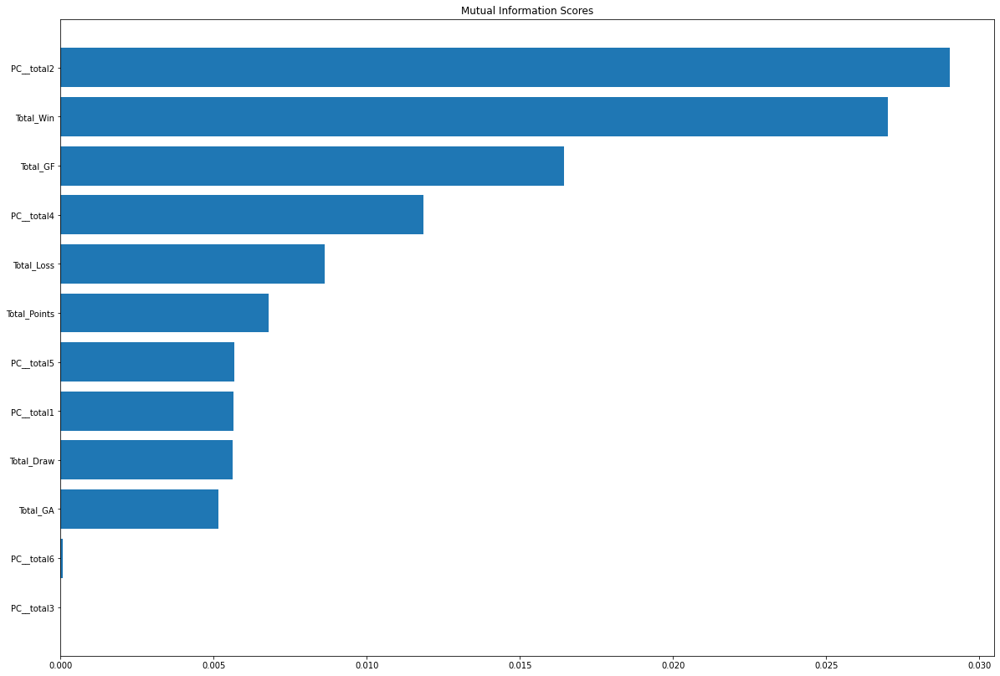

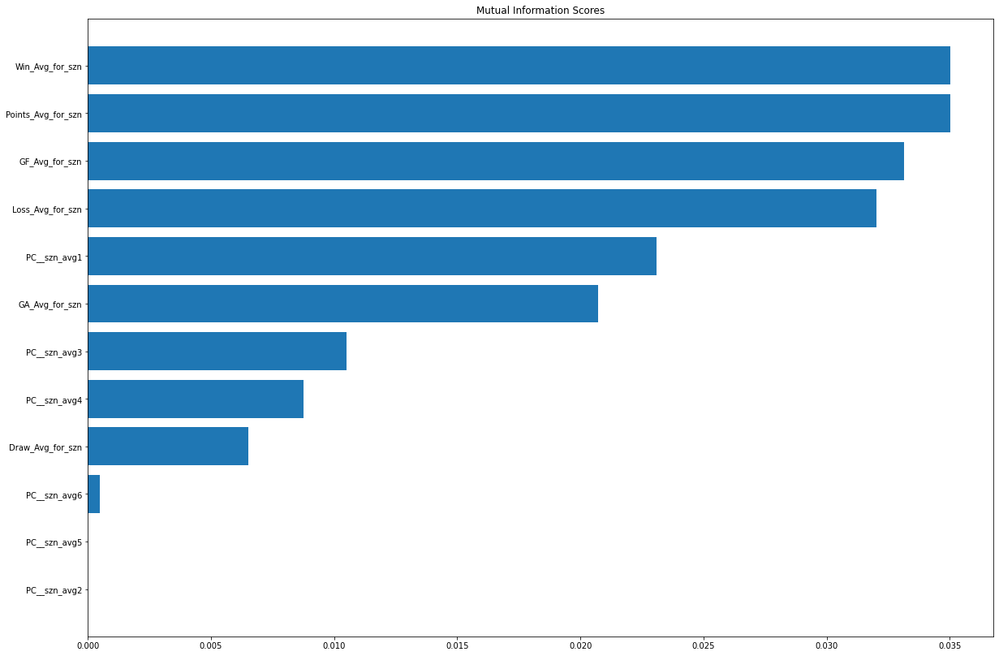

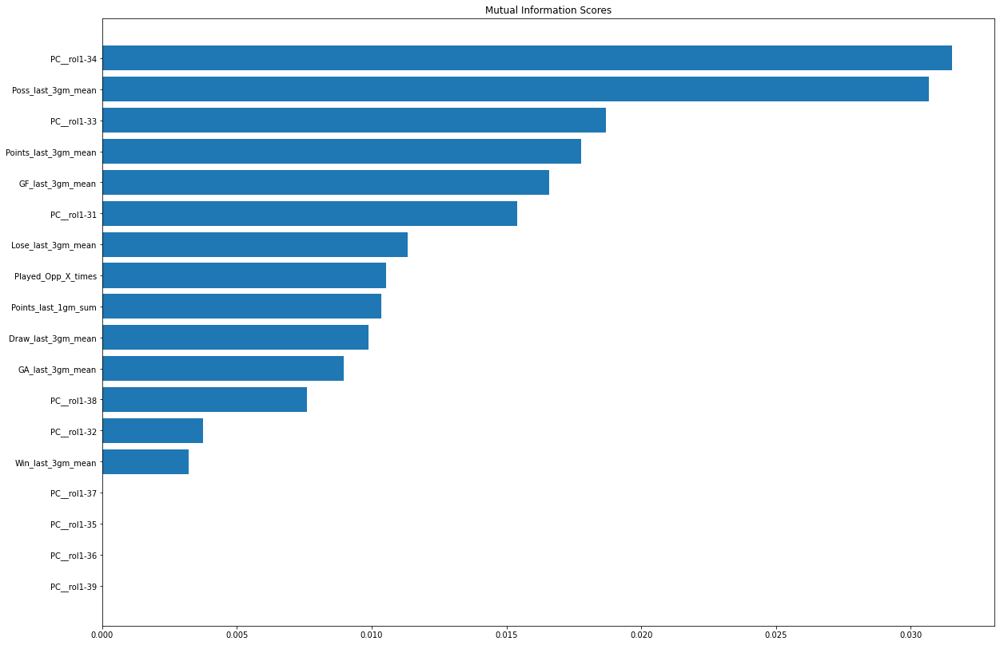

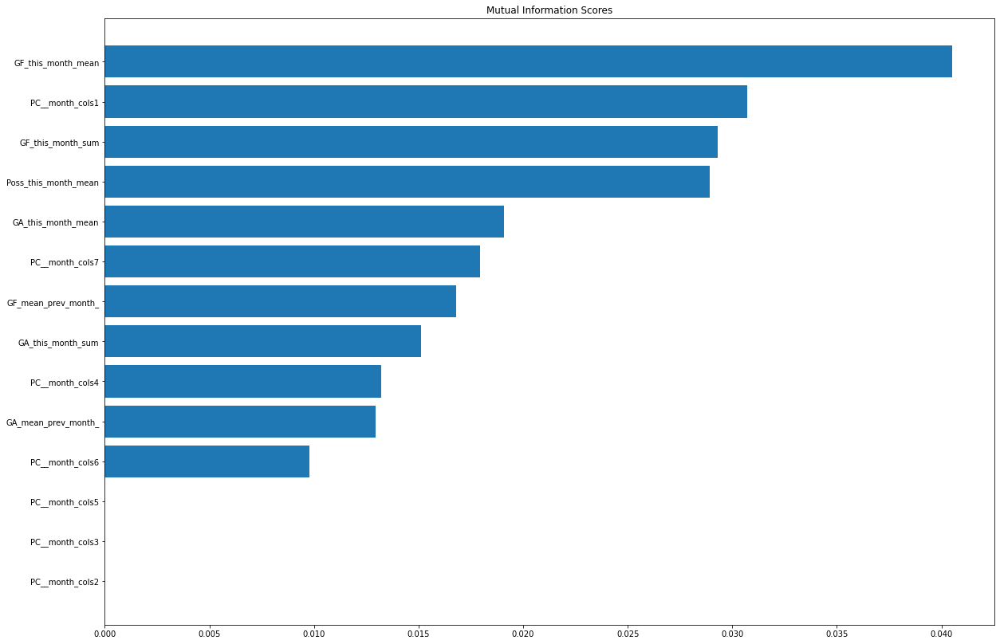

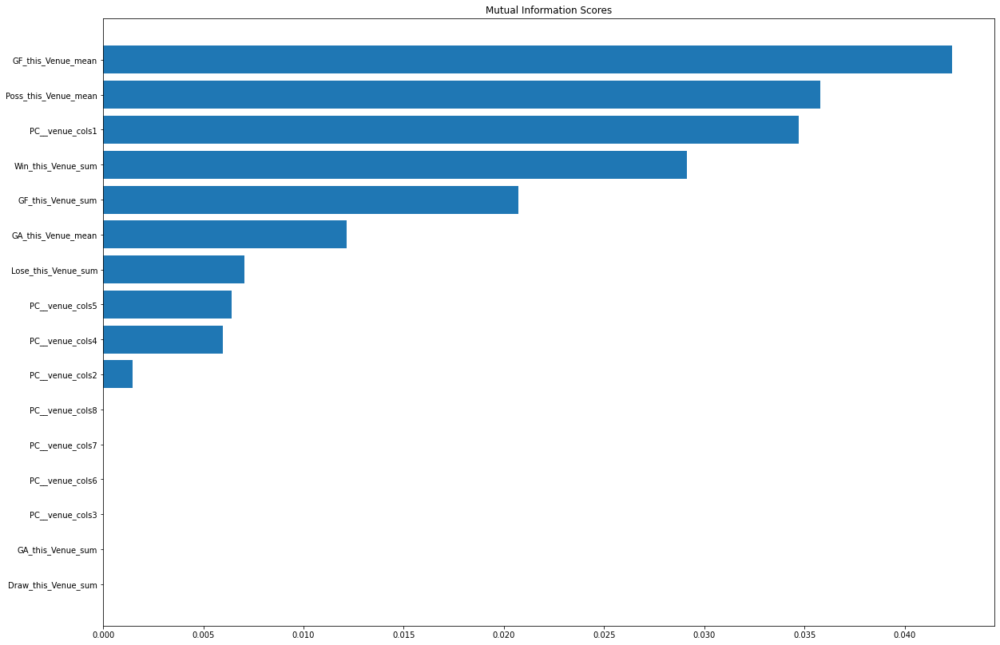

...

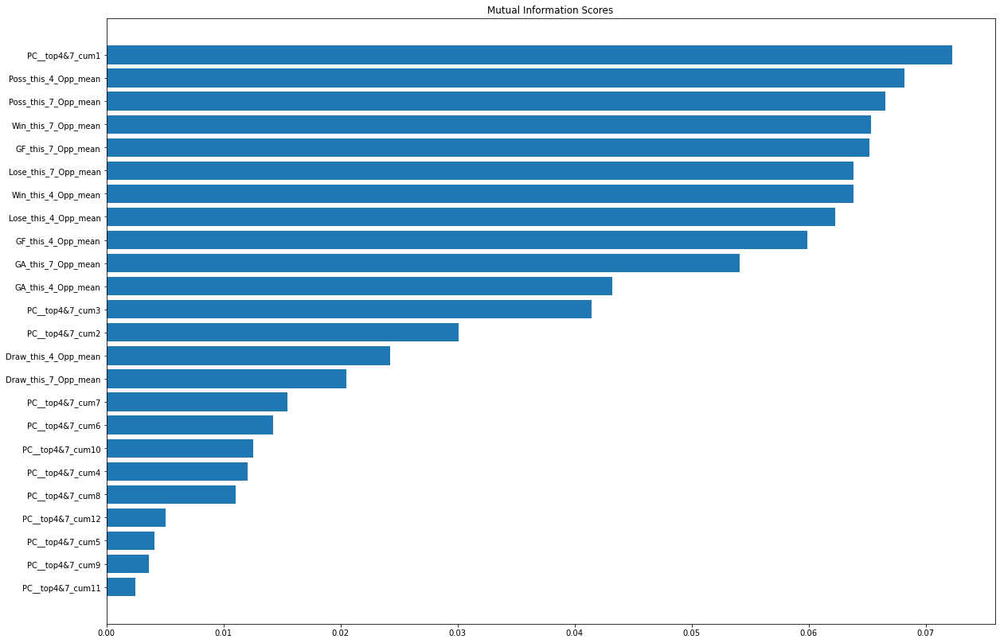

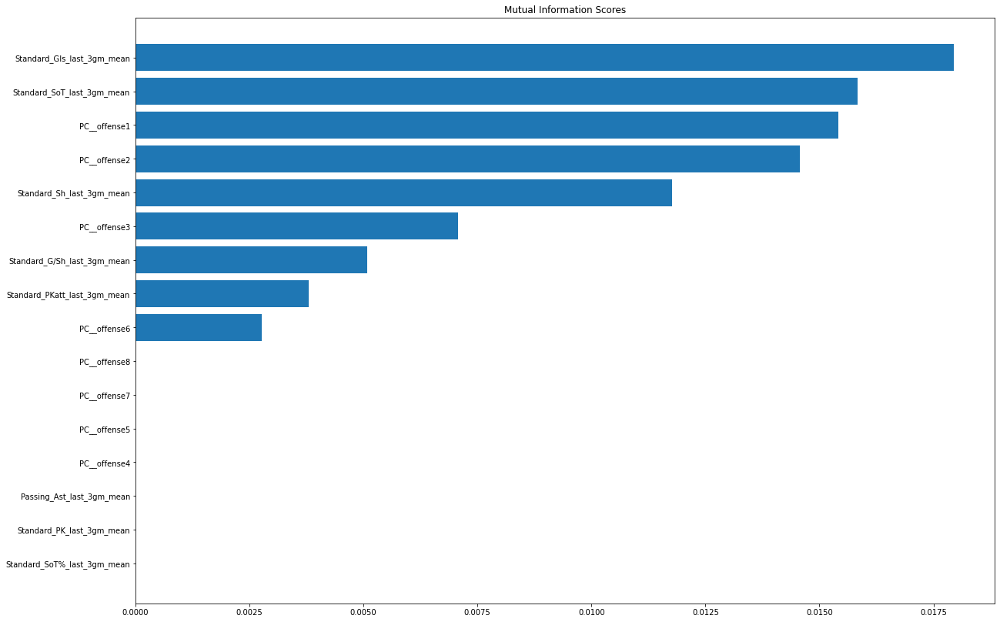

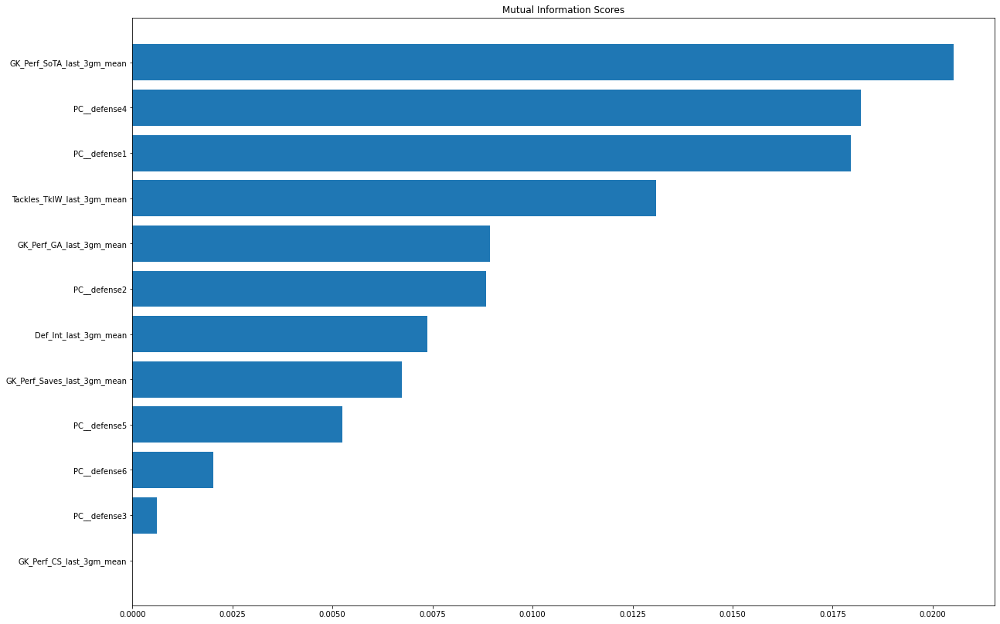

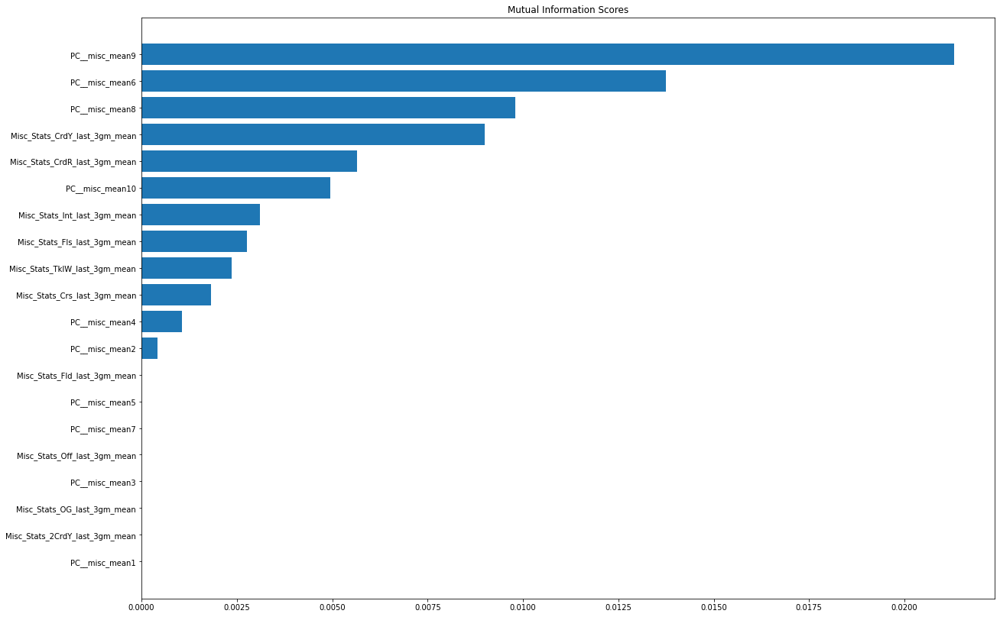

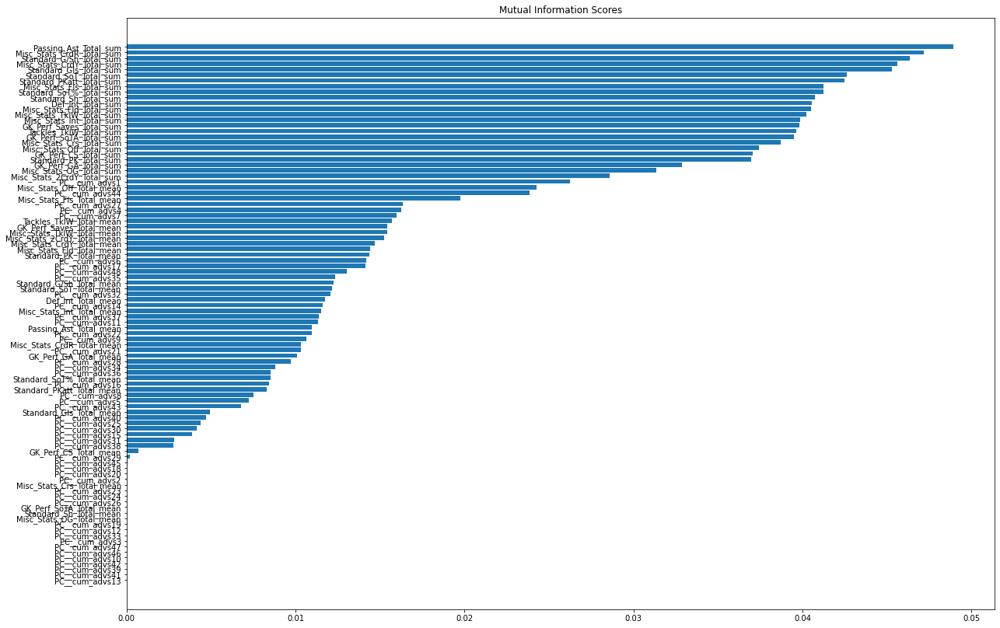

In [300]:
p_dict , p,a =PCA_ish(df=df4,target='Win')

In [301]:
a.head()

,PC__total2,Total_Win,Total_GF,PC__total4,Total_Loss,Total_Points,PC__total5,PC__total1,Total_Draw,Total_GA,PC__total6,Win_Avg_for_szn,Points_Avg_for_szn,GF_Avg_for_szn,Loss_Avg_for_szn,PC__szn_avg1,GA_Avg_for_szn,PC__szn_avg3,PC__szn_avg4,Draw_Avg_for_szn,PC__szn_avg6,PC__rol1-34,Poss_last_3gm_mean,PC__rol1-33,Points_last_3gm_mean,GF_last_3gm_mean,PC__rol1-31,Lose_last_3gm_mean,Played_Opp_X_times,Points_last_1gm_sum,Draw_last_3gm_mean,GA_last_3gm_mean,PC__rol1-38,PC__rol1-32,Win_last_3gm_mean,GF_this_month_mean,PC__month_cols1,GF_this_month_sum,Poss_this_month_mean,GA_this_month_mean,PC__month_cols7,GF_mean_prev_month_,GA_this_month_sum,PC__month_cols4,GA_mean_prev_month_,PC__month_cols6,GF_this_Venue_mean,Poss_this_Venue_mean,PC__venue_cols1,Win_this_Venue_sum,GF_this_Venue_sum,GA_this_Venue_mean,Lose_this_Venue_sum,PC__venue_cols5,PC__venue_cols4,PC__venue_cols2,Win_this_Opp_sum,PC__this_opp6,PC__this_opp1,PC__this_opp7,PC__this_opp2,PC__this_opp3,PC__this_opp4,PC__this_opp8,PC__this_opp5,Lose_this_Opp_sum,GF_this_Opp_mean,GF_this_Opp_sum,GA_this_Opp_mean,Poss_this_Opp_mean,GA_this_Opp_sum,Draw_this_Opp_sum,PC__matchday1,PC__matchday5,Rest_hrs,Kick_off_min,PC__matchday4,Rest,PC__matchday6,PC__matchday3,First_Match_In_Month,PC__top4&72,PC__top4&74,PC__top4&73,PC__top4&71,Top4_Opp,Top7_Team,Top7_Opp,Top4_Team,PC__top4&7_cum1,Poss_this_4_Opp_mean,Poss_this_7_Opp_mean,Win_this_7_Opp_mean,GF_this_7_Opp_mean,Lose_this_7_Opp_mean,Win_this_4_Opp_mean,Lose_this_4_Opp_mean,GF_this_4_Opp_mean,GA_this_7_Opp_mean,GA_this_4_Opp_mean,PC__top4&7_cum3,PC__top4&7_cum2,Draw_this_4_Opp_mean,Draw_this_7_Opp_mean,PC__top4&7_cum7,PC__top4&7_cum6,PC__top4&7_cum10,PC__top4&7_cum4,PC__top4&7_cum8,PC__top4&7_cum12,PC__top4&7_cum5,PC__top4&7_cum9,PC__top4&7_cum11,Standard_Gls_last_3gm_mean,Standard_SoT_last_3gm_mean,PC__offense1,PC__offense2,Standard_Sh_last_3gm_mean,PC__offense3,Standard_G/Sh_last_3gm_mean,Standard_PKatt_last_3gm_mean,PC__offense6,GK_Perf_SoTA_last_3gm_mean,PC__defense4,PC__defense1,Tackles_TklW_last_3gm_mean,GK_Perf_GA_last_3gm_mean,PC__defense2,Def_Int_last_3gm_mean,GK_Perf_Saves_last_3gm_mean,PC__defense5,PC__defense6,PC__defense3,PC__misc_mean9,PC__misc_mean6,PC__misc_mean8,Misc_Stats_CrdY_last_3gm_mean,Misc_Stats_CrdR_last_3gm_mean,PC__misc_mean10,Misc_Stats_Int_last_3gm_mean,Misc_Stats_Fls_last_3gm_mean,Misc_Stats_TklW_last_3gm_mean,Misc_Stats_Crs_last_3gm_mean,PC__misc_mean4,PC__misc_mean2,Passing_Ast_Total_sum,Misc_Stats_CrdR_Total_sum,Standard_G/Sh_Total_sum,Misc_Stats_CrdY_Total_sum,Standard_Gls_Total_sum,Standard_SoT_Total_sum,Standard_PKatt_Total_sum,Misc_Stats_Fls_Total_sum,Standard_SoT%_Total_sum,Standard_Sh_Total_sum,Def_Int_Total_sum,Misc_Stats_Fld_Total_sum,Misc_Stats_TklW_Total_sum,Misc_Stats_Int_Total_sum,GK_Perf_Saves_Total_sum,Tackles_TklW_Total_sum,GK_Perf_SoTA_Total_sum,Misc_Stats_Crs_Total_sum,Misc_Stats_Off_Total_sum,GK_Perf_CS_Total_sum,Standard_PK_Total_sum,GK_Perf_GA_Total_sum,Misc_Stats_OG_Total_sum,Misc_Stats_2CrdY_Total_sum,PC__cum_advs1,Misc_Stats_Off_Total_mean,PC__cum_advs44,Misc_Stats_Fls_Total_mean,PC__cum_advs27,PC__cum_advs4,PC__cum_advs7,Tackles_TklW_Total_mean,GK_Perf_Saves_Total_mean,Misc_Stats_TklW_Total_mean,Misc_Stats_2CrdY_Total_mean,Misc_Stats_CrdY_Total_mean,Misc_Stats_Fld_Total_mean,Standard_PK_Total_mean,PC__cum_advs6,PC__cum_advs17,PC__cum_advs48,PC__cum_advs35,Standard_G/Sh_Total_mean,Standard_SoT_Total_mean,PC__cum_advs32,Def_Int_Total_mean,PC__cum_advs14,Misc_Stats_Int_Total_mean,PC__cum_advs37,PC__cum_advs11,Passing_Ast_Total_mean,PC__cum_advs22,PC__cum_advs9,Misc_Stats_CrdR_Total_mean,PC__cum_advs21,GK_Perf_GA_Total_mean,PC__cum_advs28,PC__cum_advs34,PC__cum_advs36,Standard_SoT%_Total_mean,PC__cum_advs16,Standard_PKatt_Total_mean,PC__cum_advs8,PC__cum_advs5,PC__cum_advs43,Standard_Gls_Total_mean,PC__cum_advs40,PC__cum_advs25,PC__cum_advs30,PC__cum_advs15,PC__cum_advs31,PC__cum_advs38,GK_Perf_CS_Total_mean,PC__cum_advs29,PC__cum_advs45,Win,Season,Team,Opponent,Result
0,-0.506981,1

In [303]:
backtest(data=a, model=rf, predictors=p, start=1000, step=750,target='Win')

Precision_score :  0.8577844311377245


,Target,Predictions,Probs
1000,1,1.0,0.754214
1001,0,0.0,0.146490
1002,1,1.0,0.737372
1003,0,0.0,0.241978
1004,1,1.0,0.621200
...,...,...,...
4059,0,0.0,0.454343
4060,0,0.0,0.327587
4061,0,0.0,0.336007
4062,0,0.0,0.445073


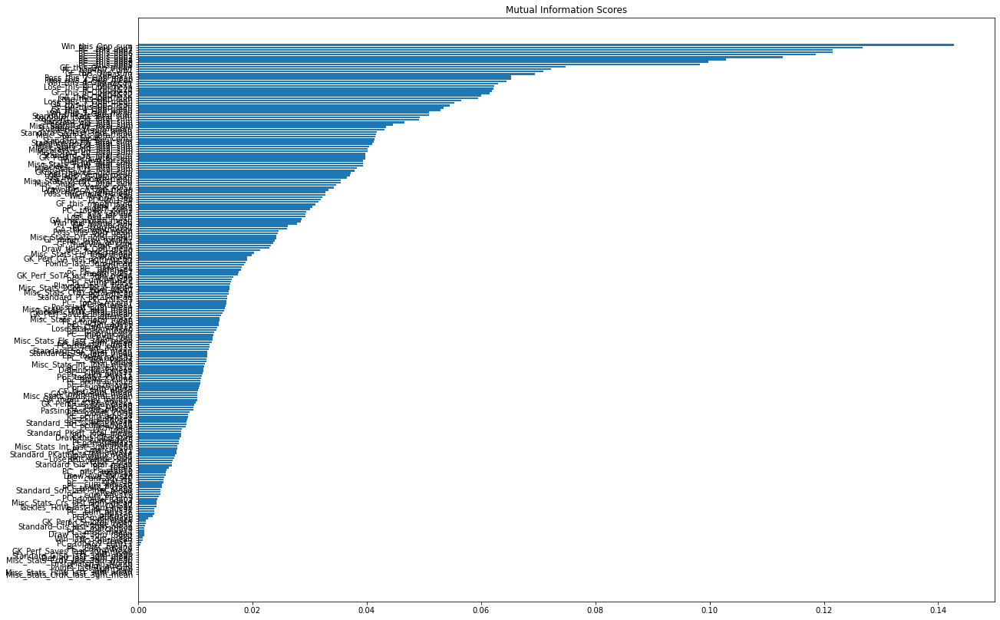

In [304]:
mi_scores_1 = make_mi_scores_Classif(X_train=a.drop(['Win','Season',"Team", "Opponent", "Result"],axis=1).reset_index(drop=True), y_train=a['Win'])
plot_mi_scores(scores=mi_scores_1)

In [305]:
mi_scores_1.to_dict()

{'Win_this_Opp_sum': 0.1427362366488656,
 'PC__this_opp1': 0.12671907794430237,
 'PC__this_opp7': 0.12156117337007832,
 'PC__this_opp6': 0.12148481044207315,
 'PC__this_opp2': 0.1185437762935666,
 'PC__this_opp3': 0.11282606374736259,
 'PC__this_opp4': 0.10286694091802073,
 'PC__this_opp8': 0.09976326755678788,
 'PC__this_opp5': 0.09833037975188486,
 'GF_this_Opp_mean': 0.07474718288189042,
 'PC__top4&7_cum1': 0.07230243871184983,
 'GF_this_Opp_sum': 0.07089002382401377,
 'PC__top4&73': 0.06944899389186565,
 'Poss_this_7_Opp_mean': 0.06529977488730698,
 'Poss_this_4_Opp_mean': 0.06529697948936208,
 'Win_this_4_Opp_mean': 0.06448955849178817,
 'PC__top4&71': 0.06297025380552346,
 'Lose_this_4_Opp_mean': 0.06233867987868802,
 'PC__top4&74': 0.06222886544345596,
 'GF_this_7_Opp_mean': 0.0619536845438482,
 'PC__top4&72': 0.06155568668492739,
 'GA_this_Opp_mean': 0.06002548631398752,
 'Lose_this_Opp_sum': 0.05954747752801248,
 'Lose_this_7_Opp_mean': 0.05659032376924156,
 'GA_this_7_Opp_mea

In [306]:
topk = mi_scores_1[mi_scores_1>0].index.to_list()

In [307]:
len(topk)

209

Precision_score :Win  0.8577844311377245


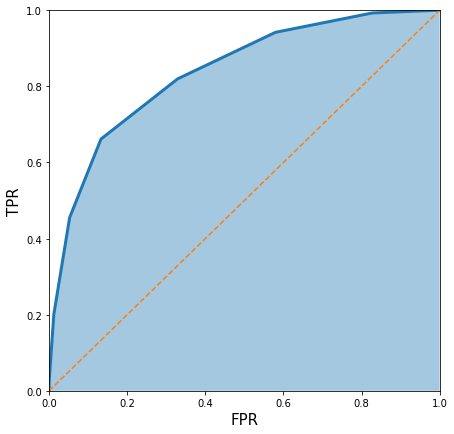

Win ROC :  0.8443675343620118


,Team,Opponent,Result,Target,Predictions,Probs,Season
1000,Cardiff City,Brighton,W,1,1.0,0.754214,2019
1001,Cardiff City,Everton,L,0,0.0,0.146490,2019
1002,Cardiff City,Wolves,W,1,1.0,0.737372,2019
1003,Cardiff City,West Ham,L,0,0.0,0.241978,2019
1004,Cardiff City,Southampton,W,1,1.0,0.621200,2019
...,...,...,...,...,...,...,...
4059,Wolverhampton Wanderers,Brighton,L,0,0.0,0.454343,2022
4060,Wolverhampton Wanderers,Chelsea,D,0,0.0,0.327587,2022
4061,Wolverhampton Wanderers,Manchester City,L,0,0.0,0.336007,2022
4062,Wolverhampton Wanderers,Norwich City,D,0,0.0,0.445073,2022


In [328]:
backtest(data=a, model=rf, predictors=p, start=1000, step=750,target='Win')

In [321]:
a.shape ,df4.shape

((4064, 225), (4064, 213))

In [339]:
dv = DictVectorizer(sparse=False)
train_dicts = df4.drop(dd,axis=1).to_dict(orient='records')
dv.fit(train_dicts)
train_matrix= dv.transform(train_dicts)
train_matrix.shape
dv.get_feature_names_out().shape

(310,)

In [338]:
dd ='Captain	Formation	Referee	Opponent_Count'.split('\t')

In [ ]:
d

In [345]:
310 -df4.shape[1]

97

In [341]:
a.shape

(4064, 225)

In [346]:
310-225

85

In [348]:
df4.prev_comp.value_counts()

Premier League    3234
FA Cup             296
Champions Lg       201
EFL Cup            199
Europa             134
Name: prev_comp, dtype: int64

In [347]:
df4.drop(dd,axis=1).select_dtypes('O')

,Comp,Venue,Result,Opponent,Team,prev_opp,prev_comp
4,Premier League,Home,W,Bournemouth,Arsenal,Liverpool,Premier League
5,Europa,Home,W,Europa,Arsenal,Bournemouth,Premier League
6,Premier League,Away,D,Chelsea,Arsenal,Europa,Europa
8,Premier League,Home,W,West Brom,Arsenal,EFL Cup,EFL Cup
9,Europa,Away,W,Europa,Arsenal,West Brom,Premier League
...,...,...,...,...,...,...,...
4778,Premier League,Home,L,Brighton,Wolverhampton Wanderers,Burnley,Premier League
4779,Premier League,Away,D,Chelsea,Wolverhampton Wanderers,Brighton,Premier League
4780,Premier League,Home,L,Manchester City,Wolverhampton Wanderers,Chelsea,Premier League
4781,Premier League,Home,D,Norwich City,Wolverhampton Wanderers,Manchester City,Premier League


In [340]:
dv.get_feature_names_out()

array(['Avg_Draw/GA', 'Avg_Draw/GF', 'Avg_GF/GA', 'Avg_GF_GA+-',
       'Avg_Loss/GA', 'Avg_Loss/GF', 'Avg_Pts/GA', 'Avg_Pts/GF',
       'Avg_Pts/Loss', 'Avg_Pts/Win', 'Avg_Win/Draw', 'Avg_Win/GA',
       'Avg_Win/GF', 'Avg_Win/Loss', 'Captain_Count', 'Captain_Rank',
       'Comp=Champions Lg', 'Comp=EFL Cup', 'Comp=Europa', 'Comp=FA Cup',
       'Comp=Premier League', 'Day_of_week', 'Def_Int_Total_mean',
       'Def_Int_Total_sum', 'Def_Int_last_3gm_mean', 'Draw',
       'Draw_Avg_for_szn', 'Draw_last_3gm_mean', 'Draw_this_4_Opp_mean',
       'Draw_this_7_Opp_mean', 'Draw_this_Opp_sum', 'Draw_this_Venue_sum',
       'First_Match_In_Month', 'Formation_count', 'GA', 'GA_Avg_for_szn',
       'GA_last_3gm_mean', 'GA_mean_prev_month_', 'GA_this_4_Opp_mean',
       'GA_this_7_Opp_mean', 'GA_this_Opp_mean', 'GA_this_Opp_sum',
       'GA_this_Venue_mean', 'GA_this_Venue_sum', 'GA_this_month_mean',
       'GA_this_month_sum', 'GF', 'GF_Avg_for_szn', 'GF_last_3gm_mean',
       'GF_mean_prev_mon

In [349]:
df5 = df4.reset_index(drop=True)

In [350]:
df5.head()

,Comp,Venue,Result,GF,GA,Opponent,Captain,Formation,Referee,Team,Season,Month,Win,Draw,Lose,Points,Total_Points,Total_GF,Total_GA,Total_Win,Total_Draw,Total_Loss,Points_Avg_for_szn,GF_Avg_for_szn,GA_Avg_for_szn,Win_Avg_for_szn,Draw_Avg_for_szn,Loss_Avg_for_szn,Points_last_1gm_sum,Points_last_3gm_mean,Win_last_3gm_mean,Draw_last_3gm_mean,Lose_last_3gm_mean,GF_last_3gm_mean,GA_last_3gm_mean,Poss_last_3gm_mean,Played_Opp_X_times,GF_this_month_sum,GA_this_month_sum,GF_this_month_mean,GA_this_month_mean,GF_mean_prev_month_,GA_mean_prev_month_,Poss_this_month_mean,Poss_mean_prev_month_,Captain_Rank,Poss_this_Venue_mean,GF_this_Venue_mean,GA_this_Venue_mean,Win_this_Venue_sum,Lose_this_Venue_sum,Draw_this_Venue_sum,GF_this_Venue_sum,GA_this_Venue_sum,Poss_this_Opp_mean,GA_this_Opp_mean,GF_this_Opp_mean,Win_this_Opp_sum,Lose_this_Opp_sum,Draw_this_Opp_sum,GA_this_Opp_sum,GF_this_Opp_sum,Day_of_week,Kick_off_hr,Kick_off_min,First_Match_In_Month,Opponent_Count,prev_opp,prev_comp,Rest,Rest_hrs,Top7_Opp,Top7_Team,Top4_Opp,Top4_Team,Referee_Count,Ref_rank,Captain_Count,Poss_this_7_Opp_mean,GF_this_7_Opp_mean,GA_this_7_Opp_mean,Win_this_7_Opp_mean,Lose_this_7_Opp_mean,Draw_this_7_Opp_mean,Poss_this_4_Opp_mean,GF_this_4_Opp_mean,GA_this_4_Opp_mean,Win_this_4_Opp_mean,Lose_this_4_Opp_mean,Draw_this_4_Opp_mean,Formation_count,Na_count,Tot_Pts/Win,Tot_Pts/Loss,Tot_Pts/Draw,Tot_Pts/GF,Tot_Pts/GA,Tot_Win/Loss,Tot_Win/Draw,Tot_Draw/Loss,Tot_Win/GF,Tot_Loss/GA,Tot_Draw/GF,Tot_GF/GA,Tot_GF_GA_+-,Avg_Pts/Win,Avg_Pts/Loss,Avg_Pts/GF,Avg_Pts/GA,Avg_Win/GA,Avg_Win/GF,Avg_Win/Loss,Avg_Win/Draw,Avg_Loss/GA,Avg_Loss/GF,Avg_Draw/GF,Avg_Draw/GA,Avg_GF/GA,Avg_GF_GA+-,l2_Win/GA,l2_Win/GF,l2_Win/Loss,l2g_Win/Draw,l2g_Loss/GA,l2g_Loss/GF,l2g_Draw/GF,l2g_Draw/GA,l2g_GF/GA,l2g_GF_GA+-,l3_Win/GA,l3_Win/Loss,l3g_Win/Draw,l3g_Loss/GA,l3g_Loss/GF,l3g_Draw/GF,l3g_Draw/GA,l3g_GF/GA,l3g_GF_GA+-,this_month_sum_Win/GA,this_month_sum_GF/GA,this_month_sum_GF_GA+-,Standard_SoT%_last_3gm_mean,Standard_G/Sh_last_3gm_mean,Standard_Sh_last_3gm_mean,Standard_SoT_last_3gm_mean,Standard_Gls_last_3gm_mean,Standard_PK_last_3gm_mean,Standard_PKatt_last_3gm_mean,Passing_Ast_last_3gm_mean,Tackles_TklW_last_3gm_mean,Def_Int_last_3gm_mean,GK_Perf_SoTA_last_3gm_mean,GK_Perf_Saves_last_3gm_mean,GK_Perf_GA_last_3gm_mean,GK_Perf_CS_last_3gm_mean,Misc_Stats_Off_last_3gm_mean,Misc_Stats_Fls_last_3gm_mean,Misc_Stats_Fld_last_3gm_mean,Misc_Stats_Crs_last_3gm_mean,Misc_Stats_Int_last_3gm_mean,Misc_Stats_TklW_last_3gm_mean,Misc_Stats_CrdY_last_3gm_mean,Misc_Stats_CrdR_last_3gm_mean,Misc_Stats_2CrdY_last_3gm_mean,Misc_Stats_OG_last_3gm_mean,Standard_SoT%_Total_sum,Standard_G/Sh_Total_sum,Standard_Sh_Total_sum,Standard_SoT_Total_sum,Standard_Gls_Total_sum,Standard_PK_Total_sum,Standard_PKatt_Total_sum,Passing_Ast_Total_sum,Tackles_TklW_Total_sum,Def_Int_Total_sum,GK_Perf_SoTA_Total_sum,GK_Perf_Saves_Total_sum,GK_Perf_GA_Total_sum,GK_Perf_CS_Total_sum,Misc_Stats_Off_Total_sum,Misc_Stats_Fls_Total_sum,Misc_Stats_Fld_Total_sum,Misc_Stats_Crs_Total_sum,Misc_Stats_Int_Total_sum,Misc_Stats_TklW_Total_sum,Misc_Stats_CrdY_Total_sum,Misc_Stats_CrdR_Total_sum,Misc_Stats_2CrdY_Total_sum,Misc_Stats_OG_Total_sum,Standard_SoT%_Total_mean,Standard_G/Sh_Total_mean,Standard_Sh_Total_mean,Standard_SoT_Total_mean,Standard_Gls_Total_mean,Standard_PK_Total_mean,Standard_PKatt_Total_mean,Passing_Ast_Total_mean,Tackles_TklW_Total_mean,Def_Int_Total_mean,GK_Perf_SoTA_Total_mean,GK_Perf_Saves_Total_mean,GK_Perf_GA_Total_mean,GK_Perf_CS_Total_mean,Misc_Stats_Off_Total_mean,Misc_Stats_Fls_Total_mean,Misc_Stats_Fld_Total_mean,Misc_Stats_Crs_Total_mean,Misc_Stats_Int_Total_mean,Misc_Stats_TklW_Total_mean,Misc_Stats_CrdY_Total_mean,Misc_Stats_CrdR_Total_mean,Misc_Stats_2CrdY_Total_mean,Misc_Stats_OG_Total_mean
0,Premier League,Home,W,3,0,Bournemouth,Laurent Koscielny,3-4-3,Anthony Taylor,Arsenal,2018,9,1,0,0,3,4.0,5.0,9.0,1.0,1.0,2.0,1.000000,1.250000,2.250000,0.250000,0.250000,0.500000,0.0,1.000000,0.333333,0.000000,0.666667,1.33

In [352]:
a_df = pd.concat([a,df5.loc[:,'Comp	Venue	prev_opp	prev_comp'.split('	')]],axis=1)
a_df

,PC__total2,Total_Win,Total_GF,PC__total4,Total_Loss,Total_Points,PC__total5,PC__total1,Total_Draw,Total_GA,PC__total6,Win_Avg_for_szn,Points_Avg_for_szn,GF_Avg_for_szn,Loss_Avg_for_szn,PC__szn_avg1,GA_Avg_for_szn,PC__szn_avg3,PC__szn_avg4,Draw_Avg_for_szn,PC__szn_avg6,PC__rol1-34,Poss_last_3gm_mean,PC__rol1-33,Points_last_3gm_mean,GF_last_3gm_mean,PC__rol1-31,Lose_last_3gm_mean,Played_Opp_X_times,Points_last_1gm_sum,Draw_last_3gm_mean,GA_last_3gm_mean,PC__rol1-38,PC__rol1-32,Win_last_3gm_mean,GF_this_month_mean,PC__month_cols1,GF_this_month_sum,Poss_this_month_mean,GA_this_month_mean,PC__month_cols7,GF_mean_prev_month_,GA_this_month_sum,PC__month_cols4,GA_mean_prev_month_,PC__month_cols6,GF_this_Venue_mean,Poss_this_Venue_mean,PC__venue_cols1,Win_this_Venue_sum,GF_this_Venue_sum,GA_this_Venue_mean,Lose_this_Venue_sum,PC__venue_cols5,PC__venue_cols4,PC__venue_cols2,Win_this_Opp_sum,PC__this_opp6,PC__this_opp1,PC__this_opp7,PC__this_opp2,PC__this_opp3,PC__this_opp4,PC__this_opp8,PC__this_opp5,Lose_this_Opp_sum,GF_this_Opp_mean,GF_this_Opp_sum,GA_this_Opp_mean,Poss_this_Opp_mean,GA_this_Opp_sum,Draw_this_Opp_sum,PC__matchday1,PC__matchday5,Rest_hrs,Kick_off_min,PC__matchday4,Rest,PC__matchday6,PC__matchday3,First_Match_In_Month,PC__top4&72,PC__top4&74,PC__top4&73,PC__top4&71,Top4_Opp,Top7_Team,Top7_Opp,Top4_Team,PC__top4&7_cum1,Poss_this_4_Opp_mean,Poss_this_7_Opp_mean,Win_this_7_Opp_mean,GF_this_7_Opp_mean,Lose_this_7_Opp_mean,Win_this_4_Opp_mean,Lose_this_4_Opp_mean,GF_this_4_Opp_mean,GA_this_7_Opp_mean,GA_this_4_Opp_mean,PC__top4&7_cum3,PC__top4&7_cum2,Draw_this_4_Opp_mean,Draw_this_7_Opp_mean,PC__top4&7_cum7,PC__top4&7_cum6,PC__top4&7_cum10,PC__top4&7_cum4,PC__top4&7_cum8,PC__top4&7_cum12,PC__top4&7_cum5,PC__top4&7_cum9,PC__top4&7_cum11,Standard_Gls_last_3gm_mean,Standard_SoT_last_3gm_mean,PC__offense1,PC__offense2,Standard_Sh_last_3gm_mean,PC__offense3,Standard_G/Sh_last_3gm_mean,Standard_PKatt_last_3gm_mean,PC__offense6,GK_Perf_SoTA_last_3gm_mean,PC__defense4,PC__defense1,Tackles_TklW_last_3gm_mean,GK_Perf_GA_last_3gm_mean,PC__defense2,Def_Int_last_3gm_mean,GK_Perf_Saves_last_3gm_mean,PC__defense5,PC__defense6,PC__defense3,PC__misc_mean9,PC__misc_mean6,PC__misc_mean8,Misc_Stats_CrdY_last_3gm_mean,Misc_Stats_CrdR_last_3gm_mean,PC__misc_mean10,Misc_Stats_Int_last_3gm_mean,Misc_Stats_Fls_last_3gm_mean,Misc_Stats_TklW_last_3gm_mean,Misc_Stats_Crs_last_3gm_mean,PC__misc_mean4,PC__misc_mean2,Passing_Ast_Total_sum,Misc_Stats_CrdR_Total_sum,Standard_G/Sh_Total_sum,Misc_Stats_CrdY_Total_sum,Standard_Gls_Total_sum,Standard_SoT_Total_sum,Standard_PKatt_Total_sum,Misc_Stats_Fls_Total_sum,Standard_SoT%_Total_sum,Standard_Sh_Total_sum,Def_Int_Total_sum,Misc_Stats_Fld_Total_sum,Misc_Stats_TklW_Total_sum,Misc_Stats_Int_Total_sum,GK_Perf_Saves_Total_sum,Tackles_TklW_Total_sum,GK_Perf_SoTA_Total_sum,Misc_Stats_Crs_Total_sum,Misc_Stats_Off_Total_sum,GK_Perf_CS_Total_sum,Standard_PK_Total_sum,GK_Perf_GA_Total_sum,Misc_Stats_OG_Total_sum,Misc_Stats_2CrdY_Total_sum,PC__cum_advs1,Misc_Stats_Off_Total_mean,PC__cum_advs44,Misc_Stats_Fls_Total_mean,PC__cum_advs27,PC__cum_advs4,PC__cum_advs7,Tackles_TklW_Total_mean,GK_Perf_Saves_Total_mean,Misc_Stats_TklW_Total_mean,Misc_Stats_2CrdY_Total_mean,Misc_Stats_CrdY_Total_mean,Misc_Stats_Fld_Total_mean,Standard_PK_Total_mean,PC__cum_advs6,PC__cum_advs17,PC__cum_advs48,PC__cum_advs35,Standard_G/Sh_Total_mean,Standard_SoT_Total_mean,PC__cum_advs32,Def_Int_Total_mean,PC__cum_advs14,Misc_Stats_Int_Total_mean,PC__cum_advs37,PC__cum_advs11,Passing_Ast_Total_mean,PC__cum_advs22,PC__cum_advs9,Misc_Stats_CrdR_Total_mean,PC__cum_advs21,GK_Perf_GA_Total_mean,PC__cum_advs28,PC__cum_advs34,PC__cum_advs36,Standard_SoT%_Total_mean,PC__cum_advs16,Standard_PKatt_Total_mean,PC__cum_advs8,PC__cum_advs5,PC__cum_advs43,Standard_Gls_Total_mean,PC__cum_advs40,PC__cum_advs25,PC__cum_advs30,PC__cum_advs15,PC__cum_advs31,PC__cum_advs38,GK_Perf_CS_Total_mean,PC__cum_advs29,PC__cum_advs45,Win,Season,Team,Opponent,Result,Comp,Venue,pr

In [18]:
def backtest(data, model,target, predictors, start=1000, step=750,thresh=.6):
    data = data.loc[:,~data.columns.duplicated()]
    predictions = []
    # Loop over the dataset in increments
    for i in range(start, data.shape[0], step):
        # Split into train and test sets
        train = data.iloc[0:i].copy()
        test = data.iloc[i:(i+step)].copy()
        
        #dict_vectorizer
        dv = DictVectorizer(sparse=False)
        train_dicts = train[predictors].to_dict(orient='records')
        test_dicts = test[predictors].to_dict(orient='records')
        dv.fit(train_dicts)
        train_matrix= dv.transform(train_dicts)
        test_matrix= dv.transform(test_dicts)
        print('train_matrix.shape : ',train_matrix.shape)
        #dv.get_feature_names_out().shape
        
        # Fit the random forest model
        model.fit(train_matrix, train[target])
        
        # Make predictions
        preds_probs = model.predict_proba(test_matrix)[:,1]
        preds_probs = pd.Series(preds_probs, index=test.index)
        preds = preds_probs.copy()
        preds[preds > thresh] = 1
        preds[preds<= thresh] = 0
        
        # Combine predictions and test values
        combined = pd.concat({'Team':test['Team'],'Opponent':test['Opponent'],'Result':test['Result'],"Target": test[target],"Predictions": preds,"Probs":preds_probs,'Season':test['Season']}, axis=1)
        
        predictions.append(combined)
    out_df = pd.concat(predictions)
    print(f'Precision_score :{target} ',precision_score(out_df.Target,out_df.Predictions))
    best_thresh_curve(y_true=out_df.Target,y_proba_score=out_df.Probs)
    print(f"{target} ROC : ",roc_auc_score(out_df.Target,out_df.Probs))
    return out_df

In [355]:
cats = 'Comp	Venue	prev_opp	prev_comp'.split('	')

In [357]:
p.extend(cats)

AttributeError: 'Index' object has no attribute 'extend'

train_matrix.shape :  (1000, 263)
train_matrix.shape :  (1750, 265)
train_matrix.shape :  (2500, 265)
train_matrix.shape :  (3250, 265)
train_matrix.shape :  (4000, 265)
Precision_score :Win  0.8582434514637904


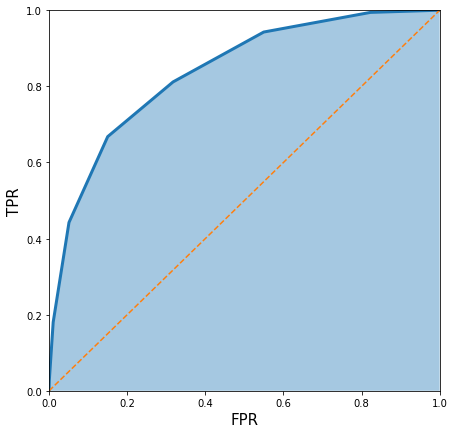

Win ROC :  0.8450491640245633


,Team,Opponent,Result,Target,Predictions,Probs,Season
1000,Cardiff City,Brighton,W,1,1.0,0.699020,2019
1001,Cardiff City,Everton,L,0,0.0,0.170919,2019
1002,Cardiff City,Wolves,W,1,1.0,0.732533,2019
1003,Cardiff City,West Ham,L,0,0.0,0.194130,2019
1004,Cardiff City,Southampton,W,1,1.0,0.645731,2019
...,...,...,...,...,...,...,...
4059,Wolverhampton Wanderers,Brighton,L,0,0.0,0.476257,2022
4060,Wolverhampton Wanderers,Chelsea,D,0,0.0,0.373633,2022
4061,Wolverhampton Wanderers,Manchester City,L,0,0.0,0.322050,2022
4062,Wolverhampton Wanderers,Norwich City,D,0,0.0,0.366881,2022


In [358]:
backtest(data=a_df, model=rf, predictors=p.to_list()+cats, start=1000, step=750,target='Win')

In [360]:
rf2 = RandomForestClassifier( **{'n_estimators': 200,
  'max_depth': 15.0,
  'min_samples_split': 15,
  'min_samples_leaf': 15,
  'max_features': 'sqrt'})

train_matrix.shape :  (1000, 263)
train_matrix.shape :  (1750, 265)
train_matrix.shape :  (2500, 265)
train_matrix.shape :  (3250, 265)
train_matrix.shape :  (4000, 265)
Precision_score :Win  0.8335419274092616


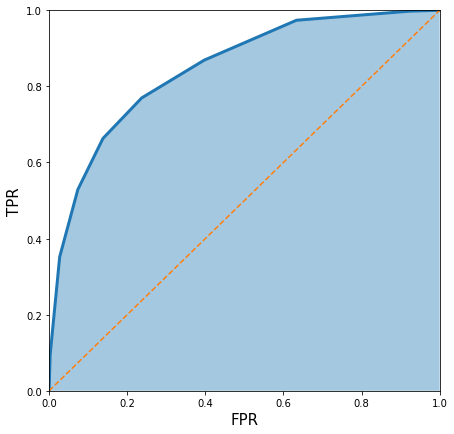

Win ROC :  0.8523807533129886


,Team,Opponent,Result,Target,Predictions,Probs,Season
1000,Cardiff City,Brighton,W,1,0.0,0.581538,2019
1001,Cardiff City,Everton,L,0,0.0,0.141260,2019
1002,Cardiff City,Wolves,W,1,0.0,0.579759,2019
1003,Cardiff City,West Ham,L,0,0.0,0.108851,2019
1004,Cardiff City,Southampton,W,1,0.0,0.477447,2019
...,...,...,...,...,...,...,...
4059,Wolverhampton Wanderers,Brighton,L,0,0.0,0.525751,2022
4060,Wolverhampton Wanderers,Chelsea,D,0,0.0,0.236356,2022
4061,Wolverhampton Wanderers,Manchester City,L,0,0.0,0.210817,2022
4062,Wolverhampton Wanderers,Norwich City,D,0,0.0,0.386035,2022


In [361]:
backtest(data=a_df, model=rf2, predictors=p.to_list()+cats, start=1000, step=750,target='Win')